In [2]:
import warnings
warnings.filterwarnings('ignore')

In [163]:
from dateutil.parser import parse 
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
plt.rcParams.update({'figure.figsize': (10, 7), 'figure.dpi': 120})
import plotly.express as px

In [339]:
df = pd.read_csv('/Users/neharajput/Downloads/Visualization_Dataset_Python.csv', parse_dates=['Date Timestamp'])

,Date Timestamp,TagName,Naming,Severity
0,2018-12-01 01:02:00,HTCP-3196,Others,3
1,2018-12-01 01:08:00,HTCP-3196,Others,3
2,2018-12-01 01:14:00,HTCP-3196,Others,3
3,2018-12-01 01:23:00,HTCP-3196,Others,3
4,2018-12-01 01:28:00,HTCP-3196,Others,3
...,...,...,...,...
85392,2020-10-26 15:12:00,PM-3505,Pressure,3
85393,2020-10-26 16:02:00,PM-3505,Pressure,3
85394,2020-11-14 05:29:00,MM-3504,Others,1
85395,2020-11-14 05:29:00,PM-3505,Pressure,3


In [344]:
df

,Date Timestamp,TagName,Naming,Severity
0,2018-12-01 01:02:00,HTCP-3196,Others,3
1,2018-12-01 01:08:00,HTCP-3196,Others,3
2,2018-12-01 01:14:00,HTCP-3196,Others,3
3,2018-12-01 01:23:00,HTCP-3196,Others,3
4,2018-12-01 01:28:00,HTCP-3196,Others,3
...,...,...,...,...
85392,2020-10-26 15:12:00,PM-3505,Pressure,3
85393,2020-10-26 16:02:00,PM-3505,Pressure,3
85394,2020-11-14 05:29:00,MM-3504,Others,1
85395,2020-11-14 05:29:00,PM-3505,Pressure,3


# Analysis of Alarms within 1 min Interval by resampling

In [340]:
df_1min=df.resample('T',on='Date Timestamp').count()
df_1min_final=df_1min[df_1min['TagName']> 0]
df_1min

,Date Timestamp,TagName,Naming,Severity
Date Timestamp,,,,
2018-03-12 04:15:00,1,1,1,1
2018-03-12 04:16:00,0,0,0,0
2018-03-12 04:17:00,0,0,0,0
2018-03-12 04:18:00,0,0,0,0
2018-03-12 04:19:00,0,0,0,0
...,...,...,...,...
2020-12-11 16:45:00,0,0,0,0
2020-12-11 16:46:00,0,0,0,0
2020-12-11 16:47:00,0,0,0,0


In [341]:
df['Date Timestamp'].dt.floor('Min')

0       2018-12-01 01:02:00
1       2018-12-01 01:08:00
2       2018-12-01 01:14:00
3       2018-12-01 01:23:00
4       2018-12-01 01:28:00
                ...        
85392   2020-10-26 15:12:00
85393   2020-10-26 16:02:00
85394   2020-11-14 05:29:00
85395   2020-11-14 05:29:00
85396   2020-11-19 12:19:00
Name: Date Timestamp, Length: 85397, dtype: datetime64[ns]

In [342]:
df_1min_final.TagName.count()

57962

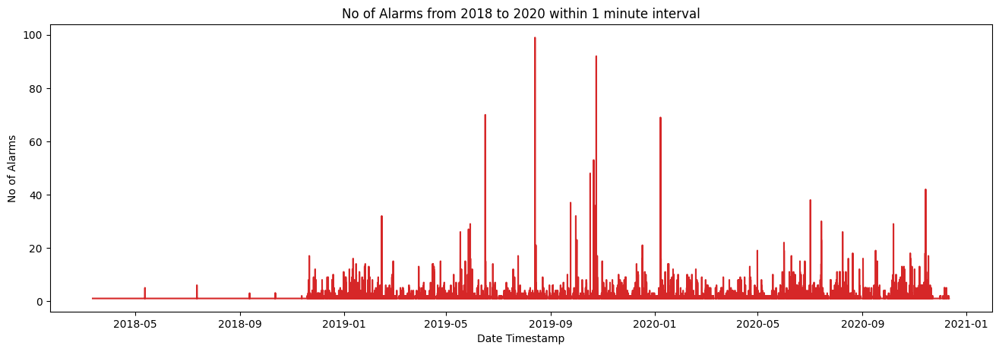

In [324]:
# Draw Plot
def plot_df(df, x, y, title="", xlabel='Date Timestamp', ylabel='No of Alarms', dpi=100):
    plt.figure(figsize=(16,5), dpi=dpi)
    plt.plot(x, y, color='tab:red')
    plt.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plt.show()
    
    

plot_df(df_1min_final, x=df_1min_final.index, y=df_1min_final.TagName, title='No of Alarms from 2018 to 2020 within 1 minute interval')


As we see from the above plot, there is a spike in the number of alarms during Late July to August 2019, Nov-Dec 2019 and Jan 2020

# Analysis of Alarms within 5 min interval

In [337]:
df_5T=df.resample('5T',on='Date_Timestamp').count()
df_5T_final=df_5T[df_5T['TagName']> 0]
df_5T_final

,Date_Timestamp,TagName,Naming,Severity
Date_Timestamp,,,,
2018-03-12 04:15:00,1,1,1,1
2018-03-12 04:30:00,1,1,1,1
2018-03-12 06:45:00,1,1,1,1
2018-03-12 19:15:00,1,1,1,1
2018-03-12 19:20:00,1,1,1,1
...,...,...,...,...
2020-12-11 02:15:00,1,1,1,1
2020-12-11 02:20:00,1,1,1,1
2020-12-11 02:35:00,3,3,3,3


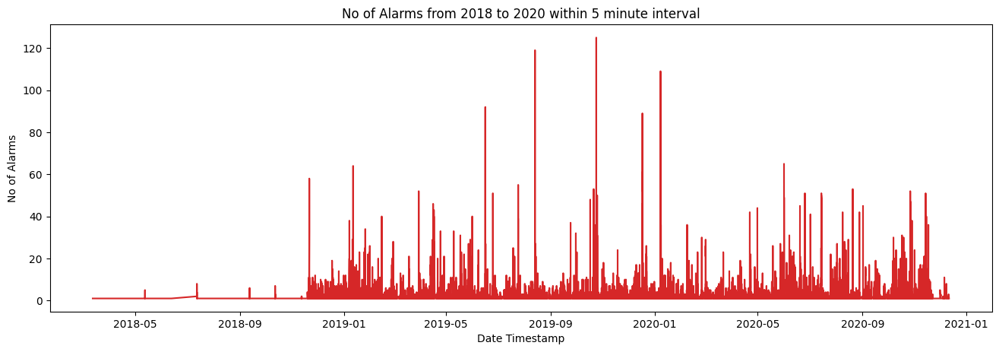

In [338]:
# Draw Plot
def plot_df(df, x, y, title="", xlabel='Date Timestamp', ylabel='No of Alarms', dpi=100):
    plt.figure(figsize=(16,5), dpi=dpi)
    plt.plot(x, y, color='tab:red')
    plt.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plt.show()
    
    

plot_df(df_5T_final, x=df_5T_final.index, y=df_5T_final.TagName, title='No of Alarms from 2018 to 2020 within 5 minute interval')

During 5 min interval as well, spike is seen during the same time period as 1 min interval

# Analysis of Alarms within 1 hour interval

In [347]:
df_1H=df.resample('H',on='Date Timestamp').count()
df_1H_final=df_1H[df_1H['TagName']> 0]
df_1H_final.sort_values(by=['TagName'], axis=0, ascending=False, inplace=False)

,Date Timestamp,TagName,Naming,Severity
Date Timestamp,,,,
2019-12-17 14:00:00,688,688,688,688
2020-08-20 13:00:00,270,270,270,270
2019-12-17 15:00:00,258,258,258,258
2019-01-11 23:00:00,226,226,226,226
2020-05-31 21:00:00,217,217,217,217
...,...,...,...,...
2019-09-22 22:00:00,1,1,1,1
2020-06-13 07:00:00,1,1,1,1
2019-09-22 21:00:00,1,1,1,1


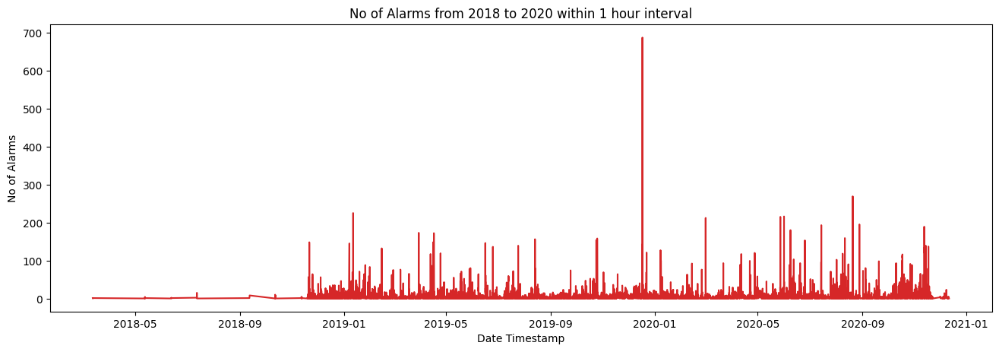

In [348]:
# Draw Plot
def plot_df(df, x, y, title="", xlabel='Date Timestamp', ylabel='No of Alarms', dpi=100):
    plt.figure(figsize=(16,5), dpi=dpi)
    plt.plot(x, y, color='tab:red')
    plt.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plt.show()
    
    

plot_df(df_1H_final, x=df_1H_final.index, y=df_1H_final.TagName, title='No of Alarms from 2018 to 2020 within 1 hour interval')

# Identifying Alarm Sequencing

In order to understand the behaviour of Alarms and identify which Alarms have a tendency to occur together, sequences of alarms were created by bucketing In alarms that occur within 5 minutes of each other. 

In [351]:
df.rename(columns = {'Date Timestamp':'Date_Timestamp'}, inplace = True)

In [352]:
df.set_index('Date_Timestamp',inplace=True)

In [353]:
resampled_final_alarm=df.resample('5min').count()

In [354]:
resampled_basic= resampled_final_alarm[resampled_final_alarm.sum(axis=1)>0]

In [355]:
resampled_basic

,TagName,Naming,Severity
Date_Timestamp,,,
2018-03-12 04:15:00,1,1,1
2018-03-12 04:30:00,1,1,1
2018-03-12 06:45:00,1,1,1
2018-03-12 19:15:00,1,1,1
2018-03-12 19:20:00,1,1,1
...,...,...,...
2020-12-11 02:15:00,1,1,1
2020-12-11 02:20:00,1,1,1
2020-12-11 02:35:00,3,3,3


In [356]:
def five_minute_bucketing(x):
    x = ' , '.join(x.values)
    print(x)
    return x

In [357]:
def ten_minute_bucketing(x):
    lst=[]
    in_lst=[]
    for i in x.values:
        count=1
        if i in lst[0]:
            for j,item in enumerate(lst):
                  if item[0]==i:
                        count=item[1]+1
                        lst[lst.index([[item[0],item[1]]])]=count
                        break
                        
        else:
            lst.append([i,count])
    return lst
    

In [358]:
resampled_task_10mins=df.resample('10min').agg({'TagName':[five_minute_bucketing]})

LAL-3801C

LAH-3801C












LAL-3801B










































































TAL-3730A
TAL-3730A










TAL-3730A



TAH-3730A
TAL-3730A



TAL-3730A

























































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































LAH-3801C

























LAH-3503B










LAH-3801C , LIT-3801C , LAL-3801C , LAH-3801C , LAL-3801C





LAH-3801C
LAH-3801C
LAH-3801C

















































































































































































































































































































































































































































































































































































































































































































PT-3490A , PT-3490A

PT-3490B

PT-3490A , PT-3490A , PT-3490A , PT-3490A , PT-3490A
TAL-3730A
TAH-3730A , TAHH-3730A , FAL-3452A , FALL-3452A , FAL-3126A , FAL-3452A , FALL-3452A , TAH-3730A , FAL-3126A

TAL-3730A






LAL-3801B





























































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































LAH-3801B
LAH-3503B









LAH-3801B , LAH-3801B

LAH-3801B , LAH-3801B








LAH-3801B
LAH-3801B
LAH-3801B , LAH-3801B , LAH-3801B , LAH-3801B , LAH-3801B , LAH-3801B
LAL-3801B















































































































































































































































































































































































































































































































































































































TAL-3730A

TAL-3730A





TAL-3730A
TAL-3730A
TAL-3730A







TAL-3730A
TAH-3730A , TAL-3730A

TAL-3730A

TAL-3730A
TAH-3730A , TAL-3730A







TAL-3730A , TAH-3730A
TAL-3730A

TAL-3730A










TAL-3730A
TAL-3730A
LAL-3801B



















FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A
PM-3451B






TAL-3730A , TAH-3730A
TAL-3730A

TAL-3730A
TAL-3730A


TAL-3730A

TAL-3730A

TAL-3730A
TAL-3730A
TAL-3730A





TAL-3730A


TAL-3730A
TAL-3730A















































































































EAL-3000
EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000
EAL-3000 , EAL-3000

LAL-3503 , LAL-3503

LAL-3503 , LAL-3503 , LAL-3503
LAL-3503 , LAL-3503 , EAL-3000 , LAL-3503 , LAL-3503 , LAL-3503 , EAL-3000
EAL-3000 , EAL-3000 , EAL-3000
TAL-3652 , HTCP-3196 , TAL-3526 , XA-3000 , XASS-3140 , LAL-3507 , EAL-3000 , XA-3160C , PM-3801C , EAL-3000




FAL-3539 , LAL-3516B














AAH-3042 , AAHH-3042



FAL-3539

LAH-3171
LAH-3171 , LAH-3171
LAH-3171
LAH-3171




AAH-3032









AAH-3032 , AAH-3032





AAH-3042









AAH-3032 , AAH-3032 , AAH-3032 , AAH-3032






AAHH-3032





















LAL-3271 , LAL-3271



AAH-3042 , AAH-3042
AAH-3042
AAH-3042
AAHH-3042














LAH-3503B





AAHH-3042



FAL-3539









AAH-3042 , AAH-3042
AAH-3042 , AAH-3042 , AAH-3042


AAH-3042 , LAH-3171
LAH-3171 , AAH-3042
AAH-3042 , AAH-3042


AAH-3042

AAH-3042 , AAH-3042 , AAH-3042 , LAH-3171 , LAH-3171
LAH-3171 , AAHH-3032
LAH-3171 , L

LAL-3503




PIT-3029-FLT





















FIT-3281-FLT















































FIT-3281-FLT




LAH-3271






LAH-3271
LAH-3271




LAH-3171
LAH-3171
LAH-3171 , LAH-3171
UXA-3138
LAH-3171





LAH-3171
LAH-3171 , LAH-3171 , LAH-3171 , LAH-3171
LAH-3171 , LAH-3171
LAH-3171
LAH-3171
LAL-3503


FIT-3281-FLT , LAH-3171 , LAH-3171 , LAH-3171
LAL-3800
LAH-3171 , LAH-3171 , LAH-3271 , LAH-3171
LAH-3271
LAH-3271
LAH-3271 , LAH-3271 , LAH-3271
LAH-3800







LAH-3271

LAH-3271 , LAH-3271







FIT-3281-FLT




























PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT

PIT-3029-FLT , PIT-3029-FLT









PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT


LAL-3801B
















PIT-3029-FLT , PIT-3029-FLT











PIT-3029-FLT
LAL-3052 , LAH-3800

PIT-3029-FLT







AAHH-3032 , AAHH-3032 , AAHH-3032


AAHH-3032 , AAHH-3032 , AAHH-3032
AAHH-3032
AAHH-3032 , AAHH-3032
AAHH-3032 , AAHH-3032 , AAHH-3032 , AAHH-3032
AAHH-3032 , AAHH-3032
AAHH-303

LAL-3801C , LAL-3801C


LAL-3801C
LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C

LAL-3801C




LAL-3801C , LAL-3801C , LAL-3503
LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C
LAL-3801C
LAL-3801C , LAL-3801C
LAL-3801C
LAL-3801C

LAL-3801C , LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C
LAL-3801C

LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C

LAL-3801C


LAL-3801C , LAL-3801C
LAL-3801C
LAL-3801C
LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C
LAL-3801C


LAH-3506





LAL-3503




LAL-3801B






AAH-3032
















LAL-3503





















FIT-3005-FLT , FIC-3005-MAN , LAL-3271
LAL-3503








TAL-3201







TAL-3201 , TAL-







LAL-3052 , LAL-3052 , LAL-3052

TAH-3038 , TAH-3038
TAH-3038 , TAH-3038 , TAH-3038 , TAH-3038



XA-3179
PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT
TAH-3038 , TAH-3038 , TAH-3038
TAH-3038 , TAH-3038 , TAH-3038



PIT-3029-FLT , PIT-3029-FLT










TAH-3038 , TAH-3038 , TAH-3038
LAL-3271 , TAH-3038 , TAH-3038 , TAH-3038


TAH-3038

PIT-3029-FLT










PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT
PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT


TAL-3201 , PIT-3029-FLT , PIT-3029-FLT

PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT


PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT













PIT-3029-FLT , PIT-3029-FLT



FIT-3030-FLT







LDAH-3271

LAL-3052 , LDAH-3271
LAL-3052 , LAL-3052 , LAL-3052 , LAL-3052 , LAL-3052 , LAL-3052
LAL-3052 , PIT-3029-FLT , LAL-3052 , PIT-3029-FLT , LAL-3052 , LAL-3052 , LAL-3052 , LAL-3052 , LAL-3052
AAHH-3032






TAH-3272 , TAH-3272

XV-3276-FTC , LAL-3029 , PAL-3290

LAHH-3516B , XA-3160C , LAH-3516B , LAL-3534B , LAH-3506B , LAHH-3506B , PM-3451B , LAL-3503C , LALL-3503C , PIT-3029-FLT

XV-3281-UCOS , XV-3281-FTC
LAL-3271 , LAL-3271 , LAL-3271 , LAL-3271 , LAL-3271 , XV-3276-FTC , PAL-3290
LAL-3271 , LALL-3271
XV-3281-UCOS , PAL-3290

LAL-3052

PIT-3029-FLT , PIT-3029-FLT

AAH-3032
AAH-3032
AAH-3032 , AAH-3032
AAH-3032 , AAH-3032 , AAH-3032


AAH-3032
AAH-3032



AAH-3032



AAH-3032 , LAH-3271
LAL-3051 , LAL-3051
AAH-3032



XV-3271-FTC , XV-3271-UCOS , AAH-3032 , XV-3271-FTC , XV-3271-FTC
XV-3271-UCOS
AAH-3032



LAL-3051
TAH-3272 , LAL-3051
LAL-3051 , AAH-3032
LAL-3051 , LAL-3051
LAL-3051
LAL-3051
LAL-3051 , AAH-3032
LAL-3051


LAL-3051


LAL-3051 , PIT-3029-FLT
LAL-3051
LA








LAL-3503




LAL-3052

AAH-3042 , AAH-3042



LAL-3801C



LAL-3801C









LAL-3503



LAL-3800

LAL-3801C
AAH-3042
AAH-3042



LAL-3801C , LAL-3801C






LAL-3801C
LAL-3801C















AAH-3042
PIT-3029-FLT



AAH-3042 , XASS-3140






AAHH-3032 , AAHH-3032
FIT-3005-FLT , FIC-3005-MAN

AAHH-3032


AAHH-3032





PIT-3029-FLT











AAHH-3032




AAH-3042

AAH-3042
LAL-3385
LAL-3385

LAL-3385 , LAL-3385



LAL-3385
LAL-3385 , LAL-3385
LAL-3385 , LAL-3385 , LAH-3150 , LAL-3385
LAH-3150 , LAH-3150 , LAL-3385 , LAL-3385

AAH-3042 , AAHH-3042 , AAHH-3032 , AAHH-3032 , AAH-3042 , LAL-3385 , AAHH-3032 , AAHH-3032
AAHH-3032
LAL-3385 , LAL-3385
LAL-3385
AAHH-3032
LAL-3385 , AAHH-3032 , AAHH-3032 , LAL-3385 , AAHH-3032
AAHH-3032
LAL-3385 , LAL-3385
LAL-3385


LAL-3385


LAL-3385
LAL-3385 , AAHH-3032 , LAL-3385 , LAL-3385
LAL-3385



AAHH-3032
LAL-3385

LAL-3385
LAL-3385 , LAL-3385
LAL-3385

LAL-3385
LAL-3385
LAL-3385 , LAL-3385

LAL-3385 , LAL-3385

LAL-3385 , LAH-3271
LAH-3







LAH-3171
TAH-3038 , TAH-3038 , TAH-3038

TAH-3471 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480




LAL-3503 , TAH-3471
PAH-3490 , FAL-3480 , PAHH-3490 , FAL-3480 , LAH-3052 , PAH-3490 , FAL-3480 , FAL-3387F , LAH-3052 , LAHH-3052 , TAH-3730A , TAHH-3730A , LIT-3052B , LIT-3052A , LAH-3016 , LAL-3052 , LAH-3450 , FAL-3452A , FALL-3452A , FAL-3126A , FAL-3452A , FALL-3452A , FAL-3380 , FAL-3480 , FAL-3480 , FAL-3480 , LDAH-3516 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , LDAH-3516 , FAL-3480 , LAH-3450 , FAL-3480 , FAL-3480 , LAH-3450 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , LDAH-3516 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , TAL-3730A , FAL-3480 , LDAH-35


LAH-3271


LAL-3503


LAH-3016












AAH-3032 , AAH-3032















LAL-3801B
AAHH-3032
TAH-3038 , TAH-3038 , FAL-3452A , FALL-3452A , FAL-3126A , TAH-3038 , TAH-3038 , TAH-3038
TAH-3038
TAH-3038 , TAH-3038 , TAH-3038 , TAH-3038 , TAH-3038 , TAH-3038
TAH-3038 , TAH-3038 , TAL-3730A , FAL-3452A , FALL-3452A , FAL-3126A
TAL-3730A
TAL-3730A
TAL-3730A

TAL-3730A
TAH-3038 , TAH-3038 , TAH-3038 , TAL-3730A
TAH-3038

TAL-3730A , TAH-3038
TAH-3038 , TAH-3038
AAHH-3032 , TAH-3038 , TAH-3038 , TAH-3038 , AAHH-3032 , AAHH-3032
AAHH-3032 , TAH-3038 , TAH-3038 , TAH-3038 , TAL-3730A , TAH-3038 , TAH-3038
TAH-3038 , TAH-3038 , TAH-3038 , TAH-3038 , AAHH-3032 , TAH-3038 , TAL-3730A , TAH-3038
TAH-3038 , TAH-3038 , TAH-3038 , TAH-3038
TAL-3730A
TAH-3038 , TAL-3730A , TAH-3038
TAL-3730A , TAH-3038 , TAH-3038
AAHH-3032 , TAH-3038 , TAH-3038
TAH-3038

TAH-3038
TAL-3730A , TAH-3038
TAH-3038 , TAH-3038 , TAH-3038
LAL-3801C , TAH-3038 , LAL-3801C , LAL-3801C , TAH-3038 , LAL-3801C , LAL-3801C
LAL

































LAH-3271







PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT

























TAL-3652 , TAL-3526 , XA-3160C , LAL-3801A , LAL-3503C
LAL-3503 , MM-3504 , LALL-3503C
LALL-3503C







LALL-3503C , MM-3504 , LALL-3503C











PIT-3029-FLT , PIT-3029-FLT





























LAL-3503C





































FIT-3030-FLT , FIT-3005-FLT , FIC-3005-MAN





LAL-3503C



















LAH-3016



LAL-3503C
LAH-3016
LAL-3503

FAL-3910





FIT-3030-FLT









LAL-3801C






PIT-3029-FLT , PIT-3029-FLT




















PIT-3029-FLT
LAL-3052
LAL-3052
LAL-3052 , LAL-3052



LAL-3503C


LAL-3503 , MM-3504 , LALL-3503C , LALL-3503C


























LAL-3503C


LAL-3503 , MM-3504 , LALL-3503C

LALL-3503C


































LAL-3503C

LAL-3503
MM-3504 , LALL-3503C

LALL-3503C
XA-3546 , XA-3546





LAL-3801A









FAL-3480 , FAL-3480 , FAL-3480









LAH-3271









TA












LAL-3503C


LAL-3503
MM-3504 , LALL-3503C
LALL-3503C
LAL-3503

























LAL-3503C




























LAL-3271 , LAL-3271








LAL-3503C


LALL-3503C





LALL-3503C , LALL-3503C , LALL-3503C , LALL-3503C , LALL-3503C , LALL-3503C , LALL-3503C , LALL-3503C
LAH-3150 , LAH-3150 , LAH-3150

LAH-3150











LAL-3503


LAL-3801C
XASS-3140

LAL-3801C
LAL-3801C , LAL-3801C
LAL-3801C














UXA-3049X

LAL-3503C , LAL-3506





PIT-3029-FLT








PIT-3029-FLT












LAL-3503C










LAL-3503 , MM-3504














LAL-3503C





























LAL-3271



























LAL-3801C



LAL-3503 , MM-3504







































LAL-3503C






























LAL-3503C







































LAL-3503C
























LAL-3503C













XASS-3140






LAL-3503C

























LAL-3503

















LAL-3503C




























LAL-3503C



LALL-3503C


LAL-3503C









LAL-3801C

LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C

LAL-3801C
LAL-3801C
LAL-3801C
LAL-3801C , LAL-3801C , LAL-3801C


LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C







LAH-3250


LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C
LAL-3801C , LAL-3503C , LAL-3801C


LAL-3801C
LAL-3801C , LAL-3801C



LAL-3801C , LAL-3801C









FAL-3480
FAL-3480


LAH-3150

LAH-3150
LAL-3503C
LAH-3150
LAH-3150








LAH-3150













LAL-3503C












































XASS-3140













































LAL-3271 , LAL-3271

















LAL-3503C




























LAH-3150
LAH-3150 , LAH-3150
LAH-3150 , LAH-3150


LAH-3150
LAH-3150

LAL-3503C







PIT-3030-FLT , PIT-3030-FLT , PIT-3030-FLT , PIT-3030-FLT













FAL-3480
















































FAL-3480






















LAL-3801C




LAL-3801C , LAL-3801C
FAL-3480
FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 













FAL-3480


FAL-3480











FAL-3480















FAL-3480



FAL-3480


FAL-3480 , FAL-3480
FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480
FAL-3480
FAL-3480
FAL-3480


FAL-3480
FAL-3480
FAL-3480
FAL-3480
FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480
FAL-3480 , FAL-3480
FAL-3480 , FAL-3480
FAL-3480
FAL-3480
FAL-3480
FAL-3480

FAL-3480
FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480
FAL-3480 , FAL-3480

FAL-3480
FAL-3480
FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480
FAL-3480
FAL-3480 , FAL-3480
FAL-3480 , FAL-3480
FAL-3480 , FAL-3480

FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480





































FAL-3480
FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480
FAL-3480
FAL-3480 , FAL-3480

FAL-3480

FAL-3480
FAL-3480
FAL-3480
FAL-3480 , FAL-3480




LAL-3503C , FAL-3480 , FAL-3480
FAL-3480
FAL-3480 , FAL-3480
FAL-3480 , FAL-3480

XASS-3140




AAH-3030
AAH-3030

AAH-3030 , AAH-3030
AAH-3030






LAL-3503C













AAH-3030 , AAH-3030 , AAH-3030
AAH-3030

AAH-3030 , AAH-3030
AAH-3030
AAH-3030 , AAH-3030
AAH-3030 , AAH-3030 , AAH-3030
AAH-3030









AAH-3030
PAH-3200 , AAH-3030
PAH-3200




AAH-3030
AAH-3030 , AAH-3030
PAH-3200
LAL-3503C






AAH-3030

AAH-3030 , PAH-3200

AAH-3030
AAH-3030 , AAH-3030
PAH-3200


PAL-3575



LAL-3052 , PAL-3575

LAH-3052 , LAH-3052
PAL-3575
PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200
PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200
PAHH-3200 , PAHH-3200
PAH-3200

LAL-3052 , LAL-3052 , LAL-3052
LAL








AAHH-3032 , AAHH-3032














AAH-3042









AAH-3032 , AAH-3032
AAH-3032












AAH-3032



AAHH-3032










XA-3192



XASS-3140




LAL-3503C

























XASS-3140






LAL-3503C






























LAL-3503C









LAL-3171 , LAL-3171
KM-3060-FLT , KM-3059-FLT , PAHH-3490 , PAH-3490 , PAH-3390 , FAL-3539 , LAH-3052 , LAH-3450 , XA-3060B , XA-3059B , FAL-3487F , FAL-3387F , PAH-3200 , LAL-3052 , TAH-3730A , LAH-3350 , LALL-3052 , LALL-3030 , XA-3140 , PM-3140-FLT , XA-3141 , LAL-3030 , FAL-3480 , LAH-3350 , FAL-3452A , FALL-3452A , FAL-3126A , FAL-3452A , FALL-3452A
LAH-3350 , LAL-3171 , FAL-3380 , TAL-3526 , FAL-3452A , FALL-3452A , LAL-3171 , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , TAH-3372 , TAH-3472 , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , LAL-3801C , TAL-3033 , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , TAL-3526 , PAL-3051 , FA

TAH-3038 , LAL-3052 , PAL-3051 , LAH-3052 , FAL-3126A , LAHH-3052 , TAH-3038 , LAHH-3052 , LAL-3052 , TAH-3730A
LAH-3052 , LAH-3450 , LAH-3385 , LAH-3450 , LAH-3052 , LAHH-3052 , TAH-3730A , LAL-3052 , FAL-3452A , FALL-3452A , FAL-3126A
LAH-3171
LAH-3052 , TAH-3730A , TAHH-3730A , LAHH-3052 , LAH-3016 , LAL-3052 , TAH-3038 , FAL-3452A , FALL-3452A

LAL-3052
TAL-3730A
LAL-3503C

LAL-3801C


LAL-3801C











FIT-3030-FLT













LAL-3503C


LAL-3503





















LAL-3503C


LAL-3503 , LAL-3503 , MM-3504 , LALL-3503C
LAL-3503 , LAL-3503
LAL-3503




LAL-3171 , LAL-3171




































LAL-3503C





























AAH-3032






LAL-3506 , AAHH-3032























LAL-3503C

LAH-3150 , LAH-3150 , LAL-3503 , LAH-3150
MM-3504 , LALL-3503C , LAH-3150
LAH-3150 , LAH-3150
LAH-3150 , LAH-3150

LAH-3150

LALL-3503C , LALL-3503C , LALL-3503C , LAL-3503 , LAH-3150 , LAL-3503 , LAL-3503
LAH-3150 , LAH-3150
LAH-3150 , LAH-3150 , LAH-3150 , LAH-31


















LAL-3052


























LAH-3150 , LAH-3150 , LAH-3150

LAH-3171
LAH-3171 , LAH-3171

LAH-3171
















LAL-3171 , LAL-3171




LAH-3150









LAL-3503C



LAH-3150
LAH-3150 , LAH-3150
LAH-3171 , LAH-3171





























LAL-3503C






LAL-3052 , LAL-3052


LAH-3052 , TAH-3038 , LAH-3052





















LAL-3503C





LAL-3801C






























FIT-3030-FLT


























XA-3160C




























PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356
LAL-3503C , PAL-3356





LAH-3151


HTCP-3196


HTCP-3196

HTCP-3196


HTCP-3196

LAL-3503C
HTCP-3196

HTCP-3196


HTCP-3196
HTCP-3196
HTCP-3196





LAH-3151 , LAH-3151







































































LAH-3534B

LAL-3503C



LAL-3506B




LAL-3503
MM-3504 , LALL-3503C , LALL-3503C
















XASS-3140 , MM-3504








LAH-3522
XA-3192







LAL-3503 , LAL-3503 , AAHH-3041 , AAH-3041














FAL-3539 , FAL-3502
LAH-3534B , FAL-3539


LAH-3506B

AAHH-3041 , AAH-3041

AAHH-3041 , AAH-3041















LAH-3506B



LAH-3506B
LAL-3506B






LAH-3506B
LAH-3506B
LAL-3506B




















FAL-3480 , LAH-3506B
LAH-3503C

AAHH-3041 , AAH-3041 , LAH-3503C
LAL-3534B
AAHH-3041 , AAH-3041 , LDAH-3506 , LAH-3506B



LAH-3503C

LAL-3516B , LALL-3516B
LAH-3503C , LAL-3506B , PM-3511 , LALL-3506B


LAL-3534B , LAL-3516B , LAH-3503C
LAH-3503C
LDAH-3506 , LDAH-3516 , LAH-3516B , LAH-3506B , FAL-3595 , LAHH-3516B , LAHH-3506B


PAL-3575 , PALL-3575 , PAL-3576 , PALL-3576 , AAHH-3041 , AAH-3041

AAHH-3041 , AAH-3041 , AAHH-3041 , AAH-3041
AAHH-3041 , AAH-3041

FSL-3511 , PALL-3550 , FSL-3535 , PM-3505 , FSL-3545 , FSL-3518 , PAL-3550 , FSL-3500 , FAL-3550 , FALL-3550

FSL-3511 , PALL-3550 , FSL-3500 , FSL-3535 , PAL-3550 

PAL-3356 , PAL-3356
PAL-3356








XASS-3140




LAL-3801C




TAH-3701



TAH-3701
TAH-3701
TAH-3701
TAH-3701 , TAH-3701
TAH-3701
TAH-3701 , TAH-3701
TAH-3701 , TAH-3701
TAH-3701

TAH-3701
TAH-3701






AAH-3042



LAL-3503C





HTCP-3196







FIT-3005-FLT , FIC-3005-MAN



TAL-3652 , TAL-3526








XASS-3140








LAL-3503C

















LAL-3801C











AAHH-3041 , AAH-3041

LAL-3503C

XASS-3140
























LAL-3503C



MM-3504 , LALL-3503C , LAL-3503


HTCP-3196


LAL-3052


LAH-3052 , LAH-3052


HTCP-3196


AAH-3042


LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C , LAL-3801C
LAL-3801C
LAL-3801C

HTCP-3196

LAL-3801C


LAL-3801C









LAL-3503C

PM-3100-FLT







TAL-3652 , PM-3100-FLT , TAL-3526 , XA-3160C , LAL-3503C













HTCP-3196
LAL-3503C





















LAL-3503C








FIT-3005-FLT , FIC-3005-MAN




















LAL-3503C


MM-3504 , LALL-3503C










































































PAL-3575 










AAH-3032




































HTCP-3196
























FAL-3539


LAL-3503C










AAH-3032























AAH-3042 , AAHH-3042
AAHH-3042 , AAHH-3042 , AAHH-3042 , AAHH-3042
AAHH-3042






















XA-3160C
XA-3160C , XA-3160C , XA-3160C
XA-3160C , XA-3160C
XA-3160C , XA-3160C , XA-3160C

XA-3160C , XA-3160C , XA-3160C











PM-3360-FLT , PM-3830-FLT , PM-3038-FLT , KM-3060-FLT , PM-3036-FLT , HTCP-3196 , KM-3059-FLT , PM-3037-FLT , XI-3057 , XI-3058 , PM-3834-FLT , PM-3732-FLT , PM-3015-FLT , HTP-3174 , PM-3731-FLT , PM-3014-FLT , PM-3013-FLT , HTP-3177 , KM-3057-FLT , XA-3140 , PM-3140-FLT , KM-3058-FLT , PAL-3356 , PALL-3356 , ST-3059-FLT , ST-3060-FLT , XA-3141 , TT-3060-FLT , TT-3059-FLT , IT-3060-FLT , IT-3059-FLT , XA-3136 , PAHH-3490 , XA-3139 , XA-3137 , PM-3137-FLT , PM-3139-FLT , XA-3138 , PAH-3490 , PAH-3190 , LAH-3052 , PAL-3487 , PAH-3290 , PAHH-3190 , PAH-3390 , FAL-3502 , LAHH-3052 , PAHH-3290 , FAL-3539 , LAL-327






PAH-3200

AAH-3032


LAL-3503C





PAH-3200
LAL-3052



AAH-3042
AAH-3042 , AAH-3032


AAH-3042
AAH-3042
AAH-3032 , XA-3702 , XV-3702B , LAH-3052 , AAH-3032 , LAHH-3052 , PAH-3702 , LAL-3052 , FAL-3452A , FALL-3452A , FAL-3126A , TAH-3038 , PAH-3051 , AAH-3042 , PAH-3051 , PAH-3731 , TAL-3730A
AAH-3042 , PAHH-3051 , LAH-3016 , PAHH-3051 , PAH-3051 , LAH-3016 , PAH-3051 , PAHH-3051 , LAH-3016 , PAH-3051 , AAH-3042 , PAHH-3051 , LAH-3016 , PAHH-3051 , PAH-3051 , LAH-3016 , PAHH-3051 , PAH-3051 , LAH-3016 , AAH-3032 , PAHH-3051 , PAH-3051 , LAH-3016 , PAH-3051 , PAH-3200 , PAHH-3051 , LAH-3016 , AAH-3042 , PAHH-3051 , PAH-3051 , LAH-3016 , PAHH-3051 , PAH-3051 , LAH-3016 , PAHH-3051 , PAH-3051 , LAH-3016 , PAH-3051 , PAHH-3051 , LAH-3016 , PAHH-3051 , PAH-3051 , LAH-3016 , PAH-3710 , PAH-3709 , PAHH-3051 , PAH-3051 , PAH-3710 , LAH-3016 , PAHH-3051 , PAH-3051 , LAH-3016 , PAH-3051 , PAHH-3051 , LAH-3016 , PAHH-3051 , PAH-3051 , LAH-3016 , PAHH-3051 , PAH-3051 , LAH-3016 , PAHH-3051 











































PIT-3030-FLT

PIT-3030-FLT

























LAL-3503C
PIT-3030-FLT , PIT-3030-FLT , PIT-3030-FLT

PIT-3030-FLT






FAL-3480
FAL-3480













FAL-3502 , FAL-3539






FAL-3539 , TAL-3526













































LAH-3171 , TAH-3172




TAH-3172






























LAL-3503C





































LAL-3801C




















LAL-3801C










LAL-3503C




















LAL-3801C


LAL-3503C




























FAL-3187F
LAL-3503C


LAH-3534B , LAL-3506B






















































































































































LAL-3801C


LAL-3801C
LAL-3801C , LAL-3801C






LAL-3801C
MM-3504 , LAL-3503
LAL-3801C






















PIT-3030-FLT , PIT-3030-FLT , PIT-3030-FLT , PIT-3030-FLT , PIT-3030-FLT



FIT-3030-FLT




LAL-3385



MM-3504 , MM-3504
MM-3504

MM-3504

MM-3504
FAL-3502 , FAL-35

AAH-3032




PAL-3575 , PAL-3575 , PAH-3200
LAL-3801C


AAH-3032 , AAH-3032
LAL-3801C , PAH-3200



AAH-3032










AAH-3032



AAH-3032



LAL-3503C



AAH-3032





AAH-3032

LAL-3801B







AAH-3032




AAH-3032


LAH-3503C

AAH-3032


LAH-3503C
LAH-3503C , AAH-3032


AAH-3032

AAH-3032









LAL-3801C


LAL-3503C





AAH-3032










AAH-3032 , AAHH-3032

















AAH-3032

LAL-3503C


AAH-3032






AAH-3032








LIT-3385-FLT






AAH-3032


XASS-3140







AAH-3032



LIT-3801B , LAL-3801B

LIT-3801B , LAL-3801B
LAL-3801B

AAH-3032






FIT-3005-FLT , FIC-3005-MAN


LAL-3503C
AAH-3032
XA-3192
PM-3451A

AAH-3032

AAH-3032


AAH-3032






PIT-3030-FLT


PIT-3030-FLT , PIT-3030-FLT
LAL-3801C

AAH-3032
LAL-3801C
LAL-3801C
LAL-3801C , LAL-3801C , PIT-3030-FLT , PIT-3030-FLT , PIT-3030-FLT , PIT-3030-FLT , PIT-3030-FLT , LAL-3801C
LAL-3801C

LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C
PIT-3030-FLT , PIT-3030-FLT , PIT-3030-FLT



XASS-3140

LAL-3801C


LAL-3503C


XASS-3140

LIT-3801B , LAL-3801B


























LAL-3503C

XASS-3140







TAH-3038






















LAL-3171














TAH-3701
AAH-3032 , AAH-3032 , AAH-3032 , AAH-3032
AAH-3032 , AAH-3032 , AAH-3032


TAH-3701

AAH-3032 , AAH-3032 , AAH-3032 , AAH-3032
LAL-3801C , LIT-3801B , LAL-3801B


TAH-3701
TAH-3701


AAH-3032 , AAH-3032 , AAH-3032


TAH-3701
TAH-3701


TAH-3701





TAH-3701

TAH-3701







LAL-3503C




TAH-3701





TAH-3701 , TAH-3701 , TAH-3701
AAH-3032



TAH-3701


TAH-3701 , TAH-3701







AAH-3032 , TAH-3701








LAL-3503C



MM-3504 , LALL-3503C , LAL-3503


TAH-3701


TAH-3701






TAH-3701






LAL-3801B
TAH-3701












TAH-3701











TAH-3701 , TAH-3701
XASS-3140
XASS-3140






LAL-3503C
TAH-3701


TAH-3701

LAH-3171



TAH-3701

TAL-3526
TAL-3526
TAL-3526
TAL-3526


TAH-3701
TAL-3526
TAL-3526

TAL-3526

PIT-3030-FLT , TAL-3526



TAH-3150

PIT-3030-FLT , PIT-3030-FLT , PIT-3030-FLT , PIT-









LAL-3801C



LAL-3801C

FAL-3287F , XV-3172-FTC , AAH-3032 , AAHH-3032
XV-3172-FTC
LAL-3801C
TAH-3701 , TAH-3711

LAH-3171 , LAL-3801C




LAL-3801C
LAL-3801C






LAL-3801C



































LAH-3352



LAH-3352 , LAH-3352

LAH-3352















LAH-3250

















































LAH-3271 , LAH-3271 , LAH-3271


















LAH-3271 , LAH-3271



LAL-3503





























































FAL-3281


FAL-3281



FAL-3281




FAL-3281


FAL-3281 , FAL-3281
LAL-3801C




FAL-3281



TAH-3150 , FAL-3281
LAH-3151












PIT-3030-FLT





TAH-3150




FAL-3539


TAL-3526

FAL-3539
TAL-3526


LAH-3151
LAH-3151 , LAH-3151
LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151
LAH-3151 , LAH-3151

TAL-3526
TAL-3526 , TAL-3526 , TAL-3526



FAL-3539
















AAH-3030













LAL-3052
LAL-3052


LAH-3052





LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C



LAL-3801C , LAL-3801C


LAL-3801C




AAH-3030








LAH-3171






LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C , LAL-3801C



XA-3192










LAL-3801C



AAH-3030 , LAL-3801C
LAL-3801C
LAL-3801C , LAL-3801C , LAL-3801C

HTCP-3196



AAH-3030
AAH-3030 , AAH-3030
AAH-3030
AAH-3030 , HTCP-3196
AAH-3030
AAH-3030

AAH-3030

HTCP-3196
LAL-3801C








HTCP-3196

XA-3546 , XA-3546

HTCP-3196





HTCP-3196 , AAH-3030

HTCP-3196

HTCP-3196
HTCP-3196



HTCP-3196



HTCP-3196
HTCP-3196



HTCP-3196
HTCP-3196


AAH-3030
AAH-3030
HTCP-3196











AAH-3030




















PM-3035-FLT














AAH-3030
AAH-3030



AAH-3030
AAH-3030 , AAH-3030

AAH-3030 , AAH-3030 , AAH-3030














AAH-3030






LAH-3171









PM-3505

FIT-3005-FLT , FIC-3005-MAN











P

FSL-3500 , FSL-3535 , FAL-3550 , FSL-3500 , FAL-3550

FSL-3518 , PM-3505

XV-3280-FTC , XV-3280-FTC

LAL-3052
LAL-3506B
LALL-3506B , PM-3511 , FSL-3511




LAH-3271

LAH-3503C
LAH-3502 , FAL-3480



LAH-3516B
FAL-3539


LAH-3171


LAL-3052 , LAL-3052
LAL-3052
LAL-3052 , LAL-3052 , LAL-3052 , LAL-3052
HTCP-3196









FAL-3502 , TAH-3701



HTCP-3196





HTCP-3196



LAH-3171
HTCP-3196 , TAH-3701
LAH-3171 , TAH-3701 , LAH-3171
TAL-3526
LAH-3171
FAL-3539
HTCP-3196










FIT-3281-FLT
HTCP-3196



HTCP-3196





HTCP-3196



HTCP-3196





HTCP-3196









HTCP-3196





XA-3192
LAH-3171




XA-3546 , XA-3546


LAH-3171
LAH-3171
LAH-3171 , LAH-3171



HTCP-3196

HTCP-3196
HTCP-3196 , HTCP-3196





HTCP-3196

LAL-3271 , TAH-3272
LAL-3029 , LAH-3052 , LAL-3052

















LAH-3171
LAH-3171 , LAH-3171



LAH-3171



PIT-3502-FLT , PIT-3502-FLT , PIT-3502-FLT , PIT-3502-FLT























PM-3505
LAL-3052 , LAL-3052












LAL-3052 , LAL-3052 , LAL-3052 , LAL-3052 ,







TAL-3730A






TAL-3527 , TAL-3527 , TAL-3527 , LDAH-3516
LDAH-3516 , LDAH-3516
LAL-3503C












XA-3192




TAL-3527 , TAL-3527



LAL-3503C



LALL-3503C



AAH-3030



FIT-3005-FLT , FIC-3005-MAN




















LAL-3503C


LALL-3503C

LALL-3503C , LALL-3503C












LAL-3801B
AAHH-3032 , AAHH-3032



AAHH-3032



AAHH-3032 , AAHH-3032 , AAHH-3032 , AAHH-3032
AAHH-3032
AAHH-3032 , AAHH-3032 , AAHH-3032

AAHH-3032

LAL-3052 , LAH-3052






HTCP-3196
LAL-3503C






HTCP-3196




LAL-3271 , LAL-3052
TAH-3701 , LAL-3052
HTCP-3196 , LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171
LAL-3171 , LAL-3171 , LAL-3171



AAHH-3032

HTCP-3196 , AAHH-3032 , AAHH-3032 , AAHH-3032
AAHH-3032 , AAHH-3032
LAL-3503C


LALL-3503C

HTCP-3196

LAL-3052 , LALL-3503C , LAH-3171

LAL-3052
LAH-3052 , LAH-3052
LAL-3052

LAH-3052 , HTCP-3196
LAH-3052 , LAH-3052 , LAH-3052 , LAH-3052





HTCP-3196






HTCP-3196







HTCP-3196

LAL-3503C
XA-3192

LALL-3503C

HTCP-3196 , LALL-3503C , LALL-3503C






LAH-3171
XA-3546 , XA-3546
HTCP-3196





PM-3251-FTS















HTCP-3196




LAH-3271 , LAL-3171









HTCP-3196












LAL-3171
LAL-3171
HTCP-3196



















LAL-3801B


















































LIT-3801B , LAL-3801B

LIT-3801B , LAL-3801B , LAL-3801B

FIT-3030-FLT

LAL-3506


































LAH-3150 , LAH-3171 , TAH-3172

PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390
AAHH-3032 , AAHH-3032 , AAHH-3032

AAHH-3032
AAHH-3032
LAL-3171

LAL-3171 , LAL-3171 , LIT-3801B , LAL-3801B , LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171
LAL-3801B






LAL-3271








LIT-3502-FLT , FIT-3030-FLT

LIT-3502-FLT


LIT-3502-FLT











LAL-3801C












AAHH-3032


AAHH-3032
AAHH-3032 , AAHH-3032


FIT-3005-FLT , FIC-3005-MAN
AAH-3030
AAH-3030
AAH-3030 , AAH-3030
AAH-3030 , AAH-3030



AAH-3030 , LAH-3271 , AAHH-3032



AAH-3030 , AAH-3030
AAH-3030








LAH-3150
LAH-3150 , LAH-3150 , LAH-3150 , LAH-3150 , LAH-3150
LAH-3150 , LAH-3150
LAH-3150



PDAH-3190


PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190







PDAH-3190 , PDAH-3190

PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190







PDAH-3190
LAH-3506 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190
PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190


LAH-3150
LAH-3150 , LAH-3150
LAH-3150 , LAH-3150 , LAH-3150
LAH-3150 , LAH-3150
LAH-3150 , PDAH-3190

PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190






PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190
PDAH-3190 , PDAH-3190 , PDAH-3190
PDAH-3190 , PDAH-3190 , PDAH-3190








PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190
PDAH-3190 , PDAH-3190 , PDAH-3190






PDAH-3190 , PDAH-319

LAL-3801C
LAL-3801C
LAL-3801C , LAL-3801C


LAL-3801C
LAL-3801C , LAL-3801C , LAL-3801C

LAL-3503C
LAL-3801C






LAL-3801C



LAL-3801C
LAH-3730


LAL-3801C


LAL-3801C



LAL-3801C , LAL-3503C



XA-3546 , XA-3546 , LAL-3801C



LAL-3801C , TAL-3578










TAL-3526



LAL-3801C
LAL-3503C

LAL-3801C
LAL-3801C , LAL-3801C , LAL-3801C


LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C , LAL-3801C


LAL-3801C



LAL-3801C , LAL-3801C



LAL-3801C , LAL-3801C , LAL-3801C
LAL-3801C


LAL-3801C , LAL-3801C , LAL-3801C
LAL-3801C


LAL-3801C
LAL-3801C



LAL-3503C
FIT-3030-FLT

LALL-3503C













LALL-3503C , LALL-3503C , LALL-3503C , LALL-3503C , LALL-3503C









LAL-3503C







































































LAL-3801B














XA-3192 , XA-3192 , XA-3192




LAL-3503C





LAH-3506






















AAH-3030
AAH-3030





LAL-3503C











LAH-3352
LAH-3352 , LAH-3352









TAL-3526
TAL-3526



TAL-3526









TAL-3526


TAL-3526
TAL


LAL-3801C

LAL-3801C , LAL-3801C
LAL-3801C , XA-3486 , PAL-3490 , TAH-3038 , FIT-3045-FLT , TAH-3730A
LAL-3052 , PAL-3200 , LAL-3052 , TAL-3730A
LAL-3052
PAL-3200 , PAL-3575 , PAL-3575

PAL-3200
TAL-3730A
PAH-3200 , TAH-3385A




















































































LAL-3052











LAL-3052


LAH-3171
LAH-3171 , LAH-3171 , LAH-3171






DAHH-3515 , DAH-3515 , DAHH-3515 , DAH-3515 , DAHH-3515 , DAHH-3515 , LAH-3516B
DAHH-3515
LAL-3516B , LALL-3516B , FAL-3502 , FAL-3539 , LAL-3516B
LAH-3534B , LAL-3516B , LALL-3516B , FAL-3539 , FAL-3502 , TAL-3526 , DAHH-3515 , DAH-3515
TAL-3526 , TAL-3526 , DAHH-3515 , DAH-3515 , DAHH-3515


LAH-3800 , LAH-3800
LAL-3171 , LAL-3800
AAHH-3030



LAH-3800







PM-3800-FLT



AAHH-3030
AAHH-3030 , AAHH-3030 , AAHH-3030



AAHH-3030 , AAHH-3030



AAHH-3030
AAHH-3030
AAHH-3030

AAHH-3030
































AAH-3032


AAH-3032





AAHH-3030 , AAHH-3030

AAH-3032

AAHH-3030

AAHH-3030








A

FAL-3701 , FAL-3701 , FALL-3701 , FAL-3701 , FAL-3701 , FALL-3701 , FAL-3701 , FALL-3701 , FAL-3701 , FALL-3701
AAHH-3032 , FAL-3701 , FALL-3701

LIT-3385-FLT
FAL-3701 , FALL-3701 , FAL-3701 , FALL-3701



AAHH-3032
























LDAH-3503










AAHH-3032










LDAH-3503

AAHH-3032 , AAHH-3032





LAL-3052
TAL-3730A






XA-3546 , XA-3546





LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503
LAL-3506








AAHH-3032


LAL-3507


LAL-3507




FAL-3701 , FALL-3701
LDAH-3503 , LDAH-3503
LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503








LAL-3507

AAHH-3032
LAL-3507


AAHH-3032
AAHH-3032


AAHH-3032


LAL-3507



LAL-3801C



LAL-3801C
AAHH-3032











LAL-3507

LAL-3507








LAL-3507

FAL-3701




FAL-3701 , FALL-3701 , FAL-3701 , FAL-3701 , FALL-3701

LAL-3507


AAHH-3032 , AAHH-3032
AAHH-3032
AAHH-3032 , AAHH-3032




FAL-3701 , FALL-3701


LDAH-3503
FAL-3701 , FALL-3701 , FAL-3701 , FALL-3701

FAL-3701 , FALL-3701 , FAL-3701 , FALL-3


LDAH-3503
AAHH-3032







LAH-3150
AAHH-3032 , AAHH-3032 , LAH-3150 , LAH-3150

AAHH-3032
AAHH-3032 , FAL-3701 , LAH-3150



LAH-3150


LAH-3150 , AAHH-3032
LAH-3150
AAHH-3032 , AAHH-3032 , AAHH-3032




AAHH-3032 , AAHH-3032
AAHH-3032

AAHH-3032 , LAL-3385



TAH-3150
AAHH-3032 , AAHH-3032






LAL-3385
AAHH-3032
AAHH-3032 , AAHH-3032





AAHH-3032 , AAHH-3032
AAHH-3032
AAHH-3032
AAHH-3032





LAL-3503C , LAL-3385

AAHH-3032
AAHH-3032
TAH-3150 , TAH-3150 , TAH-3150
TAH-3150
TAH-3150
AAHH-3032 , AAHH-3032 , AAHH-3032
TAH-3150


AAHH-3032 , LAL-3385
AAHH-3032


AAHH-3032

AAHH-3032 , AAHH-3032
AAHH-3032

AAHH-3032

AAHH-3032 , AAHH-3032

AAHH-3032 , AAHH-3032 , AAHH-3032 , AAHH-3032 , AAHH-3032 , AAHH-3032 , AAHH-3032
AAHH-3032



AAHH-3032
LAL-3385 , LAL-3385 , AAHH-3032

AAHH-3032



AAHH-3032 , AAHH-3032
AAHH-3032 , AAHH-3032
AAHH-3032


LAL-3385

AAH-3042


AAH-3042 , AAH-3042 , AAH-3042 , AAH-3042








LAL-3385


LAL-3385










AAHH-3042

LAL-3385









LDAH-3503

LD




LIT-3385-FLT , LAL-3385

AAH-3042 , AAH-3042




LAL-3801B
LAL-3801B
LAL-3801B , LAL-3801B , LAL-3801B
LAL-3801B , LAL-3801B
LAL-3801B


LAL-3801B

LAL-3801B , LAL-3801B



LAL-3801B

LAL-3385
AAH-3030
LAL-3801B
LAL-3385 , AAH-3030
AAHH-3042
AAHH-3042 , AAH-3030
LAL-3385
AAH-3030 , LIT-3385-FLT , LAL-3385
LAL-3801B
LAL-3801B
AAH-3030
AAH-3030 , LAL-3801B , AAH-3030








AAH-3030




AAH-3030

AAH-3030
LAL-3385

LIT-3385-FLT , LAL-3385




AAH-3030
AAH-3030
LAL-3385


LAL-3801C

AAH-3030



LIT-3385-FLT , LAL-3385
AAHH-3042
LAL-3801C , LAL-3385 , LAL-3385
AAH-3030


LAL-3801C
AAH-3030

LAL-3801C
AAH-3030
AAH-3030

LAL-3801C


AAH-3030 , LAL-3801C

LAH-3516B , AAH-3030
AAH-3030 , AAH-3030
LAL-3801B

AAH-3030
AAH-3030 , AAH-3030



AAH-3030 , LAL-3801B , LAL-3801B
AAH-3030 , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B
LAL-3801B

LAL-3801C
AAHH-3042
LAL-3385

LAL-3385 , AAH-3030 , AAH-3030 , LAL-3385

AAH-3030

LAH-3516B
AAH-3030 , LAL-3801C

AAH-3042 , AAH-














LAL-3385


AAH-3040 , AAH-3042 , LAL-3385


LAL-3385

LAL-3385



LAL-3385

LAL-3385



LAL-3385
LAL-3385

LAL-3385

LAL-3385



LAL-3385







LAL-3385






LAL-3801B
LAL-3801B , LAL-3801B
LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B
LAL-3801B , LAL-3801B
LAL-3801B , LAL-3801B , LAL-3385



LAL-3801B , LAL-3801B
LAL-3801B



LAL-3385
LAL-3385
LAL-3801B
LAL-3801B
LAL-3801B , LAL-3801B , LAL-3801B
LAL-3385 , LAL-3385
LAL-3801B
LAL-3801B

LAL-3385
LAL-3801B , LAL-3801B , LAL-3801B
LAL-3801B , LAL-3801B , LAL-3801B
LAL-3801B , LAL-3801B
LAL-3503C



LAL-3385

LAL-3385
LAL-3385 , LAL-3385

LAL-3385





LAH-3150 , LAL-3385
LAL-3385
LAH-3150
LAL-3385
LAH-3150 , LAH-3150

LAH-3150 , LAH-3150 , LAH-3150

LAH-3150 , LAH-3150 , LAL-3385


LAH-3150 , LAL-3801B , LAH-3150 , LAL-3503C
LAH-3150 , LAL-3503 , LAH-3150 , LAL-3385 , LAH-3150
LAH-3150 , LAH-3150

LAH-3150
LAH-3150

LAH-3150
LAH-3150 , LAH-3150 , LAL-3385 , LAH-3150 , LAL-3801B , LAL-3801B
LAL-3801B , LAL-3801B , LAL-3801




TAL-3730A
TAL-3730A


LAL-3507






TAL-3730A





LAL-3507

LAL-3507







LAL-3507










LAL-3507
LIT-3385-FLT










LAH-3150 , LAH-3150
LAH-3150 , LAH-3150
LAH-3150
LAH-3150
LAH-3150 , LAH-3150 , LAH-3150
LAH-3150 , LAH-3171
LAH-3150

LAH-3150 , LAH-3150 , LAH-3150
LAH-3150 , LAH-3150
LAH-3150 , LAH-3171
LAH-3150 , LAH-3171 , LAH-3171
AAHH-3032 , LAH-3150

LAH-3150
LAH-3150
LAH-3150 , LAH-3150
LAH-3150 , LAH-3150 , LAH-3150
LAH-3150

AAHH-3032








AAHH-3032




XA-3546
TAL-3730A
TAL-3730A
AAHH-3032




AAHH-3032

TAL-3730A
AAHH-3032 , TAL-3730A
TAL-3730A
TAL-3730A , AAHH-3032
TAL-3730A
TAL-3730A , LAL-3801B
LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , TAL-3730A

TAL-3730A
AAH-3030 , TAL-3730A , AAHH-3030
TAL-3730A
TAL-3730A
TAL-3730A
TAL-3730A
TAL-3730A
TAL-3730A
TAL-3730A
TAL-3730A
TAL-3730A
TAL-3730A
TAL-3730A
TAL-3730A


TAL-3730A

TAL-3730A
TAL-3730A
TAL-3730A
TAL-3730A
TAL-3730A
TAL-3730A


TAL-3730A
TAL-3730A


FIT-3005-FLT , FIC-3005-MAN








AAHH-3030




LAH-3503C , LAH-3503C
TAL-3700 , TAL-3700 , LAH-3150 , TAL-3700
TAL-3700 , TAL-3700
LAH-3171 , TAL-3700 , TAL-3700 , TAL-3700 , TAL-3700 , TAL-3700
TAL-3700 , LAH-3503C , TAL-3020
LAH-3503C
LAH-3503C , TAL-3700
TAL-3700 , TAL-3700 , LAH-3503C , TAL-3700
LAH-3503C
LAH-3503C


TAL-3020
XV-3471-UCOS , XV-3471-UCOS , XV-3471-FTC , AAHH-3032

AAHH-3032


TAL-3020 , LAL-3800
PM-3800-FLT , AAHH-3032




AAHH-3032


LAH-3800





XA-3178A







LAL-3801B


LAL-3507 , XA-3971
XA-3971 , LAH-3800
PM-3800-FLT
TAL-3020
AAHH-3032


AAHH-3032


TAL-3020
AAHH-3032


LAH-3150
LAH-3171 , LAH-3171 , LAH-3503C
LAH-3503C , LAH-3171 , LAH-3171
LAH-3171 , LAH-3171 , LAH-3503C , LAH-3171
LAH-3503C , TAL-3020
AAHH-3032
LAH-3503C , LAH-3503C
LAH-3503C



AAHH-3032

TAL-3700 , LAL-3052
LAH-3052 , LAH-3052





LAH-3503C , AAHH-3032

LAH-3503C , LDAH-3506
XA-3971
LDAH-3506 , XA-3971 , LDAH-3506 , AAHH-3032 , LDAH-3506
LDAH-3506 , LDAH-3506 , LDAH-3506 , AAHH-3032
LDAH-3506 , LDAH-3506
LDAH-3506 , LDAH-3506







AAHH-3030
AAHH-3030 , AAHH-3030

AAHH-3030


AAHH-3030

AAHH-3030 , LAL-3507 , AAHH-3030

LAL-3507
LAL-3507
AAHH-3030

LAL-3507
AAHH-3030
LAH-3352 , LAH-3352 , LAH-3352


AAHH-3030


AAHH-3030



AAHH-3030



AAHH-3030 , AAHH-3030






LAL-3506
LAL-3506




LAL-3506












AAHH-3030

LAL-3507

AAHH-3030
AAHH-3030


AAHH-3030



PAL-3390 , PAL-3390 , PAL-3390 , AAHH-3030



AAHH-3030


AAHH-3030






LIT-3385-FLT
LAL-3506

LAL-3507





LAL-3507
TAL-3652 , AAHH-3030 , LAH-3352 , XA-3179 , AAH-3032 , AAHH-3032 , TAH-3038 , AAH-3030 , XA-3160C , LAL-3801A , LAL-3507


LDAH-3503


LAL-3052 , TAH-3038
LAL-3507
LDAH-3503



LAL-3507
LDAH-3503 , LDAH-3503





LAL-3507


LAH-3052






LAL-3507
LAL-3507

LAL-3506
PAL-3390 , LDAH-3503





AAH-3040


LAL-3052 , LAL-3507
LAH-3052


PDAH-3091 , AAH-3030 , TAH-3038
AAHH-3030 , PDAH-3091
PDAH-3091 , LAL-3507 , PDAH-3091 , PDAH-3091

LAL-3507


AAH-3030
LAL-3507 , PAL-3390
LAL-3507
LDAH-3503





LAH-3171
LAH-3171 , LAL-3507




LAL-3507




AAH-3042







LDAH-3503
























LDAH-3503





LAH-3016






PM-3034-FLT


















LDAH-3503





XA-3139 , PM-3139-FLT
AAH-3042













LAH-3385
LDAH-3503


















PAH-3200










LAH-3506

AAH-3042





TAH-3172 , TAH-3372 , TAH-3272 , TAH-3472
XA-3193
LAL-3051 , LAH-3052 , LAH-3052 , TAL-3730A , PAL-3390 , PAL-3390 , VAH-3286C , FAL-3281 , TAL-3730A , VAH-3286C , VAH-3286C , VAH-3286C , VAH-3286C , LAH-3052 , VAH-3286C , VAH-3286C , VAH-3286C , LAHH-3052 , LAL-3052 , FAL-3452A , FALL-3452A , FAL-3126A , FAL-3452A , FALL-3452A
FAL-3480 , TAH-3038 , LALL-3052 , TAH-3730A , TAHH-3730A , AAH-3040 , AAHH-3042 , PALL-3390 , XA-3386 , KM-3060-FTP , FAL-3487F , TAHH-3730A , VAH-3286C , FIT-3701-FLT , TAH-3711 , TAHH-3730A
FIT-3701-FLT , TAH-3701 , TAHH-3730A , PALL-3390 , PAL-3715 , PAL-3717 , PAL-3716 , PALL-3051 , PAL-3051 , PAL-3702 , PAL-3731 , VAH-3286C , VAH-3286C , PAL-3051 , FAL-3452A , FALL-3452A , LAL-3271 , FAL-3452A , VAH-3286C , FALL






LDAH-3503
LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503
LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503















LAH-3516B





























FAL-3126A , LIT-3052A , LIT-3052B , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , LAH-3516B , TAL-3730A
FAL-3452A , FALL-3452A , TAL-3730A
TAL-3730A

FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A


FAL-3452A , FALL-3452A







TAH-3730A



















LDAH-3503
XA-3179 , LDAH-3503 , AAH-3032 , AAHH-3032 , TAH-3038

XA-3179 , AAH-3032 , AAHH-3032 , TAH-3038 , AAH-3040

LAH-3516B






















LDAH-3503






















AAHH-3032





AAHH-3032




FIT-3005-FLT , FIC-3005-MAN
LDAH-3503 , LDAH-3503 , LDAH-3503






AAHH-3032
AAH-3040


AAHH-3032




AAHH-3032
AAHH-3032






LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503 , AAHH-3032

LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503 , LAH-3516B
AAHH-3032
LAL-3516B




AAHH-3032

AAHH-3032



AAH-3032 , LAL-3385

AAHH-3032
LAL-3385
LAL-3385

AAH-3032


AAHH-3032
LDAH-3503 , AAH-3030



AAH-3032


AAHH-3032




AAH-3032

AAHH-3032
LAL-3385


AAH-3032
AAH-3521 , AAH-3541 , AAH-3521 , AAH-3541


AAHH-3032



AAH-3032


AAHH-3032





AAH-3032

AAHH-3032

FIT-3005-FLT , FIC-3005-MAN



AAH-3032
AAHH-3032





AAH-3032












LDAH-3503
AAH-3032


AAHH-3032



AAH-3032


AAHH-3032




AAH-3032

AAHH-3032





AAH-3032
LDAH-3503
AAHH-3032 , AAH-3030





AAH-3032

AAHH-3032



AAH-3032


AAHH-3032 , AAH-3030



AAH-3030 , AAH-3032


AAH-3032
AAHH-3032




AAH-3032

AAHH-3032





AAH-3032

AAHH-3032


LDAH-3503

AAH-3032

AAHH-3032





AAH-3032

AAHH-3032


AAH-3032


AAH-3032
AAHH-3032


LDAH-3503

AAH-3032
LDAH-3503 , AAH-3040

AAHH-3032 , AAH-3040


AAH-3040
AAH-3032

AAHH-3032






AAH-3040 , AAH-3032

AAHH-3032 , VAH-3286C , VAH-3286C , VAH-3286C , VAH-3286C , AAH-3040 , AAH-3040




AAH-3040
AAH-3040
AAHH-3032




AAH-3040

AAHH-3032



AAH-3032

AAH-3040
AAHH-3032
A


TAL-3730A

TAL-3730A
AAH-3032

AAHH-3032




AAH-3032
AAHH-3032

LDAH-3503





AAH-3032
AAHH-3032




AAHH-3032


AAHH-3032






AAHH-3032
AAHH-3032




PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390

AAHH-3032














AAHH-3032






AAHH-3032



LDAH-3503



AAHH-3032



AAH-3032


AAHH-3032







AAHH-3032

LDAH-3503





AAHH-3032





LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171
AAHH-3032
FAL-3502 , FAL-3539



FAL-3539 , AAH-3032 , FAL-3502

AAHH-3032


TAH-3730A

AAH-3032
PDAH-3190 , PDAH-3190
PDAH-3190 , PDAH-3190
PDAH-3190 , AAHH-3032 , PDAH-3190



FAL-3539 , AAH-3032 , FAL-3502


AAHH-3032
LAL-3506B , LAH-3516B , LALL-3506B , LAL-3506A
LAL-3506B



LALL-3506B , LALL-3506B , LAL-3506A , LAL-3506B

AAHH-3032






AAHH-3032






AAHH-3032


LAL-3506B
LALL-3506B

AAHH-3032

AAHH-3032





AAHH-3032









AAHH-3032



AAHH-3032


AAHH-3032




AAHH-3032






AAHH-3032


AAHH-3032



AAHH-3032






AAHH-3032






LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171 , LAL



LAL-3051





FAL-3005 , LAL-3051

LDAH-3503




FAL-3005 , LAL-3051




LDAH-3503
FIT-3005-FLT , FIC-3005-MAN
LAL-3051





LAL-3051

LDAH-3503

FAL-3539


























PAL-3290 , XI-3058 , FAL-3910 , AAH-3032 , AAHH-3032 , LAL-3051









LAH-3171 , LAL-3051 , LAH-3171 , LAH-3171

LAH-3171












LAH-3271 , LAH-3271
LAH-3271 , LAH-3271 , LAH-3271
LAH-3271 , LAH-3271 , LAH-3271
FAL-3281 , LAH-3271
LAL-3051
LAL-3051 , LAH-3271 , LAL-3051 , FAL-3181



LAL-3051 , LAL-3051
LAL-3051




LAH-3271 , FAL-3181










FAL-3181




FIT-3711-FLT





FAL-3181









LAL-3051




LAL-3051





















LDAH-3503





LAL-3051





LAL-3051

LAL-3051






LDAH-3503








PAL-3051 , PAL-3051 , LDAH-3503 , LDAH-3503
LDAH-3503







LDAH-3503







LDAH-3503

LDAH-3503





















FAL-3005

















LAH-3271
LAH-3271 , LAH-3271 , LAH-3271
















































LDAH-3503














LDAH-3503



LDAH-3503







LDAH-3503



FAL-3030

PAL-3051





PAL-3051




FAL-3181

LDAH-3503 , LDAH-3503



PAL-3051




PAL-3051









PAL-3051


PAL-3290 , PAL-3290

LAL-3051




PAL-3051 , PAL-3051 , LAL-3051

LAL-3051



PAL-3051 , FAL-3030 , LAL-3051






LAL-3051

LAH-3271 , LAH-3271 , LAH-3271
PAL-3051 , PAL-3290 , LAL-3051
LAL-3051
LAL-3051



LAL-3051
LAL-3051



LAL-3051
LAL-3051





LAL-3051


LDAH-3503
LAL-3051 , LDAH-3503




PAL-3051 , FAL-3595

FAL-3595


FAL-3595 , LAL-3051 , FAL-3595
TAL-3730A

FAL-3595

PAL-3051 , FAL-3005

TAL-3730A
TAL-3730A

PAL-3051 , FAL-3595 , LAL-3051
LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503 , FAL-3005 , LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503
FAL-3030
FAL-3595 , FAL-3030 , FAL-3030
FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030
FAL-3030 , PAL-3051
FAL-3030 , FAL-3030

FAL-3030 , FAL-3030

FAL-3030 , PAL-3051
TAL-3730A , FAL-3005
FAL-3030 , LAH-3506 , TAL-3730A
FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , TAL-373

LAL-3506B
LAL-3506B








AAH-3032




LAH-3503D , LAH-3503D


AAH-3032



AAH-3032



AAH-3032




LAH-3503B

LAH-3503A
AAH-3032


AAH-3032








AAH-3032


AAH-3032
AAH-3032

AAH-3032

AAHH-3032 , XI-3058 , XA-3293
LAH-3052 , LAL-3052 , LAL-3029
LAL-3052 , AAHH-3032 , AAH-3030
LAH-3052 , LAHH-3052 , TAH-3038 , LAL-3052
AAHH-3030 , LDAH-3503 , LDAH-3503 , LAH-3171
LAH-3052
LDAH-3503


LAL-3171 , LAL-3171
LAL-3171 , LAL-3171
PAL-3051 , AAH-3030
LAL-3171 , LAL-3171

AAHH-3030






AAHH-3032 , FAH-3547 , TAHH-3546 , XA-3546




LDAH-3503


LDAH-3503



FAL-3281


























LDAH-3503
AAHH-3032







FAL-3281








LAH-3506
LAL-3506

LAL-3506 , LAL-3506

LAL-3506
LAL-3506 , LAL-3506

LAL-3506

LAL-3506
LAL-3506 , LAH-3171
LAL-3506 , LAL-3506
AAHH-3032
AAHH-3032


AAHH-3032

AAHH-3032

LAL-3516B , LAL-3516B , LAL-3516B , LAL-3516B , LAL-3516B , LAL-3516B , LAL-3516B
AAHH-3032 , LAL-3516B

LAL-3516B , LALL-3516B

LAL-3506B , LALL-3506B
















LAH-3506



AAHH-3




AAH-3030



AAH-3030



AAH-3030













XA-3546 , XA-3546 , XA-3546 , XA-3546 , XA-3546 , XA-3546 , XA-3546 , XA-3546 , LAH-3506
XA-3546 , XA-3546
XA-3546 , XA-3546
XA-3546 , XA-3546
XA-3546
XA-3546 , XA-3546 , XA-3546 , XA-3546 , XA-3546 , XA-3546









LDAH-3503


LDAH-3503
LDAH-3503

























AAHH-3032



















AAHH-3032







LAH-3052 , LAL-3052 , LAL-3052 , AAH-3030

















LAH-3052

LDAH-3503








LAH-3052 , LAL-3052 , AAH-3030










LAH-3171 , LDAH-3503
LDAH-3503
LDAH-3503 , LDAH-3503










LAH-3052
LAH-3171










LDAH-3503

FAL-3480


AAH-3030
AAHH-3030
AAHH-3032




LAL-3171 , LAL-3171
LAL-3171 , LAL-3171 , AAHH-3032
AAHH-3032






AAH-3030 , AAHH-3032 , AAH-3030


FAL-3480 , LAL-3052 , FAL-3480 , FIT-3005-FLT , FIC-3005-MAN , LAH-3052
LAHH-3052 , LAH-3052 , LAL-3052 , LAH-3171 , AAHH-3030
LAH-3052 , LAH-3171 , LAHH-3052 , LAH-3171 , LAH-3052 , LAL-3052





LAL-3171

LALL-3171 , XA-3193 , LAHH-3171 , XI-3910 , LAH








FAH-3480


















LAL-3271 , LAL-3271





AAHH-3030




LAH-3052 , LAH-3150 , LAH-3150







LAH-3150







LDAH-3503


AAH-3030




AAH-3030
LAH-3271
LAH-3052 , AAH-3030


LAH-3171 , LAH-3150 , LAH-3171 , LAH-3171
LAH-3171 , LAH-3150 , LAH-3150




LDAH-3503



















LDAH-3503



















LDAH-3503 , LDAH-3503













































































LDAH-3503






















LDAH-3503


LDAH-3503 , LDAH-3503




LAH-3506









LDAH-3503



LDAH-3503














LDAH-3503




LDAH-3503





LDAH-3503 , LDAH-3503









FAH-3480
































FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511 , FSL-3511

LAH-3171 , LAH-3171
LAH-3171 , LAH-3171
LAH-3171
FIT

LIT-3385-FLT , FAL-3380 , LAL-3385 , LDAH-3503




TAH-3471
LAL-3385

FIT-3005-FLT , FIC-3005-MAN , TAH-3471
LAL-3385
LAL-3385 , TAH-3471
TAH-3471 , TAH-3471 , LAL-3385 , TAH-3471
AAHH-3030 , TAH-3471
TAH-3471
TAH-3471
LAL-3385

LAL-3385
TAH-3471

TAH-3471




LAL-3385

LAL-3385
LAL-3171 , LAL-3171
LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171
LAL-3171 , LAL-3385 , LAL-3171 , LAL-3171 , LAL-3171
LAL-3171
LAL-3385
LAL-3171 , LAL-3171 , LAL-3171


LAH-3503D
LAH-3503D
LAH-3503D
LDAH-3503
LAH-3503D , LAH-3503D , PAH-3200
PAH-3200 , LAH-3506
LAH-3503D

LAH-3350 , LAH-3350 , LAH-3092 , LAH-3052
LAH-3350 , LAH-3092 , LAH-3052 , LAH-3052
LAH-3052 , LAH-3171 , TAH-3038
LAL-3385
LAH-3503D , LAH-3503D , LIT-3385-FLT , LAL-3385 , LAH-3503D , AAH-3521 , AAH-3541
AAH-3521 , AAH-3541 , LAH-3503D , LAH-3503D , LAH-3503D
LAH-3503D , LAL-3052 , LAL-3052
LAL-3052 , LAL-3052

LAL-3052
LAH-3052 , LAH-3052




LAH-3503B




AAHH-3030














LAH-3503B


LAH-3503B
LAH-3503B , LAH-3503B



LAL-35





AAHH-3042




LAL-3385











XA-3192

LAH-3150

AAHH-3042
LAH-3150
LAH-3150
LAH-3150 , LAL-3801B , LAL-3801B
LAL-3801B
LAH-3150 , LAH-3150
LAH-3150 , LAH-3150
LAH-3150
LAH-3150 , LAH-3150
LAH-3150























AAH-3030









LAL-3385 , LAH-3150 , LAH-3150 , LAH-3150













LAH-3150

LDAH-3503













AAH-3030






AAHH-3030
LAL-3385





LDAH-3250









LAL-3385






LDAH-3503



LAL-3385 , AAHH-3030 , AAH-3042 , AAH-3032 , AAHH-3032 , AAH-3030 , LAL-3801A




FAL-3701 , FAL-3701 , FALL-3701
FAL-3701 , FALL-3701


FAL-3701
LAL-3385 , AAHH-3030 , AAH-3042 , AAH-3032 , AAHH-3032 , AAH-3030 , LAL-3801A


FAL-3701 , FALL-3701
FAL-3701 , FAL-3701
FAL-3701 , FAL-3701 , FALL-3701 , FAL-3701 , FALL-3701 , FAL-3701 , FAL-3701 , FALL-3701 , FAL-3701 , FAL-3701 , FAL-3701 , FALL-3701
LAH-3801B , LAH-3801B , LAH-3801B
LAH-3801B , FAL-3701 , AAH-3040 , LAH-3801B , LAH-3801B , LAH-3801B , LAH-3801B , LDAH-3503
LAH-3801B
AAH-3040







FAL-3701 , FAL-3701 , FAL-

AAH-3032


AAH-3032

LAL-3171
AAH-3032


AAH-3032


AAH-3032


AAH-3032


AAH-3032


AAH-3032


AAH-3032


AAH-3032




AAH-3032



AAH-3032

AAH-3032
FAL-3539 , LAL-3534B
FAL-3539 , LAL-3534B
LAL-3534B , AAH-3032


AAH-3032


AAH-3032






























AAH-3030 , AAHH-3030
AAH-3032


AAH-3032

LDAH-3503


AAH-3032


AAH-3032


AAH-3032


AAH-3032


AAH-3032


AAH-3032


AAH-3032

AAH-3032


AAH-3032


AAH-3032


AAH-3032


AAH-3032


AAH-3032


AAH-3032











AAH-3032





AAH-3032

AAH-3032






AAH-3032




AAH-3032


AAH-3032













LDAH-3503





AAHH-3032

AAHH-3032



AAHH-3032










FAL-3502 , FAL-3539
LAL-3516B , LAL-3516B , LAL-3516B , LAL-3516B , LAL-3516B , LAL-3516B , LAL-3516B , LAH-3534B , LAL-3516B , LAL-3516B , LAL-3516B , LALL-3516B
LAL-3534B






FAL-3539






AAHH-3032

LDAH-3503

TAH-3038



FAL-3539








TAH-3711 , AAHH-3032


VAH-3286A , LDAH-3503



LDAH-3503











LAL-3271 , LAL-3271 , LAL-3271 , LAL-3271 , LAL-3271 , LAL-3

LAH-3171





AAHH-3032


AAHH-3032


AAH-3032 , AAHH-3032


AAHH-3032


AAHH-3032


AAH-3030
VAH-3286A

AAHH-3030


LDAH-3503
AAHH-3032

















AAH-3032


AAH-3032


AAH-3032





AAH-3032






AAH-3032
AAH-3032
AAH-3032



































AAH-3032


AAH-3032


LDAH-3503



AAH-3032

AAH-3032








AAH-3032



XA-3179
LDAH-3503
LDAH-3503

LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503















PDAH-3200 , PDAH-3200 , PDAH-3200 , PDAH-3200
PDAH-3200 , PDAH-3200 , PDAH-3200 , PDAH-3200
AAH-3032


AAH-3032






LDAH-3503
PAH-3554 , PAH-3554 , TAH-3533


AAH-3032


AAH-3032


AAH-3032


AAH-3032
PAHH-3554 , FAL-3539 , FAL-3502

AAH-3032
PAHH-3554 , XA-3179 , PAH-3554 , FAL-3539 , FAL-3502
AAH-3032


FAL-3502 , AAH-3032

XV-3280-FTC , FAL-3480 , XV-3475-FTO
AAH-3032


AAH-3032


AAH-3032


AAH-3032 , FAL-3539

AAH-3032 , AAHH-3032



AAH-3032

AAH-3032


AAH-3032 , FIT-3005-FLT , FIC-3005-MAN , TAH-3038


AAH-3032


AAH-3032


AAH-3032


AAH-3032


AAH-303






LAL-3385













LAL-3385


LAL-3385

LAL-3385

LAL-3385



LAL-3385




LAL-3385





LAL-3385 , LAL-3385

XA-3192
LAL-3385
LAL-3385





LAL-3385

LAL-3385
LAL-3385




















TAH-3272






AAH-3032 , AAHH-3032


LAL-3385 , AAH-3030
AAHH-3030

PDAH-3091 , PDAH-3091 , PDAH-3091
PDAH-3091 , PDAH-3091 , PDAH-3091
PDAH-3091
PDAH-3091
PDAH-3091 , FIT-3030-FLT , FAL-3030
PDIT-3091-FLT , PDIT-3091-FLT
PDIT-3091-FLT , PDIT-3091-FLT , PDIT-3091-FLT


XA-3293 , LAL-3052 , PAL-3290 , LAH-3052
TAH-3038 , LAH-3052 , PAL-3190 , PAL-3190

TAH-3172

TAH-3038

VAH-3286A



AAHH-3030 , LDAH-3503
AAHH-3030




















LDAH-3503
LDAH-3503 , LDAH-3503
LDAH-3503 , LDAH-3503





















LAL-3385

LAL-3385





LAL-3385
LAL-3385










LAL-3385

















LDAH-3503 , LDAH-3503
LAL-3385
LDAH-3503



LAL-3385










LDAH-3503 , LDAH-3503
LDAH-3503 , LDAH-3503
LDAH-3503 , LDAH-3503
LDAH-3503 , LDAH-3503 , LDAH-3503
LDAH-3503


LAL-3385
































FAL-3539
LAL-3516B








LAL-3385











LAL-3385


LDAH-3503




















LDAH-3503












LDAH-3503 , LAL-3385

















LIT-3385-FLT
LAL-3385





LAL-3385






LAL-3385























LIT-3385-FLT , LAL-3385







TAH-3372 , TAH-3472
LAH-3052 , FAL-3380 , TAH-3038 , FAL-3452A , FALL-3452A
PAH-3200 , PAH-3200 , PAH-3200 , LAL-3350 , LAH-3052 , XA-3386 , KM-3060-FTP , FAL-3487F , LAL-3350
LAL-3350 , PAL-3372 , LAH-3350 , XA-3546
LAL-3350
LALL-3350 , PAL-3110 , PALL-3110 , FAL-3110 , FALL-3110 , PAL-3110

LDAH-3503

FAL-3110 , PAL-3110 , PALL-3110 , FALL-3110


LAH-3350



LAL-3385 , LIT-3385-FLT , LAL-3385

LAL-3385


LDAH-3503 , LDAH-3503 , LAL-3385
LIT-3385-FLT
LAL-3385 , LAL-3350 , LAL-3350 , LAL-3350





FT-3110-FLT , FT-3110-FLT
LAH-3052
TAH-3372 , LAH-3350C , LAHH-3350C , PAL-3372 , PAL-3372 , PAL-3372 , FAL-3480 , PAL-3372 , PAL-3372 , PAL-3372 , PAL-3372 , PAL-3372 , PAL-3372 , PAL-3372 , PAL-3372 , PAL-3372 , PAL-3372 , PAL-3372 , PAL-


XV-3475-FTO , FAL-3110 , FALL-3110
XV-3475-FTO
XI-3058 , KM-3057-FLT , KM-3060-FLT , KM-3059-FLT , KM-3058-FLT , XI-3057 , XI-3058 , LAH-3052 , PAH-3190 , FAL-3020 , FAL-3030 , LAHH-3052 , PAH-3200 , PAH-3290 , FAL-3502 , PAH-3702 , XA-3060B , XA-3059B , VAHH-3286A , FAL-3487F , LIT-3052A , LIT-3052B , FAL-3387F , FAL-3452A , FALL-3452A , FAL-3126A , FAL-3380 , FAL-3480 , LAH-3171 , LAL-3051 , LAH-3016 , PAHH-3200 , LAHH-3171 , TAH-3730A , TAHH-3730A , LAH-3350 , TAH-3701 , TAH-3711 , LAH-3029 , LAL-3051 , LAL-3701 , PAH-3702
PAL-3715 , PAL-3717 , PAL-3716 , LALL-3701 , FAL-3910 , LAH-3701 , XA-3702 , LAHH-3701 , PDAH-3731 , XV-3702B , TAH-3027 , PAL-3200 , TAH-3030 , XI-3910 , LAL-3516B , LAL-3516B , LAL-3516B , LAL-3516B , LAL-3516B , LAL-3516B , PAL-3715 , PAL-3051 , PAL-3731 , PAL-3702 , PAL-3716 , PALL-3051 , LAH-3052 , LAHH-3052 , PDAH-3731 , LAL-3516B , LIT-3052A , LIT-3052B , LAL-3516B , LAH-3534B , PAL-3051 , PAL-3731 , PALL-3051 , LAL-3052 , LAH-3052 , LAHH-3052 , LAH-3534B 









AAH-3030






























LAL-3503
LAL-3503C















AAHH-3032


LAL-3503 , LAL-3503C







TAH-3471






AAH-3030
AAH-3030 , AAH-3030 , AAH-3030
AAH-3030 , TAH-3471

AAH-3030
AAH-3030 , AAH-3030











AAH-3030 , AAH-3030








TAH-3471




AAH-3040 , AAHH-3042 , TAH-3471
TAH-3471 , TAH-3471 , AAH-3030 , AAH-3030
TAH-3471 , AAH-3030 , TAH-3471 , AAH-3030
AAH-3030 , TAH-3471 , AAH-3030
TAH-3471 , AAH-3030
LIT-3385-FLT , AAH-3030 , AAH-3030
AAH-3030 , AAH-3030
TAH-3471 , AAH-3030
AAH-3030
AAH-3030 , AAH-3030 , TAH-3471 , AAH-3030
AAH-3030 , TAH-3471
AAH-3030
AAH-3030 , TAH-3471
AAH-3030 , AAH-3030 , AAH-3030 , AAH-3030
TAH-3471


TAH-3272 , TAH-3172 , TAH-3471



FAL-3281 , TAH-3471
AAHH-3042

LAH-3052


FAL-3281 , TAH-3471






FAL-3281







































AAH-3032



AAHH-3042









AAH-3030


AAHH-3030 , AAHH-3030











XI-3058 , XI-3057 , KM-3057-FLT , KM-3060-FLT , KM-3059-FLT , KM-3058-FLT , PAH-3290 , LAH-3052 , FAL-







XA-3546 , XA-3546































LAL-3503








AAHH-3042
































LAL-3503












































































































































































































AAH-3042


AAH-3042






AAH-3042
AAH-3042








AAH-3042





















AAH-3042






























LAL-3506
AAH-3042







LAL-3801C , LAL-3801C
LAL-3801C
AAH-3032








FAL-3187F
AAH-3032















LAL-3801B

















AAH-3042







AAH-3042
























AAHH-3030 , TAH-3471 , XASS-3140 , AAH-3030

TAH-3730A
FAL-3452A , FALL-3452A , FAL-3126A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , VAH-3052A , VAH-3052A , VAH-3386A , FAL-3452A , FALL-3452A , FAL-3387F , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL


AAHH-3030

PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200









FAL-3502 , FAL-3539
LAH-3534B , LAL-3516B , FAL-3539
PAL-3200 , PAL-3575 , PALL-3575








FIT-3211-FLT , FIT-3211-FLT








AAHH-3030

AAH-3042
AAH-3042






AAHH-3030 , AAHH-3030
























XV-3272-FTC





















TAL-3730A
TAL-3730A
TAL-3730A

TAL-3730A


LAH-3516B














LAH-3506B




AAH-3030
AAH-3030 , AAH-3030
















LAH-3516B , AAH-3042 , LAH-3506B








LAH-3522 , LAHH-3522 , LSHH-3523

PAL-3575 , PAL-3575 , AAH-3032
LAL-3801B , PAH-3200
PAHH-3200 , PAL-3200 , PAL-3575 , PALL-3575 , PAH-3200 , LAL-3801B
PAH-3200 , AAH-3042
TAL-3730A

TAL-3730A



PAH-3200


AAH-3032

















AAH-3042

AAH-3042

PAL-3200
AAH-3032
FIT-3005-FLT , FIC-3005-MAN , PAL-3200 , FIT-3030-FLT , FAL-3030



PAH-3200
PAHH-3200 , PAHH-3200


PAL-3200


PAL-3200




PAL-3472 , LAH-3450C , PAL-3472 , PAL-3472 , PAL-3472
PAL-3472 , PAL-3472 , LAH-3450C , VAH-3052B , LAH-3450C , LAH-3450C , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , LAH-3450C , PAL-3472 , LAH-3450C , VAH-3052B , LAH-3450C
LAH-3450C , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472
PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , VAH-3052B , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472
PAL-3472 , PAL-3472 , PAL-3472 , VAH-3052B , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , VAH-3052B , PAL-3472 , PAL-3472 , PAL-3472 , VAH-3052B
PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , TAL-3730A
PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472
PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 , PAL-3472 

AAH-3032
AAH-3032

TAH-3471 , AAH-3032
TAH-3471
TAH-3471
AAH-3032 , AAHH-3042 , TAH-3471 , TAH-3471




TAH-3471


TAH-3471

LAH-3507

LIT-3507-FLT
XA-3160C , LAL-3801A

TAH-3471 , AAH-3042




AAH-3032 , TAH-3471



TAH-3471
TAH-3471 , TAH-3471




TAH-3471 , TAH-3471

AAH-3032 , TAH-3471

TAH-3471

TAH-3471

TAH-3471

TAH-3471
TAH-3471 , TAH-3471
LAL-3503 , TAH-3471 , TAH-3471
TAH-3471 , TAH-3471
TAH-3471 , TAH-3471
TAH-3471

LAH-3516B


































LAH-3507
LIT-3507-FLT











AAH-3042












AAH-3042


AAH-3032























AAH-3042


AAH-3042
AAH-3042
AAHH-3042




AAH-3042 , AAH-3032

LAL-3503

AAH-3032


AAH-3032

AAH-3032













LAL-3503

LALL-3503 , MM-3504










AAH-3042

AAH-3042





XA-3546 , XA-3546
AAH-3032




















FAL-3502
FAL-3539
LAL-3503













AAH-3032








TAL-3730A
TAL-3730A
TAL-3730A
TAL-3730A
TAL-3730A

TAL-3730A
TAL-3730A
TAL-3730A
TAL-3730A
TAL-3730A




LAH-3507 , LIT-3507-FLT , TAL-3730A
L














XA-3193 , LAL-3171 , PDAH-3190 , LAH-3052
PDAH-3190
FAL-3701 , FALL-3701
FAL-3701 , FALL-3701














FAL-3701 , FALL-3701
FAL-3701 , FALL-3701 , FAL-3701 , FALL-3701 , TAH-3272





PAH-3200
LAH-3052 , FAL-3380 , XA-3386 , KM-3060-FTP , FAL-3487F , LAHH-3052 , TAH-3038 , LAH-3052 , PAH-3200 , LAHH-3052 , FAL-3452A , FALL-3452A , LAH-3052 , LAH-3052 , LIT-3801B , LAL-3801B
LAL-3801B , FAL-3701 , FALL-3701 , TAH-3730A


TAL-3487















PAH-3200 , PAH-3200
FAL-3452A , FALL-3452A



LAL-3350 , PAL-3372 , LAH-3350
LAL-3350
LALL-3350 , FAL-3701 , FALL-3701 , XA-3136 , XA-3137 , FAL-3701 , FALL-3701
FAL-3701 , FAL-3701 , FALL-3701 , PAL-3110 , PALL-3110
FAL-3701 , FALL-3701 , FAL-3051A
FAL-3701 , FALL-3701 , FAL-3701
FALL-3701 , FAL-3701 , FALL-3701















FAL-3701 , FALL-3701
FAL-3701 , FALL-3701 , FAL-3701 , FALL-3701
FAL-3701 , FALL-3701 , FAL-3701 , FALL-3701 , FAL-3701
FALL-3701 , FAL-3701 , FALL-3701 , FAL-3701 , FAL-3701 , FALL-3701 , FAL-3701 , FALL

DAH-3515 , DAHH-3515
TAH-3371 , TAH-3371
TAH-3371


AAH-3042
TAH-3371
TAH-3371 , TAH-3371
LAH-3522

TAH-3371
TAH-3371 , TAH-3371

TAH-3371 , TAH-3371
TAH-3371
TAH-3371

TAH-3371 , TAH-3371 , TAH-3371
TAH-3371
TAH-3371
TAH-3371

TAH-3371 , TAH-3371
TAH-3371 , AAH-3042
TAH-3371
TAH-3371 , AAH-3032 , TAH-3371
LAL-3506
LAL-3506
DAHH-3515













AAH-3032





ZA-3502
LDAH-3516 , LAL-3516B , LALL-3516B
LAL-3534B




AAH-3032


AAH-3032
TAH-3371 , TAH-3371
TAH-3371 , TAH-3371



TAH-3371


TAH-3371 , TAH-3371
TAH-3371 , TAH-3371 , TAH-3371
TAH-3371 , TAH-3371 , TAH-3371 , FAL-3502

TAH-3371
TAH-3371
TAH-3371 , TAH-3371
PAH-3200 , PAL-3390 , FAL-3480 , FAL-3539
TAH-3371
TAH-3371
PAH-3200 , PAHH-3200 , ESDV-3200-FTC , LAH-3506 , LAH-3506 , PAHH-3200 , TAH-3371
PAH-3200 , PAH-3200 , TAH-3371 , TAH-3371 , TAH-3371
LAH-3800 , TAH-3371 , TAH-3371
TAH-3371
TAH-3371 , TAH-3371 , TAH-3371

TAH-3371 , TAH-3371
TAH-3371 , TAH-3371

TAH-3371 , TAH-3371 , TAH-3371
TAH-3371 , TAH-3371

TAH-3371
TAH-3

TAL-3730A
TAL-3730A , AAH-3032

TAL-3730A






TAL-3730A






AAHH-3032 , AAH-3042

XA-3546 , FAH-3547 , TAHH-3546 , XA-3546






AAH-3042











LAH-3503D , LAH-3503D
LAH-3503D
LAH-3503D
LAH-3503D , LAH-3503D
LAH-3503D , LAH-3503D
LAH-3503D , LAH-3503D
LAH-3503D
LAH-3503D , LAH-3503D
LAH-3503B , LAH-3503D , LAH-3503D , LAH-3503D , LAH-3503D , LAH-3503D , FAL-3387E , LAH-3503D
LAH-3503D , LAH-3503D , LAH-3503D , LAH-3503D , LAH-3503D , LAH-3503D , LAH-3503D , LAH-3503D










LAH-3503D , LAH-3503D
LAH-3503D
LAH-3503D
LAH-3503D


LAH-3503B , LAH-3503D

LAH-3503A
LAH-3503D , LAH-3503D , LAH-3503D




TAH-3472



LAH-3052 , FAL-3380 , FAL-3480 , XA-3486 , UXA-3138
LAH-3016 , LAH-3052 , LAH-3052 , PM-3110-FTS , LAH-3052 , LAH-3052 , PAL-3472 , LAH-3450 , FT-3110-FLT , LAH-3094 , FAL-3110 , FALL-3110 , LAHH-3450 , LAH-3052 , LAHH-3052 , FT-3110-FLT , LAH-3052 , LAHH-3052 , LAH-3271 , TAH-3038 , KM-3059-FLT
LAH-3052 , FT-3110-FLT , FT-3110-FLT , LAHH-3052 , LAH-3052 , LAH-3052 , LA


PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190
PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190
PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190



LAH-3171
VAH-3386A , VAH-3386A , VAH-3386A , VAH-3386A , LAH-3171 , VAH-3386A , VAHH-3386A , XA-3486 , KM-3059-FTP , VAHH-3386A , VAHH-3386B , VAH-3386B , FAL-3387F , LAH-3171 , LAL-3052 , TAH-3730A , TAHH-3730A , LAH-3052 , LAH-3450
XA-3486 , LAH-3171 , VAH-3386A , VAHH-3386A , VAHH-3386B , VAH-3386B , FAL-3387F , TAL-3730A , TAH-3472 , FAL-3380 , LAH-3171 , XA-3486 , VAH-3386A , VAHH-3386A , FAL-3387F
LAH-3171 , LAH-3052 , LAH-3052 , LAH-3350 , LAH-3052 , LAH-3052 , LAH-3052 , LAH-3052 , LAH-3052 , LAH-3052 , LAH-3092 , PAL-3490 , XA-3486 , PALL-3490 , FAL-3387F , KM-3059-FTP , LAH-3171
LAH-3171 , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3480 , TAH-3038










TAL-3730A

LAL-3503C





TAL-3730A





























TAL-3730A
TAL-3730A
TAL-3730A

TAL-3730A
TAL-3730A
TAL-3730A
TAL-3730A




TAL-3730A
TAL-3730A
TAL-3730A
TAL-3730A




















































LAH-3516B


LAL-3516B












LAH-3506B


LAH-3506B






LAH-3506B


















LAL-3506B


LALL-3506B













LAL-3506B
LAL-3506A , LAL-3506B , LALL-3506B , LALL-3506A
LAL-3506B








































XV-3702B
TAL-3730A
LAL-3516B , LAL-3516B , LALL-3516B














































































LAL-3503C





LAL-3503C


In [359]:
resampled_task_10mins

,TagName
,five_minute_bucketing
Date_Timestamp,
2018-03-12 04:10:00,LAL-3801C
2018-03-12 04:20:00,
2018-03-12 04:30:00,LAH-3801C
2018-03-12 04:40:00,
2018-03-12 04:50:00,
...,...
2020-12-11 16:00:00,
2020-12-11 16:10:00,


In [360]:
resampled_task_10mins.columns = ['TagName_ten_minute_bucketing']

In [361]:
resampled_task_10mins=resampled_task_10mins[resampled_task_10mins["TagName_ten_minute_bucketing"].str.len() != 0]

In [362]:
def split_str(x):
    return x.replace(' ','').split(',')

In [363]:
resampled_task_10mins["TagName_ten_minute_bucketing"]=resampled_task_10mins["TagName_ten_minute_bucketing"].apply(split_str)

In [364]:
resampled_task_10mins

,TagName_ten_minute_bucketing
Date_Timestamp,
2018-03-12 04:10:00,[LAL-3801C]
2018-03-12 04:30:00,[LAH-3801C]
2018-03-12 06:40:00,[LAL-3801B]
2018-03-12 19:10:00,[TAL-3730A]
2018-03-12 19:20:00,[TAL-3730A]
...,...
2020-12-11 02:10:00,[XV-3702B]
2020-12-11 02:20:00,[TAL-3730A]
2020-12-11 02:30:00,"[LAL-3516B, LAL-3516B, LALL-3516B]"


In [365]:
values, counts = np.unique(resampled_task_10mins['TagName_ten_minute_bucketing'].loc['2020-12-11 02:30:00'],return_counts=True)

In [366]:
values

array(['LAL-3516B', 'LALL-3516B'], dtype='<U10')

In [367]:
counts

array([2, 1])

In [368]:
def count_tag(x):
    values, counts = np.unique(x,return_counts=True)
    return counts

In [369]:
def values_tag(x):
    values, counts = np.unique(x,return_counts=True)
    return values

In [370]:
resampled_task_10mins["TagName_ten_minute_bucketing"]=resampled_task_10mins["TagName_ten_minute_bucketing"].apply(values_tag)

In [371]:
resampled_task_10mins["TagName_ten_minute_bucketing_count"]=resampled_task_10mins["TagName_ten_minute_bucketing"].apply(count_tag)

In [372]:
resampled_task_10mins.reset_index(inplace=True)

In [373]:
resampled_task_10mins.explode('TagName_ten_minute_bucketing','TagName_ten_minute_bucketing_count')

,Date_Timestamp,TagName_ten_minute_bucketing,TagName_ten_minute_bucketing_count
0,2018-03-12 04:10:00,LAL-3801C,[1]
1,2018-03-12 04:30:00,LAH-3801C,[1]
2,2018-03-12 06:40:00,LAL-3801B,[1]
3,2018-03-12 19:10:00,TAL-3730A,[1]
4,2018-03-12 19:20:00,TAL-3730A,[1]
...,...,...,...
50661,2020-12-11 02:20:00,TAL-3730A,[1]
50662,2020-12-11 02:30:00,LAL-3516B,"[1, 1]"
50663,2020-12-11 02:30:00,LALL-3516B,"[1, 1]"
50664,2020-12-11 15:40:00,LAL-3503C,[1]


In [374]:
resampled_task_10mins

,Date_Timestamp,TagName_ten_minute_bucketing,TagName_ten_minute_bucketing_count
0,2018-03-12 04:10:00,[LAL-3801C],[1]
1,2018-03-12 04:30:00,[LAH-3801C],[1]
2,2018-03-12 06:40:00,[LAL-3801B],[1]
3,2018-03-12 19:10:00,[TAL-3730A],[1]
4,2018-03-12 19:20:00,[TAL-3730A],[1]
...,...,...,...
30917,2020-12-11 02:10:00,[XV-3702B],[1]
30918,2020-12-11 02:20:00,[TAL-3730A],[1]
30919,2020-12-11 02:30:00,"[LAL-3516B, LALL-3516B]","[1, 1]"
30920,2020-12-11 15:40:00,[LAL-3503C],[1]


In [375]:
resampled_task_10mins=resampled_task_10mins.set_index(['Date_Timestamp']).apply(pd.Series.explode).reset_index()

In [376]:
resampled_task_10mins

,Date_Timestamp,TagName_ten_minute_bucketing,TagName_ten_minute_bucketing_count
0,2018-03-12 04:10:00,LAL-3801C,1
1,2018-03-12 04:30:00,LAH-3801C,1
2,2018-03-12 06:40:00,LAL-3801B,1
3,2018-03-12 19:10:00,TAL-3730A,1
4,2018-03-12 19:20:00,TAL-3730A,1
...,...,...,...
50661,2020-12-11 02:20:00,TAL-3730A,1
50662,2020-12-11 02:30:00,LAL-3516B,1
50663,2020-12-11 02:30:00,LALL-3516B,1
50664,2020-12-11 15:40:00,LAL-3503C,1


In [377]:
def count_tagname(x):
    x = ' , '.join(x.values)
    return x.count(',') +1

In [378]:
df

,TagName,Naming,Severity
Date_Timestamp,,,
2018-12-01 01:02:00,HTCP-3196,Others,3
2018-12-01 01:08:00,HTCP-3196,Others,3
2018-12-01 01:14:00,HTCP-3196,Others,3
2018-12-01 01:23:00,HTCP-3196,Others,3
2018-12-01 01:28:00,HTCP-3196,Others,3
...,...,...,...
2020-10-26 15:12:00,PM-3505,Pressure,3
2020-10-26 16:02:00,PM-3505,Pressure,3
2020-11-14 05:29:00,MM-3504,Others,1


In [379]:
resampled_task=df.resample('5min').agg({'TagName':[five_minute_bucketing,count_tagname]})

LAL-3801C


LAH-3801C


























LAL-3801B





















































































































































TAL-3730A
TAL-3730A





















TAL-3730A







TAH-3730A

TAL-3730A








TAL-3730A




























































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































































XA-3160C








TAL-3730A









TAL-3730A




TAL-3730A


TAL-3730A


TAL-3730A









LAL-3801B























































































































































































































































































































































































































































































































































































































































































































































































































































































PT-3490A , PT-3490A




PT-3490B


PT-3490A
PT-3490A , PT-3490A , PT-3490A , PT-3490A

TAL-3730A
TAH-3730A
TAHH-3730A , FAL-3452A , FALL-3452A , FAL-3126A , FAL-3452A , FALL-3452A , TAH-3730A , FAL-3126A



TAL-3730A












LAL-3801B































































































































































































































































































































































































































LAL-3801C






LAL-3801C , LAL-3052





LAH-3271
LAL-3052












LAL-3052
LAL-3052






LAL-3052




LAH-3052










LAL-3052


PM-3801C
LAL-3801C



















LAH-3450 , TAH-3472 , TAH-3372







FAL-3480

FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480
FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-348

EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000




EAL-3000





LAL-3171 , LAL-3171
LAL-3171
LAL-3171 , LAL-3171
LAL-3171






































LAH-3271



LAH-3271



















FIT-3281-FLT








































AAH-3032







TAH-3038 , TAH-3038 , TAH-3038 , TAH-3038

TAH-3038 , TAH-3038 , TAH-3038 , TAH-3038
TAH-3038 , TAH-3038 , TAH-3038 , TAH-3038 , TAH-3038 , TAH-3038 , TAH-3038 , TAH-3038 , TAH-3038
TAH-3038 , TAH-3038 , TAH-3038
TAH-3038











AAH-3032 , AAH-3032




















AAHH-3032


















































TAH-3038 , TAH-3038


















FAL-3281


LAH-3171
AAHH-3032




LAH-3171 , AAHH-3032

LAH-3171 , LAH-3171
LAH-3171 , LAH-3171
LAH-3171 , LAH-3171

LAH-3171 , LAH-3171
LAH-3171 , LAH-3171
LAH-3171 , LAH-3171

LAH-3171 , LAH-3171




LAH-3171







































AAH-3041



































LAH-3506













TAL-3526 , TAL-3652 , HTCP-3196 , AAH-3032 , AAH






















LAL-3052 , LAL-3052


LAH-3800












EAL-3000



FIT-3281-FLT

EAL-3000 , EAL-3000 , EAL-3000
EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000
EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000
EAL-3000




EAL-3000 , EAL-3000 , EAL-3000
EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000
EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000



EAL-3000 , EAL-3000
EAL-3000 , EAL-3000 , EAL-3000
EAL-3000 , EAL-3000 , EAL-3000
EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000
EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000



























FIT-3281-FLT










AAHH-3032


AAHH-3032
AAHH-3032
AAHH-3032
AAHH-3032


AAHH-3032

AAHH-3032

FIT-3281-FLT





AAHH-3032
AAHH-3032
AAHH-3032















FIT-3281-FLT























FIT-3281-FLT




EAL-3000 , EAL-3000
EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000
EAL-3000
EAL-3000
EAL-3000

E

















FAL-3281




















TAL-3201 , TAL-3201


FIT-3281-FLT























LAH-3271

LAH-3271
























LAH-3271























TAL-3201 , LAH-3503B
TAL-3201

TAH-3038

TAH-3038


LAL-3271
FAL-3281

TAL-3201
TAL-3201 , TAL-3201
TAH-3038



TAH-3038
LAL-3271 , TAH-3038









TAH-3038



















PM-3251-FTS , PM-3251-FTS
























UXA-3136














PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT












LAL-3052
























PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT
PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT



PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT , PIT-3029-FLT


LAH-3385


LAL-3503




PIT-3029-FLT , PIT-3029-FLT



















LAH-3385








AAH-3032
PIT-3029-FLT






AAH-3032 , AAH-3032













LAL-3503



LAL-3801B















LAH-3271




LAH-3385

LAH-3271



LAH-3385




LAH-3171 , LAH-3271







LAH-3271



LAH-3271
LAH-327



















LAL-3052
AAH-3032




























































































































































XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140
XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140
XASS-3140 , XASS-3140 , XASS-3140
XASS-3140
XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , 


LAL-3801B
LAH-3150 , LAH-3150
AAHH-3032




LAL-3801B



















LAH-3506

LAL-3801B , LAL-3801B , LAL-3801B
LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B
LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B



LAH-3271






































LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171
PIT-3029-FLT
LAL-3171






















































LAL-3052
LAL-3052















































LAL-3385 , LAL-3385
LAL-3385



LAL-3385
LAL-3385 , LAH-3150










LAL-3385
LAL-3385






LAL-3385
LAL-3385
LAL-3385
LAL-3385
LAL-3385

LAL-3385 , LAL-3385
LAL-3503 , LAL-3385



LAL-3385









LAL-3385









LAL-3385 , LAL-3385
LAL-3385











LAL-3385

LAL-3385
LAL-3385 , LAL-3385




LAL-3385

LAH-3150
LAL-3385





LAL-3385











LAL-3385
LAL-3385



LAL-3385


LAL-3385 , LAL-3385



LAH-3271 , LAL-3385 , LAH-3271
LAL-338











AAH-3042







AAH-3042
LAL-3516B , LALL-3516B , LALL-3516B , LALL-3516B , FAL-3539 , LDAH-3516 , LALL-3516B , LAL-3516B , LALL-3516B
LAL-3506B , LALL-3506B , LALL-3516A , LAL-3516A , LAL-3516B , LALL-3516B , LALL-3506B , LALL-3506B , AAH-3042
AAH-3042 , AAH-3042 , AAH-3042
AAH-3042 , AAH-3042
AAH-3042 , AAH-3042






AAH-3042







AAH-3042 , AAH-3042












LAL-3506B













LAL-3506

LAL-3052








LAH-3800



TAL-3730A


TAL-3730A

TAL-3730A





LAL-3507 , LAL-3507
LAH-3800









AAH-3042

AAH-3042 , AAH-3042
AAH-3042 , AAH-3042
AAH-3042

AAH-3042 , AAH-3042


AAH-3042


AAH-3042

AAH-3042 , AAH-3042
AAH-3042 , AAH-3042



AAH-3042

AAH-3042
AAH-3042





LAL-3385
LAL-3385
LAL-3385

LAL-3385

LAL-3385
LAL-3385 , LAL-3385 , LAL-3385

LAL-3385



LAL-3385 , LAL-3385 , LAL-3385

LAL-3385 , LAH-3800







AAH-3042 , AAHH-3042

LAL-3385 , LAL-3385



LAL-3385
LAL-3385 , AAH-3042
AAH-3042 , LAL-3385
LAL-3800 , AAH-3042

PIT-3029-FLT , LAL-3385
AAH-3042
PIT-3

LAL-3385
LAL-3385
LAL-3385
LAL-3385 , AAHH-3032 , LAL-3385
LAL-3385 , LAL-3385

LIT-3385-FLT , LAL-3385
LAL-3385
LAL-3385
LAL-3385 , LAL-3385
LIT-3385-FLT , LAL-3385
LAL-3385
LAL-3385


LAL-3385 , LAL-3385
TAL-3201
LAL-3385 , LAL-3385 , LAL-3385
LAL-3385
LAL-3385 , LAL-3385
LAL-3385

LAL-3385
LAL-3385

LAL-3385
LIT-3385-FLT , LAL-3385



LAL-3385


LAL-3385

LAL-3385
LAL-3385
LAL-3385






LAL-3385 , LAL-3385




LAL-3385


LAL-3385
LAL-3385 , LAL-3385
LAL-3385

LAL-3385
LAL-3385

LIT-3385-FLT
LAL-3385 , LAL-3052

AAHH-3032 , LAL-3385 , LAL-3385
LIT-3385-FLT , LAL-3385
LAL-3385

LAL-3385
LAL-3385
LIT-3385-FLT , LAL-3385
LAL-3385








LAL-3385


LAL-3385 , LIT-3385-FLT , LAL-3385

LAL-3385


LAL-3385

LAL-3385













AAH-3032


AAH-3032

AAH-3032 , AAH-3032


PM-3102-FLT













TAL-3201 , TAL-3201













XA-3179

AAH-3032
























FAL-3910
XI-3910


LAL-3385 , LAL-3385
LAL-3385
LIT-3385-FLT , LAL-3385 , LIT-3385-FLT , LAL-3385
LAL-3385
LAL-3385 , LAL

















































TAL-3201





































XA-3179














































EAL-3000










EAL-3000
EAL-3000 , EAL-3000
EAL-3000
EAL-3000



EAL-3000













EAL-3000 , EAL-3000







EAL-3000


EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000
EAL-3000
LAH-3016



LAH-3016





EAL-3000 , EAL-3000
EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000
EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000
EAL-3000 , EAL-3000 , EAL-3000
EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000
EAL-3000 , EAL-3000 , EAL-3000
EAL-3000 , EAL-3000
EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000
EAL-3000 , EAL-3000
EAL-3000 , EAL-3000 , EAL-3000
EAL-3000 , EAL-3000 , EAL-3000 , EAL-3000
EAL-3000 , EAL-3000
















TAH-3372 , TAH-3472

FAL-3480 , FAL-3380 , LAH-3052 , LAHH-3052 , FAL-3452A , FALL-3452A , FAL-3126A , TAH-3038 , LAH-3052 , LAH-3052 , LAHH-3052 , LAH-3016 , 

LAL-3503C
TAL-3730A
LAL-3052
TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A
TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A
LAL-3503C
TAL-3730A , LAL-3800

TAL-3730A

TAL-3730A

TAL-3730A , LALL-3503C

TAL-3730A
TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A
TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A
TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A
TAL-3730A

TAL-3730A

TAL-3730A

LAL-3171 , TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A
AAH-3042
TAL-3730A

TAL-3730A , AAH-3042

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A
LAL-3503C
TAL-3730A
LAL-3171
TAL-3730A


TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A
TAL-3730A

TAL-3730A


TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A


TAL-3730A

TAL-3730A , XA-3546

TAL-3730A

TAL-3730A

AAHH-3032 , AAHH-3032 , TAL-3730A
AAHH-3032 , AAHH-3032
AAHH-3032 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 


LAL-3503



















AAH-3032 , TAH-3049A

TAH-3049A
TAH-3049A
TAH-3049A
LAH-3092





FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480





























AAH-3521 , AAH-3541






























LAH-3150

LAH-3150 , LAH-3150


LAH-3150 , LAH-3150

LAH-3150
LAH-3150 , LAH-3150


LAH-3150
























TAH-3038 , FAL-3480
FAL-3480 , XV-3467-UCOS

TAH-3038
LAL-3801B , TAH-3038




TAH-3038
TAH-3038
TAH-3038

TAH-3038
FAL-3480 , FAL-3480






















XV-3467-UCOS










AAH-3521 , AAH-3541













LAL-3503



AAH-3521 , AAH-3541






XV-3467-UCOS

FAL-3480









FAL-3480























XV-3467-UCOS



FAL-3480
FAL-3480 , FAL-3480 , FAL-3480





XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140

AAH-3521 , AAH-3541













FAL-3480








XV-3467-UCOS



AAH-3032

LAL-3503
AAH-3032






XA-3546








FIT-3030-FLT












AAH-3032 , AAH-3032
AAH-3032
AAH-3032



AAH-3032



AAH-3032

AAH-3032
AAH-3032
FAL-3480 , FAL-3480


FAL-3480







LAH-3271
FAL-3281 , FAL-3480


























LAL-3052
LAL-3052 , LAL-3052 , LAL-3052










AAH-3521 , AAH-3541



PAH-3200










TAL-3526
TAL-3526 , FAL-3539 , FAL-3502












AAH-3032








LAH-3151















PIT-3029-FLT











PIT-3503-FLT

XA-3192 , PLC-3101-R06 , FALL-3020 , FAL-3020 , PALL-3350 , XA-3193 , LAHH-3150 , LAHH-3171 , PM-3012-FTP , KM-3058-FTP , PM-3011-FTP , LAHH-3271 , LAHH-3250 , PAH-3290 , PAL-3350 , PAL-3187 , PAL-3287 , KM-3057-FTP , TAH-3372 , TAH-3472 , FAL-3287A , FAL-3287E , FAL-3187A , FAL-3187B , FAL-3287B , FAL-3187C , FAL-3287D , FAL-3287C , FAL-3187D , FAL-3187E , FAL-3287F , FAL-3187F , LAH-3171 , TAH-3172 , LAH-3271 , TAH-3272 , PM-3101-FTP , PM-3102-FTP , LAH-3029 , LDAH-3250
FIC-3005-MAN , FAL-3910 , FAL-3281 , XA-3186 , XA-3186 , XA-3186 , XA-3186 , XA-3186 , XA-3186 , 

LAL-3801C , LAL-3503
LAL-3801C
MM-3504 , LALL-3503C





LAL-3801C






LAL-3801C







LAL-3801C





LAL-3801C



LAL-3801C , LAL-3801C , LAL-3801C









FAL-3480 , FAL-3480




















FAL-3480 , FAL-3480

FAL-3480













































FAL-3480






















LAL-3506B , LAL-3516B , LALL-3516B
LALL-3506B , PM-3511

LAH-3503C , LAL-3503C
LAL-3516B
LALL-3516B , FAL-3595





LAL-3516B , LALL-3516B


FAL-3539

LAH-3534B

LAHH-3534B
































FAL-3480
TAH-3038

PM-3101-FLT



FAL-3480
FAL-3480



FAL-3502





PM-3102-FLT
FAL-3281
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , TAH-3038 , FAL-3480 , FAL-3281


FAL-3281














FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480


FAL-3480 , FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 , FAL-3480 , FAL-3480
FAL-3480 





LAH-3271































LAL-3801C
LAL-3801C

LAL-3801C
LAL-3801C



LAL-3801C


LAL-3801C



XA-3546 , XA-3546
LAL-3801C

LAL-3801C
XA-3178A


LAL-3801C
LAL-3801C
LAL-3801C









































































LAL-3503
LAL-3503 , LAL-3503

LAL-3503 , LAL-3503



































































































LAL-3503C





















































LAL-3503C
















LAL-3801C

LAL-3801C , LAL-3801C , LAL-3801C














































XASS-3140













































LAL-3503C





LAL-3503

MM-3504 , LALL-3503C
LALL-3503C


LAL-3503



















































LAL-3503C
























































LAL-3271 , LAL-3271


















LAL-3503C





LALL-3503C











LALL-3503C , LALL-3503C , LALL-3503C , LALL-3503C , LALL-3503C , LALL-3503C , LALL-3503C ,





















PIT-3030-FLT , PIT-3030-FLT








LAL-3801B






























PIT-3030-FLT , PIT-3030-FLT , PIT-3030-FLT , PIT-3030-FLT











































LAL-3503C

































AAH-3041



































AAH-3032 , AAHH-3032













LAL-3503C
LAL-3385











































PIT-3030-FLT




LAL-3503C














LAL-3271

LAL-3271





























































LAL-3503C


















LAL-3801C




LAL-3801C , LAL-3801C

LAL-3801C , LAL-3801C
LAL-3801C
LAL-3801C


LAL-3801C


LAL-3801C

LAL-3801C
LAL-3801C , LAL-3801C
LAL-3801C




LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C
















LAH-3250




LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C
LAL-3801C , LAL-3503C , LAL-3801C






LAL-3801C
LAL-3801C
LAL-3801C






LAL-3801C
LAL-3801C


















FAL-3480

FAL-3480






LAH-3150


LAH-3150


LAL-3503C

LAH-3150
LAH-3150





XASS-3140

XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140
FAL-3480

LAL-3503C

















FAL-3480
FAL-3480



























FAL-3480

















FAL-3480



FAL-3480










































































































FAL-3480
FAL-3480 , FAL-3480
FAL-3480 , FAL-3480
FAL-3480


FAL-3480
FAL-3480









FAL-3480


FAL-3480
FAL-3480

FAL-3480
FAL-3480
FAL-3480 , FAL-3480
































FAL-3480






FAL-3480























FAL-3480































FAL-3480







FAL-3480




FAL-3480
FAL-3480

FAL-3480 , FAL-3480
FAL-3480
FAL-3480 , FAL-3480

FAL-3480 , FAL-3480 , FAL-3480
FAL-3480
FAL-3480 , FAL-3480
FAL-3480 , FAL-3480
FAL-3480

FAL-3480 , FAL-3480 , FAL-3480
FAL-3480
FAL-3480 , FAL-3480
FAL-3480 , FAL-3480
FAL-3480 , FAL-3480
FAL-3480
FAL-3480 , FAL-3480
FAL-3480

FAL-3480


FAL-3480




FAL-3480


FAL-3480

FAL-3480
FAL-3480

FAL-3480 , FAL-3480
FAL-3480













LAL-3801C



















LAL-3503C




AAH-3030








LAL-3801C , LAL-3801C






LAL-3801C , LAL-3503C



LAL-3801C , LAL-3801C
LAL-3801C
FAL-3480
LALL-3503C


LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C
LAL-3801C



FAL-3480
FAL-3480











FAL-3480
FAL-3480

FAL-3480 , FAL-3480 , FAL-3480
FAL-3480
FAL-3480
FAL-3480 , FAL-3480
FAL-3480
FAL-3480 , FAL-3480
FAL-3480
FAL-3480
FAL-3480 , FAL-3480
FAL-3480

FAL-3480
FAL-3480
FAL-3480



FAL-3480


FAL-3480


FAL-3480

FAL-3480

FAL-3480 , FAL-3480









LAL-3503C , FAL-3480 , FAL-3480

FAL-3480
FAL-3480
FAL-3480

FAL-3480 , FAL-3480


XASS-3140









AAH-3030

AAH-3030



AAH-3030
AAH-3030

AAH-3030













LAL-3503C


























AAH-3030 , AAH-3030
AAH-3030
AAH-3030



AAH-3030
AAH-3030

AAH-3030
AAH-3030 , AAH-3030

AAH-3030
AAH-3030 , AAH-3030
AAH-3030



















AAH-3030

PAH-3200 , AAH-3030

PAH-3200










AAH-3030
AAH-3030
AAH-3030

PAH-3200

LAL-3503C












AAH-3030




AAH-3042

AAH-3042
XA-3192

























LAL-3503C



































































LAL-3271 , LAL-3271 , LAL-3271
LAL-3271 , LAL-3271 , LAL-3271 , LAL-3271
LAL-3271 , LAL-3271


LAL-3171
LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171
LAL-3171
LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171
LAL-3171 , LAL-3171 , LAL-3171
AAH-3032 , LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171
AAH-3032


















































AAH-3032 , AAH-3032
AAH-3032










AAHH-3032 , AAHH-3032 , AAHH-3032 , LAL-3052
AAHH-3032


LAL-3052

LAH-3052 , LAH-3052
LAH-3052 , LAH-3052 , LAH-3052 , LAH-3052





















LAL-3503C















AAHH-3032
AAHH-3032





























AAH-3042



















AAH-3032 , AAH-3032
AAH-3032


























AAH-3032






AAHH-3032





















XA-3192







XASS-3140









LAL-3503C




















































XASS-3140












LAL-3503C
















































LIT-3385-FLT

































LAL-3801C





LAL-3503C










AAH-3042












































































HTP-3174







LIT-3385-FLT





























LAL-3503C






































TAH-3150



































LAL-3503C



































































LAL-3503C

































AAH-3042






































LAL-3503C







FIT-3030-FLT










































LAL-3503C






























AAHH-3032 , AAHH-3032
AAHH-3032 , AAHH-3032
AAHH-3032
AAHH-3032



AAHH-3032 , AAHH-3032 , AAHH-3032
AAHH-3032
AAHH-3032





AAHH-3032
AAHH-3032









AAHH-3032











LAL-3503C




















































LAL-3503C




LAL-3801C
LAL-3503 , MM-3504 , LALL-3503C










LALL-3503C , LALL-3503C
LAL-3503 , LAL-3503
























































LAL-3503C



































AAH-3032
































LAL-3503C










































LAL-3503C





























XASS-3140












LAL-3503C






















LAL-3503
MM-3504 , LALL-3503C , LALL-3503C , LALL-3503C







LAL-3503
LAL-3503
LALL-3503C , LAL-3503










LAL-3171
LAL-3171





























LAL-3503C






















AAH-3032



















PIT-3030-FLT
LAL-3503C





AAH-3032






HTCP-3196


HTCP-3196
HTCP-3196
HTCP-3196






























LAL-3503C





LAL-3503 , MM-3504 , LALL-3503C
LAL-3503 , LAL-3503



















































LAL-3503C


































HTCP-3196

















LAL-3801C , AAH-3032




AAH-3032

LAL-3801C


PIT-3030-FLT
PIT-3030-FLT , PIT-3030-FLT , PIT-3030-FLT


PIT-3030-FLT


LAL-3801C

PIT-3030-FLT



PIT-3030-FLT
















LAL-3801C





LAL-3801C







LAL-3


























FAL-3480

FAL-3480
FAL-3480
FAL-3480
FAL-3480
FAL-3480
FAL-3480

LAH-3171 , TAH-3172








LAL-3385


FAL-3480
FAL-3480















FAL-3539

LAL-3052







FAL-3480

TAH-3038





PIT-3030-FLT , HTCP-3196




LAL-3052
AAH-3040






LAH-3052 , LAHH-3052 , LAL-3052 , TAH-3038 , FAL-3480 , LAL-3052

LAL-3052

FAL-3480
LAL-3271 , LAL-3271 , LAL-3271 , LAL-3271

TAH-3038



FAL-3480















LAL-3171 , LAL-3171
FAL-3480 , LAL-3171 , LAL-3171
FAL-3480 , LAL-3171 , LAL-3171 , FAL-3480 , LAL-3171
LAL-3171 , FAL-3480 , LAL-3171 , LAL-3171
LAL-3171 , LAL-3171 , LAL-3171
LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171
LAL-3171
LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171


LAL-3171 , LAL-3171
LAL-3171








LAL-3271 , LAL-3271 , LAL-3271
LAL-3271 , LAL-3271


XASS-3140




LAL-3171
XASS-3140 , LAL-3271 , LAL-3171 , LAL-3171
XASS-3140

































XASS-3140

























LAL-3801C

LAL-3801C



























AAH-3040
LAL-3503C





LAL-3503 , MM-3504 , LALL-3503C , LALL-3503C





LALL-3503C , LALL-3503C
























AAH-3040


FAL-3539









AAH-3040


AAH-3042 , AAHH-3042

AAH-3042 , AAH-3042
AAH-3042
FAL-3502 , LAL-3516B
FAL-3539

























































LAL-3503C
























FAL-3480


FAL-3480








XA-3546 , XA-3546










LAL-3503C



LAL-3503 , MM-3504 , LALL-3503C




AAH-3521 , AAH-3541









PM-3505


PM-3505-FLT , MM-3504-FLT


LALL-3503

LALL-3503





PAL-3356
PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356
PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356
PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 , PAL-3356 
















LAH-3502


XA-3192







































LAH-3503B









LAL-3271


XASS-3140

XA-3546 , XA-3546
XASS-3140

































TAH-3701
TAH-3711 , TAH-3701



TAH-3701 , TAH-3711 , TAH-3701
TAH-3701
TAH-3711

TAH-3711 , TAH-3701 , TAH-3711 , TAH-3701
TAH-3701
TAH-3711 , TAH-3701
TAH-3701
TAH-3711
TAH-3701
TAH-3701 , TAH-3711
TAH-3701
TAH-3701 , TAH-3701
TAH-3701
TAH-3711

TAH-3711 , TAH-3711 , TAH-3711 , TAH-3711 , TAH-3711
TAH-3701 , TAH-3711

TAH-3701
TAH-3711 , TAH-3701

TAH-3701 , TAH-3701

TAH-3711 , TAH-3701
TAH-3701 , TAH-3701

TAH-3711 , TAH-3701
TAH-3701

TAH-3701 , TAH-3701

TAH-3701 , TAH-3711


TAH-3711 , TAH-3701
TAH-3701 , TAH-3711 , TAH-3701

TAH-3701
TAH-3711 , TAH-3711 , TAH-3711
TAH-3701
TAH-3701
TAH-3701
TAH-3701
TAH-3701 , TAH-3711



TAH-3701 , TAH-3701
TAH-3711 , TAH-3701
TAH-3711 , TAH-3701 , TAH-3711
TAH-3711 , TAH-3711
TAH-3711
TAH-3701


TAH-3701 , TAH-3711

TAH-3701 , TAH-3701 , FAL-3539
TAH-3701 , TAH-3701

TAH


LAL-3516B















AAH-3042



AAHH-3042














AAHH-3042






AAHH-3042










LAH-3171









AAHH-3042














































AAH-3032




AAH-3032













AAH-3032






AAH-3032


AAH-3032

AAH-3032 , AAH-3032 , AAH-3032





















AAHH-3032

AAH-3032 , AAH-3032 , AAH-3032 , AAH-3032
AAH-3032 , AAH-3032



AAH-3032










TAL-3526 , TAL-3652 , AAH-3042

LAH-3516B , LAH-3516B , LAH-3516B , LAH-3534B
TIT-3502-FLT , TAL-3502

LAL-3516B



AAH-3032










LAL-3801B

LAL-3801B
LAL-3801B
LAL-3801B , LAL-3801B , LAL-3801B , XASS-3140


LAL-3801B



LAL-3801B

TAH-3591
TAH-3591 , LAL-3801B , TAH-3591
LAL-3801B
LAL-3801B



LAL-3801B






LAL-3801B


LAL-3801B


















LAL-3801B
AAH-3032

LAL-3801B

XASS-3140






LAL-3801B






















LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B
LAL-3801B











AAH-3042
AAH-3042




AAH-3042

LAH-3171 , LAH-3171


AAH-3042
AAH-3042 , AAH-3042
AAH-3042

A












LAL-3503C






MM-3504 , LAL-3503 , LALL-3503C






LALL-3503C




































TAL-3652 , TAL-3526 , XA-3160C , LAL-3503C








TAL-3652 , TAL-3526 , XA-3160C





























AAH-3032









LAL-3052 , FT-3013-FLT , LAH-3052 , LAHH-3052 , FAL-3126A , TAH-3038 , FAL-3480 , FAL-3452A , FALL-3452A
FT-3013-FLT , LAL-3052 , FT-3013-FLT , TAH-3730A , FT-3013-FLT , FT-3013-FLT , TAH-3372 , FT-3013-FLT , FT-3013-FLT
FT-3013-FLT , LAH-3052 , FT-3013-FLT , FT-3013-FLT , FT-3013-FLT
FT-3013-FLT , FT-3013-FLT , FT-3013-FLT , FT-3013-FLT
FT-3013-FLT , FT-3013-FLT , LAH-3052
LAH-3052

LAH-3052
LAL-3503C , FT-3013-FLT

FT-3013-FLT , FT-3013-FLT , FT-3013-FLT , FT-3013-FLT , FT-3013-FLT , FT-3013-FLT

FT-3013-FLT , FT-3013-FLT , FT-3013-FLT
FT-3013-FLT , FT-3013-FLT , FT-3013-FLT , FT-3013-FLT
FT-3013-FLT , FT-3013-FLT , FT-3013-FLT , AAHH-3032
AAHH-3032





AAHH-3032












































AAH-3032
AAH-3032















LAL-350


HTCP-3196






LAL-3503C

































































































PAH-3494 , PAH-3494









LDAH-3503 , LDAH-3503









LAL-3171
PAH-3494 , PAH-3494


LAL-3171 , LAL-3171

LAL-3171


LAL-3171 , LAL-3171
PAH-3494 , PAH-3494

PAH-3494
PAH-3490 , PAH-3490 , PAH-3490 , PAH-3490 , LAL-3171
LAL-3171
PAL-3575

PAH-3200




LAL-3052




HTCP-3196



LAH-3730
PAL-3490 , LAL-3052 , LAL-3052 , PAL-3490
PAL-3390 , PAL-3390
PAL-3490 , PAL-3490
TAL-3730A
PAL-3390 , PAL-3390


LAL-3052 , LAL-3052 , LAL-3052
LAL-3052
LAL-3052 , LAL-3052 , LAL-3052
LAL-3052 , LDAH-3503 , LDAH-3503
LDAH-3503 , LDAH-3503 , PAL-3390
LDAH-3503 , LAL-3171 , LAL-3171 , LDAH-3503 , TAL-3730A
LDAH-3503 , LAH-3092 , LDAH-3503

LAH-3052 , LAHH-3052 , TAH-3038 , LAH-3052
LAL-3052
PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390
TAH-3038






LAL-3052 , TAL-3730A
PAH-3494 , PAH-3494 , PAH-3494
PAH-3494 , PAH-3494
PAH-3494
LAL-3052
TAL-3730A




TAL-3730A
TAH-3471



AAH-3032






AAH-3032







AAH-3032 , AAHH-3032













AAH-3032

AAH-3032 , AAHH-3032













LAL-3503C

AAH-3032









AAH-3032



AAH-3032



AAH-3032


XA-3546 , XA-3546




AAH-3032






AAH-3032






AAH-3032
AAH-3032





















AAH-3032 , AAHH-3032













PAH-3490 , PAHH-3490 , XA-3059B , FAL-3387F , LAH-3052 , TAH-3372 , TAH-3472 , KM-3059-FLT , LAH-3052 , FAL-3380 , FAL-3480


LAL-3503C
LAH-3801C
PAH-3200





XASS-3140


KM-3059-FLT , XA-3059B
TAH-3038



LAL-3052





AAH-3032






AAH-3032





LAL-3801C

AAH-3032








PAL-3575 , PAL-3575
PAH-3200

LAL-3801C





AAH-3032 , AAH-3032
LAL-3801C , PAH-3200







AAH-3032






















AAH-3032







AAH-3032






LAL-3503C







AAH-3032












AAH-3032


LAL-3801B















AAH-3032










AAH-3032




LAH-3503C



AAH-3032





LAH-3503C

LAH-3503C
AAH-3032




AAH-3032




AAH-3032



















LAL-3801C





LAL-3503C











AAH-3032


















HTCP-3196



HTCP-3196





LAL-3801C








TAH-3038
TAH-3038
LAL-3052




TAH-3038




TAL-3526
TAL-3526 , TAL-3526 , TAL-3526
TAL-3526
TAL-3526
TAL-3526 , TAL-3526
TAL-3526
TAL-3526 , TAL-3526
TAL-3526 , TAL-3526

TAL-3526


PAL-3110 , PALL-3110 , PAL-3110 , PALL-3110
PAL-3110 , PALL-3110
HTCP-3196
PAL-3110 , PALL-3110
LAL-3503C



HTCP-3196
LAL-3503 , LAL-3503
LAL-3503 , TAH-3472 , TAH-3472







AAH-3032

LAL-3503
LAL-3503 , LAL-3503
LAL-3503






AAH-3032 , TAH-3472 , TAH-3472 , TAH-3472 , LAH-3092
TAH-3372 , HTCP-3196

TAL-3526


LAL-3450
LAL-3450 , LAL-3450 , LAL-3450 , LAL-3450 , TAL-3526 , LAL-3450 , LAL-3450 , LAL-3450 , LAL-3450 , LAL-3450
LAL-3450 , LAL-3450 , LAL-3450 , PAL-3472 , LAH-3450 , FT-3110-FLT , FT-3110-FLT , FT-3110-FLT


LAL-3450
LAL-3450

LAL-3450
LALL-3450

TAL-3526
HTCP-3196 , TAL-3526
PAL-3110 , PALL-3110 , PAL-3110 , PALL-3110 , TAL-3526
PAL-3110 , PALL-3110 , TAL-3526
TAL-3526 , TAH-3472 , TAL-3526 , TAL-3526

TAL-3526 , TAL-3526
TAL-3526

TAL-3526


TAH-3701

TAH-3701




































TAH-3701









FIT-3711-FLT








LAL-3503C









LAH-3701
LAH-3701





















TAH-3150
XASS-3140



LAH-3151 , LAH-3151
LAH-3701
TAH-3701 , FIT-3711-FLT , TAH-3701







TAH-3701



LAL-3701















TAH-3701











TAH-3701






































LAL-3801C , LAL-3801C









XASS-3140


XASS-3140















LAH-3171



LAH-3171



TAH-3701












FIT-3005-FLT , FIC-3005-MAN




LAL-3503C
















TAH-3701
LAL-3801C





LAL-3801C
























LAL-3503C






MM-3504 , LALL-3503C

LAL-3503 , LAL-3503







LIT-3801B , LAL-3801B


LAL-3801B








TAH-3701



























































LAL-3503C




TAH-3701

XASS-3140





















TAH-3701









TAH-3701







LAL-3503C








































TAH-3701
















LAL-3503C








MM-3504 , LALL-3503C , LALL-3503C























TAH-3701











PIT-3030-FLT , PIT-3030-FLT







XA-3192 , FALL-3009

















FALL-3009

















FALL-3009






FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009
FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009

LAL-3801C
































TAH-3701






























TAH-3701




FALL-3009






FALL-3009
FALL-3009 , FALL-3009 , FALL-3009
FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009















FALL-3009
FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009
FALL-3009 , FALL-3009 , FALL-3009






LAL-3506B , LALL-3506B , LAH-3506B , LAL-3506B , LALL-3506B
LAH-3506B






FALL-3009
FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009
TAH-3701 , FALL-3009






FALL-3009 , FALL-3009
FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009
FALL-3009






FALL-3009
FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009
FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009
FALL-3009




FALL-




























FAL-3281






FAL-3281







FAL-3281









FAL-3281




FAL-3281
FAL-3281
LAL-3801C









FAL-3281








TAH-3150 , FAL-3281

LAH-3151

























PIT-3030-FLT










TAH-3150









FAL-3539






TAL-3526



FAL-3539
TAL-3526






LAH-3151

LAH-3151 , LAH-3151
LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151
LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151 , LAH-3151
LAH-3151 , LAH-3151




TAL-3526
TAL-3526 , TAL-3526
TAL-3526






FAL-3539





FAL-3539 , FAL-3502 , LAH-3534B , LAH-3534B


FAL-3539











LAL-3801C

LAH-3516B


LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C
LAL-3801C
LAL-3801C


PAL-3390


LAL-3801C , LAL-3801C , LAL-3801C , LAL-3385 , LAL-3385
LAL-3801C , LAL-3385
LAL-3801C , LAL-3801C
LAL-3385 , LAL-3385 , LAL-3385 , LAL-3801C

LAL-3385 , LAL-3385
LAL-3385
LAL-3385 , TAH-3038 , LAL-3801













PM-3505

















































































HTCP-3196






















































HTCP-3196


FAL-3480



AAH-3030































































LDAH-3503
LDAH-3503 , LDAH-3503
LDAH-3503 , LIT-3503-FLT , LAHH-3503 , LDAH-3503
























PIT-3030-FLT








































LAH-3171
LAL-3506B , HTCP-3196

LAH-3171






HTCP-3196


LAL-3385
LAL-3385 , LAL-3385 , HTCP-3196





HTCP-3196





LAL-3385

FAL-3539 , HTCP-3196 , FAL-3539






















HTCP-3196









HTCP-3196









HTCP-3196









HTCP-3196




HTCP-3196














HTCP-3196

HTCP-3196







HTCP-3196

HTCP-3196

LAL-3385






HTCP-3196
LAL-3385


















PM-3100-FLT


HTCP-3196


HTCP-3196

HTCP-3196

HTCP-3196







HTCP-3196

HTCP-3196


LAL-3801C






HTCP-3196


LAL-3801C






HTCP-3196










HTCP-3196








HTCP-3196







LAL-3385








HTCP-3196














LAL-3385
































LAL-3385
































LAL-3385










XA-3192



LAL-3385








XA-3192









FIT-3030-FLT










LAL-3385




















FAL-3539 , FAL-3502





TAL-3526




HTCP-3196




LAH-3506





HTCP-3196









HTCP-3196




LAL-3385














HTCP-3196
LAL-3516B , LALL-3516B , LALL-3516B , LAL-3506B , LALL-3506B










HTCP-3196
LAL-3385


















LAL-3385 , HTCP-3196



LAL-3385


XA-3192



HTCP-3196









LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B
LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B
LAL-3801B , LAL-3801B


LAL-3385




























HTCP-3196










HTCP-3196 , TAH-3272



LAL-3385

















HTCP-3196

















HTCP-3196


PAH-3494
LIT-3385-FLT , LAL-3385
LAH-3092 , TAH-3372




HTCP-3196






FIT-3281-FLT , LAH-3271


LAL-3385
HTCP-3196
XA-3160C , LAL-3801A , XA-3160C , LAL-3801A








HTC

LAHH-3516B

















LAH-3506B
LAHH-3506B
LAL-3271 , LAL-3271 , LAL-3271 , LAL-3271















































LDAH-3516




LAH-3516B






LAHH-3516B













LAH-3801B , LAH-3801B , LAH-3801B
LAH-3801B , LAH-3801B



ZA-3502





FIT-3030-FLT




LAL-3503









LAL-3503C















HTCP-3196 , MM-3504 , LALL-3503 , LALL-3503 , LALL-3503
LALL-3503 , LALL-3503 , LALL-3503 , LALL-3503 , PM-3541-FLT , MM-3504-FLT , LALL-3503 , LALL-3503
LALL-3503 , LALL-3503

LALL-3503 , LALL-3503 , LALL-3503 , LALL-3503 , LALL-3503 , LALL-3503
LALL-3503
LALL-3503 , LALL-3503




LALL-3503 , LALL-3503
LALL-3503















LALL-3503 , LALL-3503 , LALL-3503 , LALL-3503

LALL-3503 , LALL-3503

PAL-3575 , PALL-3575 , PAL-3576 , PALL-3576






LALL-3503C , LALL-3503C










LAL-3385 , PM-3505 , PM-3505-FLT













LAL-3385












































LALLL-3503

HTCP-3196












AAH-3032














LAH-3506














HTCP-3196 , H












































LAL-3503C
















































FSL-3511 , PALL-3550 , FSL-3535 , FSL-3518 , FSL-3545 , PAL-3550 , FAL-3550 , FALL-3550 , FSL-3500












LAL-3503C






























AAH-3032
AAH-3032

TAL-3730A











AAHH-3032


LAL-3503C

AAHH-3032




























TAL-3730A













TAL-3527 , TAL-3527
TAL-3527 , LDAH-3516
LDAH-3516
LDAH-3516
LAL-3503C

























XA-3192









TAL-3527
TAL-3527







LAL-3503C






LALL-3503C







AAH-3030







FIT-3005-FLT , FIC-3005-MAN










































LAL-3503C





LALL-3503C


LALL-3503C , LALL-3503C

























LAL-3801B

AAHH-3032
AAHH-3032






AAHH-3032








AAHH-3032 , AAHH-3032 , AAHH-3032 , AAHH-3032

AAHH-3032
AAHH-3032 , AAHH-3032 , AAHH-3032



AAHH-3032



LAL-3052
LAH-3052













HTCP-3196
LAL-3503C













HTCP-3196










LAL-3271 , LAL-3052

TAH-3701 , LAL-3052
HT






































LAH-3150 , LAH-3171 , TAH-3172


PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390
PAL-3390

AAHH-3032 , AAHH-3032 , AAHH-3032


AAHH-3032


AAHH-3032

LAL-3171


LAL-3171
LAL-3171 , LIT-3801B , LAL-3801B , LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171

LAL-3801B












LAL-3271


















LIT-3502-FLT , FIT-3030-FLT


LIT-3502-FLT





LIT-3502-FLT
























LAL-3801C

























AAHH-3032





AAHH-3032

AAHH-3032 , AAHH-3032





FIT-3005-FLT , FIC-3005-MAN
AAH-3030


AAH-3030

AAH-3030 , AAH-3030
AAH-3030
AAH-3030







AAH-3030 , LAH-3271 , AAHH-3032






AAH-3030
AAH-3030
AAH-3030





LAH-3150 , LAH-3150
LAH-3150
LAH-3150





AAHH-3032
AAHH-3032








AAH-3030
AAH-3030 , AAH-3030
AAH-3030






AAHH-3032














AAHH-3032
AAHH-3032




AAHH-3032
AAHH-3032 , AAHH-3032
AAHH-3032
AAHH-3032 , AAHH-3032
AAHH-3032
AAHH-3032 , AAHH-3032

FAL-3126A
FAL-3480 , FAL-3126A
FIT-3126A
TAH-3172 , FAL-3480 , FIT-3126A
FAL-3126A , LIT-3801B , LAL-3801B
FAL-3480
HTCP-3196

FAL-3480



TAH-3472

FAL-3126A , FAL-3126A
KM-3060-FTS
XA-3386 , LAL-3052

TAL-3730A





TAL-3730A
AAH-3030
TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A






AAHH-3030











AAHH-3030










LAL-3029 , TAH-3038 , XV-3276-FTC , AAH-3032 , AAH-3032 , AAHH-3032
AAHH-3030









































FAL-3539 , LAH-3516B

AAHH-3030 , AAHH-3030
FAL-3539













AAH-3032


AAH-3032
AAH-3032















VAHH-3572X

VAHH-3572X













TAL-3526

PAL-3575 , PAL-3575



LAL-3506B

FAL-3480













LAH-3150
LAH-3150
LAH-3150
LAH-3150 , LAH-3150 , LAL-3801B

LAH-3150
LAH-3150 , AAH-3032

LAH-3150










AAH-3032 , AAH-3032

AAH-3032








LAH-3150

LAH-3150
LAH-3150


LAH-3150 , LAH-3150 , LAH-3150















XA-3192 , XA-3192 , XA-3192 , XA-3192
XA-3192 , XA-3192






























AAH-3032



















TAL-3526 , TAL-3526 , AAH-3521 , AAH-3541



LAL-3052











LAL-3503C










LAL-3801C



LAH-3352


LAL-3801C







LAL-3801C

TAL-3526



TAL-3526 , TAL-3526
TAL-3526
LAL-3801C


TAL-3526
TAL-3526


TAL-3526
LAL-3801C
TAL-3526
TAL-3526

TAL-3526

TAL-3526


LAL-3801C







TAL-3526



TAL-3526







XV-3467-UCOS



































XV-3467-UCOS







FAL-3502 , FAL-3539



















FAL-3595







XV-3467-UCOS















XA-3160C



















XV-3467-UCOS



































XV-3467-UCOS











FAL-3539























XV-3467-UCOS













XA-3546 , XA-3546


LAL-3801C


















XV-3467-UCOS





TAH-3730A









LAL-3801C


LAL-3801C
















XV-3467-UCOS





FAL-3387F
FAL-3126A
FAL-3387F , TAL-3730A
FAL-3387F



TAH-3730A



TAH-3730A , TAHH-3730A








TAL-3730A









XV-3467-UCOS , XV-3467-FTC
XV-3467-FTC










FAL-3126A




















LAL-3503C


XA-3546 , XV-3467-UCOS 




AAH-3032

AAHH-3030 , LAL-3801C




AAH-3032 , PAL-3390
AAH-3032

AAH-3032
AAH-3032
PAL-3200


PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390
AAHH-3030 , PAL-3390 , PAL-3390 , PAL-3390
PAL-3390 , PAL-3390
PAL-3390 , PAL-3390 , PAL-3200
PAL-3390 , AAHH-3030
AAHH-3030

LAL-3507
AAH-3032 , LAL-3507
LAL-3507

LAL-3507 , LAL-3507


AAH-3032
AAH-3032




LAH-3171
LAH-3171 , LAH-3171


LAL-3801C
LAL-3801B
AAH-3032


AAHH-3030

LAL-3801C , LAL-3801C



LAL-3801B


AAHH-3030
LAL-3801C
LAL-3801C , LAL-3801C


LAL-3507



LAL-3507 , LAL-3801C
LAL-3507 , AAH-3032
LAL-3507
LAL-3801C








LAL-3801C




LAL-3801C

AAHH-3030

LAL-3801C



LAL-3801C






LAL-3801C


LAL-3801C






LAL-3801C , LAL-3801C
AAH-3032





AAH-3032





AAH-3032 , LAL-3801C
LAL-3801C , AAH-3032
LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C , LAL-3801C

AAH-3032







AAH-3032



LAL-3507
AAH-3032
LAL-3507
AAH-3032
A


AAH-3032 , AAHH-3032




AAH-3032
AAH-3032 , AAH-3032

AAH-3032


AAH-3032

AAH-3032

AAH-3032

AAH-3032




























FAL-3701 , FALL-3701

























AAHH-3032


AAHH-3032








TAL-3652 , XA-3192 , AAH-3032 , TAH-3038 , LAL-3507 , XA-3160C , LAL-3801A


















AAH-3042


AAHH-3032











AAHH-3032 , AAHH-3032
AAHH-3032




































AAHH-3032










LAL-3506




















































AAHH-3032

















































FAL-3701 , FALL-3701 , FAL-3701 , FALL-3701
FAL-3701 , FAL-3701
FAL-3701 , FALL-3701
FAL-3701 , FAL-3701 , FALL-3701
LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503 , FAL-3701 , LDAH-3503
FALL-3701 , FAL-3701 , LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503
LDAH-3503 , FAL-3701 , FAL-3701 , FALL-3701

FAL-3701 , FALL-3701 , FAL-3701 , FALL-3701
FAL-3701 , FALL-3701

FAL-3701 , FALL-3701 , FAL-3701
FAL-3701 , FAL-3701 , FALL-3701




FAL-3701 , FALL-3701
FA


AAHH-3032

LAL-3052


LAL-3385
LAL-3385
LAL-3385 , LAL-3052


LAH-3052 , AAHH-3032
LAH-3052
LAH-3052 , LAH-3052


LAL-3385 , LAL-3385


LDAH-3503




LIT-3385-FLT , LAL-3385






AAHH-3032


LAL-3385

AAHH-3032
AAHH-3032 , LAL-3385
LIT-3385-FLT , LAL-3385
LAL-3385
AAHH-3032 , LAL-3385








LIT-3385-FLT , LAL-3385 , LAL-3385 , LAL-3385



LAL-3385



LAL-3385
LAL-3385
LAL-3385



LAL-3801B
AAHH-3032 , LAL-3801B , LIT-3801B , LAL-3801B
LAL-3801B , LIT-3801B , LAL-3801B , LAL-3801B , LIT-3801B , LAL-3801B , LAL-3801B

LDAH-3503 , LAL-3385


AAHH-3032

AAHH-3032
LAL-3385
LAL-3385 , LAL-3385
LAL-3385
LAL-3801B , LAL-3385 , LAL-3801B , LAL-3801B
LAL-3385 , LAL-3801B , LAL-3385 , LAL-3801B , LAL-3801B , LAL-3801B
LAL-3385


AAHH-3032


LAL-3385

LAL-3385


AAHH-3032

AAHH-3032




LAL-3385


AAHH-3032 , LAL-3385 , AAHH-3032

AAHH-3032 , LAL-3385







LAL-3385

LAL-3385



LAL-3385 , TAH-3150



LAL-3385 , LAL-3385


LAL-3385
LAL-3385
LAL-3385 , LAL-3385

LAL-3385
LAL-3385

LAL-3385 , A


LAL-3385

AAHH-3032 , LAL-3385 , AAHH-3032 , LAL-3385
AAHH-3032




LAL-3385 , LAL-3385

AAHH-3032

AAHH-3032
AAHH-3032



LAL-3385

LAL-3385

LAL-3385


LAL-3385




LAL-3507




LAL-3507 , LDAH-3503
AAHH-3032







FIT-3701-FLT





AAHH-3032 , LDAH-3503


LDAH-3503

AAHH-3032
















LAH-3150
AAHH-3032 , AAHH-3032 , LAH-3150
LAH-3150



AAHH-3032
AAHH-3032
FAL-3701 , LAH-3150






LAH-3150






LAH-3150 , AAHH-3032
LAH-3150

AAHH-3032 , AAHH-3032
AAHH-3032









AAHH-3032 , AAHH-3032
AAHH-3032



AAHH-3032 , LAL-3385







TAH-3150

AAHH-3032
AAHH-3032













LAL-3385

AAHH-3032
AAHH-3032
AAHH-3032










AAHH-3032
AAHH-3032

AAHH-3032

AAHH-3032

AAHH-3032










LAL-3503C , LAL-3385




AAHH-3032

AAHH-3032
TAH-3150
TAH-3150 , TAH-3150

TAH-3150
TAH-3150

AAHH-3032 , AAHH-3032
AAHH-3032
TAH-3150






AAHH-3032 , LAL-3385

AAHH-3032





AAHH-3032



AAHH-3032 , AAHH-3032
AAHH-3032




AAHH-3032



AAHH-3032 , AAHH-3032


AAHH-3032 , AAHH-3032 , AAHH-30


LAL-3507


LAL-3507

AAHH-3032
LAL-3507
AAHH-3032















LAL-3507 , AAHH-3032

AAHH-3032 , LAL-3507

AAHH-3032


LAL-3507
PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190
PDAH-3190





PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190

AAHH-3032


AAHH-3032

LAL-3507
AAH-3042




AAHH-3032






LAL-3507


LAL-3507

LAL-3507


LAL-3507
LAL-3507



LAH-3171 , LAH-3171



LAH-3171
AAHH-3032




AAHH-3032


AAHH-3032


LAL-3507
LAL-3507

LAL-3507


LAL-3507




AAHH-3032




LAL-3507

LAL-3507

LAL-3507

LAL-3507






LAL-3171 , LAL-3171
LAL-3171 , AAH-3032 , LAL-3171 , LAL-3171
AAH-3032 , AAH-3032
FIT-3005-FLT , FIC-3005-MAN

LAL-3507

AAHH-3032
LAL-3507
LAL-3507 , AAHH-3030

LAL-3507 , AAHH-3030 , AAHH-3030








AAHH-3032
LAL-3507
LAL-3507


AAHH-3030
AAHH-3032 , LAL-3507
AAHH-3030

LAL-3507

LAL-3507 , LIT-3801B , LAL-3801B

LAL-3507
LAL

AAH-3030



LAL-3801C





AAH-3030
LAL-3801C


LAH-3516B , AAH-3030

AAH-3030
AAH-3030
LAL-3801B




AAH-3030
AAH-3030
AAH-3030






AAH-3030
LAL-3801B , LAL-3801B
AAH-3030 , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B
LAL-3801B
LAL-3801B




LAL-3801C

AAHH-3042

LAL-3385


LAL-3385 , AAH-3030 , AAH-3030
LAL-3385



AAH-3030


LAH-3516B

AAH-3030
LAL-3801C


AAH-3042 , AAH-3042
AAH-3042 , LAL-3801C , AAH-3042
LAL-3801C
AAH-3042

LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C
LAL-3801C






LAL-3801C , LAL-3801C , LAL-3801C , LAL-3801C
LAL-3801C
LAL-3801C





LAL-3801C

AAH-3042 , LAL-3801C



LAL-3801C , LAL-3801C
LAL-3801C

LAL-3801C



LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C





AAH-3042 , LAL-3801C , LAL-3801C
AAH-3042 , AAH-3042 , LAL-3385
AAH-3042 , AAH-3042

AAH-3042 , LAL-3385 , AAH-3042
LAL-3801C , LAL-3801C


AAH-3042






LAL-3801C , LAL-3801C , LAL-3801C




LAL-3801C , LAL-3801C
LAL-3801C , LAL-3801C

LAL-3801C
LAL-3801C



LAL-3801C


LAL-3801C
LAL-






LAL-3801C
AAH-3042
AAH-3042
AAH-3042




LAL-3801C

AAH-3042 , AAH-3042
AAH-3042
LAL-3507
LALL-3503C , AAH-3042
LAL-3801C , LALL-3503



AAH-3042

AAH-3042 , AAHH-3042

LAL-3801C















LAL-3801C







LAL-3801C
AAH-3042
AAH-3042
AAH-3042 , AAH-3042

AAH-3042


LAL-3801C




TAH-3272 , TAH-3172
LAL-3271
XA-3293 , KM-3058-FTP , VAH-3286A , FAL-3287F , KM-3058-FTP , XI-3058 , KM-3058-FLT , LAL-3029 , PAH-3190 , LALL-3271 , PAH-3190
XV-3276-FTC
LAL-3271 , PAL-3290
LALL-3271 , XZSO-3251 , LAL-3801C , LAL-3801C , LAL-3801C
LAL-3801C
PALL-3290
LAL-3029 , LAL-3801C




FAH-3181 , LAL-3801C , LAL-3801C
TAL-3041 , LAL-3801C , LAL-3801C , AAHH-3042

AAHH-3042



FAH-3181 , LAH-3271 , AAHH-3042 , AAHH-3042 , LDAH-3250 , AAHH-3042
AAHH-3042 , FAH-3181 , AAHH-3042
LAL-3801C
PALL-3290 , LAL-3271 , FAH-3181
LALL-3271 , XV-3276-FTC , TAL-3041 , LAL-3801C
LAL-3029 , LAH-3271
LAH-3800 , LAL-3271 , LAL-3271



LAL-3801C , LAL-3801C , FAH-3181
XV-3276-FTC , LAL-3029
LAL-3801C

LDAH-3271

XV-



FAL-3595 , LAL-3801C
FAL-3595
LAL-3385


LAL-3507

FAL-3595

FAL-3595 , LAL-3385 , LAL-3801C
FAL-3595 , FAL-3595







LAL-3507


FAL-3539 , FAL-3502
LAH-3534B , LAH-3516B , LAH-3516B

FAL-3480
FAL-3595 , LAL-3801C
LAL-3507 , LAL-3385
LAL-3385
LAL-3385
LAH-3150


LAL-3506B

LAL-3507

FAL-3595

LAL-3385
LAL-3385


LAL-3801C
FAL-3595 , LAL-3507


LAL-3385


FAL-3539 , FAL-3502
LAH-3534B , LAL-3516B , LAL-3516B , LAL-3516B , LAL-3516B




AAH-3042
LAL-3385
LAL-3385
LAL-3385 , LAL-3506B


LAH-3503D
LAL-3801B

LAL-3385 , LAL-3801B , LAL-3801B


LAL-3801B , LAL-3801B , XA-3192
LAL-3801B , LAL-3801C , LAL-3385
LAL-3385 , LAL-3801B , PAL-3200 , LAL-3801B

LAL-3801B , LAL-3801B , LAL-3507 , LAL-3801B
LAL-3801B , LAL-3385 , LAL-3385
LAL-3507 , LAL-3385

LAH-3503B


LAH-3503A
LAL-3385 , FAL-3595
LAL-3507
LAL-3385
LAL-3385 , LAL-3801B
LAL-3801C
LAL-3801B , LAL-3507
LAL-3801B
LAL-3801B
LAL-3385


LAL-3385
LAL-3385 , LAL-3801C , LAL-3385 , LAL-3385
LAL-3385
LAL-3385 , LIT-3385-FLT , LAL-3385

LAH






























FIT-3030-FLT , FAL-3030


























































AAH-3030
















TAH-3544A











AAHH-3030





AAHH-3030







AAHH-3030





AAHH-3030






AAHH-3030







AAHH-3030











AAHH-3030








AAHH-3030












AAHH-3030






AAHH-3030






AAHH-3030






AAHH-3030






AAHH-3030






AAHH-3030






AAHH-3030







AAHH-3030
AAHH-3032






AAHH-3030







AAHH-3030






AAHH-3030







AAHH-3030






AAHH-3030








AAHH-3030






AAHH-3030





XA-3179


AAHH-3030






AAHH-3030







AAHH-3030







AAHH-3030







AAHH-3030








AAHH-3030

AAHH-3030





AAHH-3030








AAHH-3030








AAHH-3030










AAHH-3030






AAHH-3030








AAHH-3030








AAHH-3030







AAHH-3030







AAH-3032 , LAH-3016
LAL-3507


























LDAH-3503

AAHH-3030





AAHH-3030






LAH-3016 , AAHH-3030 , FAH-3480

TAH-3172 , TAH-3272
TAL-3652 , TAH-3172 , XA-3179 , LAH




















PAH-3200

AAH-3040


















AAH-3030
LAL-3503C


AAHH-3030












AAH-3032

XA-3178A












AAH-3032








LAH-3271






LAH-3271

PAH-3554
AAHH-3032




PAH-3554 , LAL-3503C







LAH-3171
LAH-3171


































PAH-3554

PAH-3554


VAH-3386A , VAH-3386A , VAH-3386A




PAH-3554 , PAH-3554



LAH-3271

PAH-3554





AAHH-3032
PAL-3390 , PAL-3390 , PAL-3390
PAL-3390 , PAL-3390




AAHH-3030









PAL-3390
PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390
PAL-3390
PAL-3390 , PAL-3390 , PAL-3390


PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390
PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390













TAL-3020















TAL-3020





PAH-3554


PAH-3554
PAH-3554







TAL-3020















XA-3546 , XA-3546
TAL-3020







LAH-3150









TAL-3020 , LAH-3150
LAH-3150

AAHH-3032




LAH-3352
























LAL-3801B





LAL-3801B
LAL-3801C , LAL-3801B
LAL-3801B






LAL-3801C















LAL-3801B
LAL-3801B , LAL-3801B
LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B
LAL-3801B , LAL-3801B , LAL-3801B , LAH-3352 , LAL-3801B , LAL-3801B
LAH-3352 , LAL-3801B , LAL-3801B

LAH-3352
LAH-3352 , FAL-3480



LAH-3352
LAH-3352




LAH-3352



LAH-3352

LAH-3352 , LAL-3507
LAH-3352
LAH-3352
LAH-3352 , LAH-3352
LAH-3352
LAH-3352


TAH-3038 , LAH-3352
LAH-3352

LAH-3352 , LAH-3352
FAL-3539 , LAH-3352 , LIT-3801C , LAL-3801C
LAH-3352 , LAH-3801C , LAH-3352 , LAH-3352

XA-3179 , AAH-3032 , AAHH-3032 , LAL-3507 , TAL-3652 , FAL-3539 , FAL-3480 , FAL-3502 , TAH-3038 , LAH-3352 , XA-3160C , LAL-3801A
LAH-3352
LAH-3352
LAH-3352

LAH-3352
LAH-3352

LAH-3352 , LAH-3352 , LAH-3352
LAH-3352 , LAH-3352
LAH-3352 , LAH-3352
LAH-3352
LAH-3352
LAL-3507 , LAH-3352 , LAH-3352
LAH-3352
LAH-3352 , LAH-3352
LAH-3352
LAH-3352 , LAH-3352 , LAH-3352
LA

AAHH-3032












LDAH-3503
AAHH-3032




LAH-3250

LAH-3250 , LAH-3250





LAH-3250

AAHH-3032 , LAH-3250








LAH-3250 , TAH-3272




LDAH-3250
LDAH-3250

AAHH-3032






LDAH-3503












































LDAH-3503





PAL-3575


AAHH-3032
















AAHH-3032
LAH-3516B








AAHH-3032






PAL-3575 , AAHH-3032









AAHH-3032




AAHH-3032









AAHH-3032


PAL-3575
LDAH-3503
AAHH-3032










AAHH-3032




PAL-3575
LAH-3516B



AAHH-3032





AAHH-3032








AAHH-3032





AAHH-3032






PAL-3575 , AAHH-3032








AAHH-3032















AAHH-3032
LAH-3250

LAH-3250 , LAH-3250

LAH-3250


LAH-3250

AAHH-3032


PAL-3575


AAHH-3032







FIT-3005-FLT , FIC-3005-MAN
FAL-3005
LAL-3052 , LALL-3052
LAH-3052 , LAHH-3052 , LAL-3052 , LALL-3052 , LAH-3052 , LAL-3350
LAH-3052
LAHH-3052 , TAH-3038 , LAL-3052 , AAHH-3032



LAH-3052
LAHH-3052 , LAH-3052 , TAH-3038 , LAHH-3052
LAH-3052 , TAH-3038 , LAH-3350 , LAHH-3052 , LAL-3052 , LAH-3350 ,







LDAH-3503






LDAH-3503
















FIT-3030-FLT , FAL-3030







AAH-3042
















LDAH-3503
















































LDAH-3503











LAH-3016













PM-3034-FLT






































LDAH-3503











XA-3139 , PM-3139-FLT

AAH-3042



























LAH-3385

LDAH-3503




































PAH-3200





















LAH-3506



AAH-3042












TAH-3172 , TAH-3372 , TAH-3272 , TAH-3472

XA-3193
LAL-3051 , LAH-3052 , LAH-3052 , TAL-3730A , PAL-3390 , PAL-3390 , VAH-3286C
FAL-3281 , TAL-3730A , VAH-3286C , VAH-3286C , VAH-3286C , VAH-3286C , LAH-3052 , VAH-3286C , VAH-3286C , VAH-3286C , LAHH-3052 , LAL-3052 , FAL-3452A , FALL-3452A , FAL-3126A , FAL-3452A , FALL-3452A
FAL-3480 , TAH-3038 , LALL-3052 , TAH-3730A , TAHH-3730A , AAH-3040 , AAHH-3042 , PALL-3390
XA-3386 , KM-3060-FTP , FAL-3487F , TAHH-3730A , VAH-3286C , FIT-3701-FLT , TAH-3711 , TAHH-3730A
FIT-3701-FLT , TAH-3701 , T

























LDAH-3503


AAH-3042



AAH-3042

AAH-3042



AAH-3042




























LDAH-3503



































































AAHH-3042














LAL-3385 , LAL-3385







LAL-3385
LAL-3385 , LAL-3385 , LAL-3385
LAL-3385
LAL-3385 , LAL-3385

LAL-3385
LAL-3385

LAL-3385 , LAL-3385


LAL-3385 , LDAH-3503


LAL-3385 , LAL-3385



LAL-3385
LAL-3385
LAL-3385
LAL-3385
LAL-3385


LAL-3385

LAL-3385

LAL-3385 , LAL-3385
LAL-3385


LAL-3385

AAH-3040 , AAHH-3042


LAL-3385

LAL-3385

LAL-3385
LAL-3385
LAL-3385
LAL-3385
LAL-3385 , LAL-3385
LAL-3385
LAL-3385



LDAH-3503
LAL-3385




LAL-3385

LAL-3385 , LAL-3385
LAL-3385
LAL-3385

LAL-3385




LAL-3385
LAL-3385 , LAL-3385
LAL-3385
LAL-3385
AAH-3042











LAL-3385
LAL-3385 , LAL-3385
LAL-3801B




LAL-3385




LAL-3385

LAL-3385



LAL-3385



LAL-3385
LAL-3385

LAL-3385

LAL-3385

AAHH-3042
LAL-3385
LAL-3385 , LAL-3385
LAL-3385







LAL-3385 , LAL-3385




LAL-3385

LAL-3385



TAL-3730A

TAL-3730A , LAL-3171
LAL-3171 , AAHH-3032 , LAL-3171
LAL-3171 , TAL-3730A
TAH-3172
TAL-3730A

TAL-3730A

TAL-3730A


TAL-3730A , AAHH-3032

AAHH-3032 , TAL-3730A

TAL-3730A

TAL-3730A



TAL-3730A

TAL-3730A

TAL-3730A


TAL-3730A
AAH-3521 , AAH-3541


TAL-3730A
TAH-3038 , XA-3179 , AAH-3032 , AAH-3521 , AAHH-3032
TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A
XA-3179

TAL-3730A

TAL-3730A

TAL-3730A



TAL-3730A
LDAH-3503
TAL-3730A

TAL-3730A


TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A


TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A


TAL-3730A
AAH-3040
TAL-3730A

TAL-3730A

TAL-3730A


TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A


TAL-3730A , AAH-3521 , AAH-3541

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A


TAL-3730A
FIT-3030-FLT , FAL-3030 , LDAH-3503
TAL-3730A
AAH-3521 , AAH-3541


TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A




TAL-3730A

TAL-3730A

TAL-3730A , AAH-3040

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

FALL-3009
FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009
FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009
FALL-3009 , FALL-3009
FALL-3009 , FALL-3009 , FALL-3009
LIT-3385-FLT





LDAH-3503
FALL-3009 , FALL-3009 , FALL-3009 , FALL-3009
FALL-3009 , FALL-3009 , FALL-3009















AAH-3042




AAH-3042




















LDAH-3503







AAH-3042













































AAH-3042

AAH-3042




































LDAH-3503






















AAHH-3042


































LDAH-3503




















































AAH-3040 , AAHH-3042





















LDAH-3503


































AAHH-3042
LAH-3506






LDAH-3503











































LDAH-3503

XA-3139 , PM-3139-FLT


XA-3139 , PM-3139-FLT
XA-3139 , PM-3139-FLT , XA-3139 , PM-3139-FLT






























AAHH-3042


























LDAH-3503 , LDAH-350




LDAH-3503

AAH-3032





AAHH-3032







AAH-3032






AAHH-3032








AAH-3032




AAHH-3032










AAH-3032


LDAH-3503

AAHH-3032 , AAH-3030










AAH-3032



AAHH-3032







AAH-3032






AAHH-3032 , AAH-3030






AAH-3030 , AAH-3032






AAH-3032
AAHH-3032









AAH-3032




AAHH-3032










AAH-3032



AAHH-3032






LDAH-3503



AAH-3032



AAHH-3032










AAH-3032



AAHH-3032





AAH-3032






AAH-3032

AAHH-3032




LDAH-3503



AAH-3032

LDAH-3503 , AAH-3040



AAHH-3032
AAH-3040





AAH-3040

AAH-3032



AAHH-3032












AAH-3040 , AAH-3032



AAHH-3032 , VAH-3286C , VAH-3286C , VAH-3286C , VAH-3286C , AAH-3040
AAH-3040








AAH-3040


AAH-3040
AAHH-3032









AAH-3040




AAHH-3032







AAH-3032



AAH-3040
AAHH-3032

AAHH-3032
TAH-3471


TAL-3730A

TAL-3730A

TAH-3471 , TAL-3730A
AAH-3032




TAH-3471
AAHH-3032







AAH-3032






AAHH-3032 , LDAH-3503






AAH-3032







AAHH-3032








AAH-3032
AAH-3032





AAHH-3032









AAHH-3032












LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171
AAHH-3032


FAL-3502 , FAL-3539







FAL-3539 , AAH-3032 , FAL-3502


AAHH-3032





TAH-3730A




AAH-3032
PDAH-3190 , PDAH-3190


PDAH-3190 , PDAH-3190
PDAH-3190 , AAHH-3032
PDAH-3190






FAL-3539 , AAH-3032 , FAL-3502






AAHH-3032

LAL-3506B , LAH-3516B , LALL-3506B , LAL-3506A
LAL-3506B







LALL-3506B , LALL-3506B , LAL-3506A
LAL-3506B


AAHH-3032














AAHH-3032













AAHH-3032





LAL-3506B
LALL-3506B



AAHH-3032




AAHH-3032










AAHH-3032



















AAHH-3032








AAHH-3032





AAHH-3032








AAHH-3032













AAHH-3032






AAHH-3032







AAHH-3032













AAHH-3032












LAL-3171 , LAL-3171 , LAL-3171
LAL-3171 , LAL-3171 , LAL-3171




AAHH-3032



AAHH-3032







PAL-3390






AAHH-3032














AAHH-3032






AAHH-3032








AAHH-3032

AAHH-3032









AAHH-3032

















AAHH-3032











AAHH-3032


AAHH-3032









FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030
FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030
FAL-3005 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , LAL-3051 , FAL-3030 , FAL-3030 , FAL-3030
FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , LAH-3271 , FAL-3030 , FAL-3030
FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030
FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , LAHH-3271 , FAL-3030 , FAL-3030 , FAL-3030 , XV-3271-FTC , FAL-3030 , FAL-3030 , FAL-3030
FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3005 , FAL-3030 , FAL-3030
FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030
FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030
AAHH-3032 , FAL-3030 , FAL-3030
FAL-3030 , LAL-3385
FAL-3030 , FAL-3005
FAL-3030

FAL-3030 , FAL-3030
FAL-3030 , FAL-3030 , FAL-3030 , FAL-3030
FAL-3030
PAL-3290 , FAL-3030 , PAL-3290 , FAL-3030 , FAL-3030 , PAL-3290 , PA









LAL-3051











































LDAH-3503












LAL-3051










LAL-3051



LAL-3051













LDAH-3503


















PAL-3051 , PAL-3051 , LDAH-3503 , LDAH-3503
LDAH-3503
















LDAH-3503














LDAH-3503




LDAH-3503










































FAL-3005




































LAH-3271
LAH-3271 , LAH-3271
LAH-3271

































































































LDAH-3503





























LDAH-3503







LDAH-3503














LDAH-3503






























LDAH-3503







XA-3546 , XA-3546












































PAL-3051













PAL-3051












PAL-3051













PAL-3051












PAL-3051







































PAL-3051













PAL-3051












PAL-3051
LAH-3271 , LAH-3271 , LAH-3271
LAH-3271 , LAH-3271
PALL-3290











PAL-3051







LAH-3171
LAH-3171









FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A


FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A

FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A , AAHH-3032
FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A
FAL-3452A












PAL-3051 , PAL-3051
FAL-3005
AAHH-3032



LAL-3506
LAL-3506


PAL-3051


AAHH-3032
FAL-3595




PAL-3051


AAHH-3032
LAL-3051





PAL-3051

LAL-3051 , AAHH-3032
FAL-3595
LAL-3051

XV-3172-FTC , XV-3172-FTO , XV-3172-FTO


FAL-3595 , PAL-3051

LAL-3051

LAL-3051
FAL-3595





PAL-3051

AAHH-3032 , LAL-3385
LAL-3385






PAL-3051

AAHH-3032


FAL-3595 , AAHH-3032 , LAL-3385

PAL-3051 , PAL-3290 , LAL-3385 , AAH-3032 , FAL-3595
AAHH-3032
LAL-3051
LAL-3051


LAL-3051





LAH-3506 , PAL-3051


AAHH-3032



PAHH-3294 , PAH-3294 , FAL-3539 , FAL-3502 , LDAH-3503 , LDAH-3503
LDAH-3503 , LAH-3534B , LAH-3534B
LDAH-3503 , LAL-3516B , LAL-3516B , LDAH-3503 , LAL-3516B
LAL-3506 , PAL-3051 , LDAH-3503
PAL-3290 , PDAH-3290 , PAH-3290 , PAHH-3290 , LAH-3052 , FAL-3030 , PAL-3200 , PAL-3575 , PALL-3575
PAL-3290 , PAL-3290 , AAHH-3032
PDAH-3290 , TAL-3730A

LAL-3506
FAL-3595
PAL-3287 , AAHH-3032 , LAL-3506 , FAL-3595


LAL-3506
FAL-3005 , LAL-3506 , LAL-3506
PDAH-3287 , LAL-3506 , PDAH-32

TAH-3471 , PAL-3051 , FAL-3005

TAH-3471 , AAHH-3032 , LAL-3051

FAL-3005

TAH-3471
FAL-3005 , TAH-3471 , LAL-3051


TAH-3471
PAL-3051 , TAH-3471

TAH-3471 , AAHH-3032 , LAL-3051

FAL-3005 , TAH-3471
TAH-3471
FAL-3005
TAH-3471 , LAL-3051

LAL-3051 , TAH-3471 , TAH-3471
FAL-3005 , AAHH-3032

TAH-3471 , LAL-3051

FAL-3005


TAH-3471 , FAL-3005

TAH-3471

PAL-3051 , PAL-3051
TAL-3020 , TAH-3471
LAL-3051
TAH-3471
AAH-3032 , FAL-3005
TAH-3471

TAH-3471 , FAL-3005







FAL-3005

TAH-3471 , TAH-3471

TAH-3471




LAL-3051 , TAH-3471 , AAH-3032 , AAHH-3032
TAH-3471 , FAL-3005


AAH-3032




TAH-3471

LAL-3051 , AAHH-3032 , LAH-3506
FAL-3005
TAH-3471
TAH-3471

TAH-3471

FAL-3005
TAH-3471 , AAH-3032
PAL-3051
TAH-3471 , LAL-3051
TAH-3471 , AAHH-3032
FAL-3005




FAL-3005

PAL-3051
TAH-3471
AAHH-3032 , LAL-3051
FAL-3005 , TAH-3471



FAL-3005
TAH-3471 , TAH-3471
TAH-3471
FAL-3005 , PAL-3051 , PAL-3051
TAH-3471

TAH-3471 , AAHH-3032 , LAL-3051
FAL-3005
LAL-3051
TAH-3471
TAH-3471
FAL-3005 , TAH-34

















AAH-3032







AAH-3032 , LAL-3506







LAL-3506 , AAH-3032

LAL-3506





AAH-3032








AAH-3032






XASS-3140
XASS-3140 , AAH-3032

LAH-3506
AAH-3032
LAL-3506

LAL-3506 , LAL-3506
LAL-3506
LAL-3506







AAH-3032








AAH-3032

AAH-3032 , LDAH-3503
LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503
LDAH-3503 , LDAH-3503









LDAH-3503


AAH-3032


LAL-3506 , LAL-3506 , FAL-3539 , LAL-3506 , LAL-3506
LAL-3506 , LAL-3506

LAL-3506

AAH-3032
LAL-3506 , LAL-3506
LAL-3506
LAL-3506 , LAL-3506
LAL-3506



LAL-3506 , LAL-3506 , AAH-3032


LAL-3506

LAL-3506


LAL-3506 , LAL-3506
AAH-3032 , LAL-3506

LDAH-3503

LDAH-3503 , LDAH-3503 , LDAH-3503 , LDAH-3503
LDAH-3503

LAL-3506
AAH-3032




LAL-3503C


AAH-3032








AAH-3032







FIT-3030-FLT , FAL-3030








AAH-3032







AAH-3032








AAH-3032







AAH-3032







AAH-3032








AAH-3032







AAH-3032
















AAH-3032


















XASS-3140



AAH-3032 , AAHH-3032



























AAHH-3032






AAHH-3032



AAHH-3041 , AAH-3041 , AAHH-3041 , AAH-3041 , AAHH-3041 , AAH-3041



AAHH-3032











AAHH-3032






AAHH-3032










LDAH-3503 , LDAH-3503

















AAHH-3032






AAHH-3032







AAHH-3032





LDAH-3503
AAHH-3032
FIT-3030-FLT , FAL-3030




























AAHH-3032








LDAH-3503



























AAHH-3032






AAHH-3032





LDAH-3503 , LDAH-3503
AAHH-3032






AAHH-3032







AAHH-3032






AAHH-3032






AAHH-3032


AAHH-3032




AAHH-3032
















































































AAHH-3032



AAHH-3032


AAHH-3032




AAHH-3032


AAHH-3032



AAHH-3032


AAHH-3032




AAHH-3032






AAHH-3032






AAHH-3032


















































































LDAH-3503






















PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390
PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390 , PAL-3

















































































LDAH-3503






















PAL-3390 , PAL-3390 , PAL-3390 , PAL-3390

















LDAH-3503




















XA-3546 , XA-3546



















LDAH-3503





































LDAH-3503






LDAH-3503
LDAH-3503
LDAH-3503
LDAH-3503 , LDAH-3503

LDAH-3503












LIT-3385-FLT







LAH-3171












































FAL-3539
FAL-3539
XI-3058 , XI-3057 , KM-3060-FLT , KM-3059-FLT , KM-3057-FLT , KM-3058-FLT , LAH-3052 , FAL-3539 , LAHH-3052 , LAL-3450 , XA-3060B , XA-3059B , VAH-3286A , VAHH-3286A , FAL-3487F , VAH-3286B , VAH-3386A , VAHH-3286B , VAHH-3386A , FAL-3387F , FAL-3452A , FALL-3452A , LAH-3350 , LAL-3052 , XI-3910 , LAHH-3171 , LAH-3171 , FAL-3020 , FAL-3030 , LALL-3029 , LAL-3029 , LALL-3052 , FAL-3480 , TAH-3038 , LAH-3150 , FAL-3452A , FALL-3452A , FAL-3126A , LAL-3051 , LALL-3030 , XA-3140 , PM-3140-FLT , XA-3141 , PM-3141-FLT , LAL-3030
LAH-





PAH-3200 , PAH-3200
PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200
PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200
PAH-3200 , PAH-3200 , PAH-3200





LAL-3385














TAL-3730A , LAL-3385





















LDAH-3503








LAH-3506















TAH-3730A


LAH-3506








TAH-3730A








TAH-3730A





TAH-3730A

PM-3511






















FAL-3595



FAL-3287F
VAH-3286A , FAL-3287F




FAL-3502






































LAL-3385

































LAL-3385






LAL-3385


LAL-3385













PAL-3200 , PAL-3200 , PAL-3575
PAL-3200




PAH-3200












PAL-3200
PAL-3200 , PAL-3200 , PAL-3200 , PAL-3200 , PAL-3200
PAL-3200 , PAL-3200 , PAL-3200
PAL-3200 , PAL-3200


PAL-3200
PAL-3200 , PAL-3200 , PAL-3200 , PAL-3200 , PAL-3200
PAL-3200 , PAL-3200


PAL-3200 , PAL-3200 , PAL-3200 , PAL-3200











LAL-3385













LAL-3385





















LAL-

TAH-3471

TAH-3471
TAH-3471













LAH-3171 , LAH-3171
LAH-3171




TAH-3471 , TAH-3471


















LAH-3171





TAH-3471














TAH-3472 , XV-3481-FTC
XV-3481-UCOS , XV-3481-UCOS


FAL-3380 , FAL-3480
XA-3486 , LAL-3450 , LAH-3052 , KM-3059-FTP
PAL-3472 , PAL-3472 , LAH-3450 , LAH-3052 , LAHH-3052 , LAHH-3450 , LAHH-3052 , TAH-3038 , LAHH-3052 , FT-3110-FLT , FT-3110-FLT , LAL-3350 , FIT-3045-FLT , FIT-3045-FLT , FIT-3045-FLT , FT-3110-FLT , FIT-3045-FLT , XA-3386 , TAH-3372 , LAHH-3052 , FT-3110-FLT
PM-3110-FTS , LAH-3016 , FT-3110-FLT , FT-3110-FLT , FT-3110-FLT , LAH-3016 , LAHH-3052 , LAL-3350 , LAL-3052
LAL-3052 , PAL-3490
LAL-3052 , LAL-3052 , LAL-3052 , LAL-3052 , PALL-3490
LAL-3052

LAL-3450
LALL-3450
PM-3110-FLT , LAH-3350 , LAH-3092
LAH-3350 , PM-3110-FLT , LAH-3350
LAH-3052 , LAH-3052
PAL-3110 , PALL-3110
PAL-3110 , PALL-3110 , LAH-3052


PM-3110-FTS
TAL-3387 , PAL-3110 , PALL-3110




PAL-3110 , PALL-3110

PM-3110-FTS , PAL-3110 , PALL-3110




FAL-3110










































LDAH-3503
AAHH-3042















FAL-3539





















LDAH-3503









LAL-3160 , FAL-3701 , AAH-3042 , AAH-3032 , AAHH-3032 , FALL-3701





























LDAH-3503








FIT-3030-FLT , FAL-3030













VAH-3286A









XV-3272-FTC















LAH-3052 , LAH-3052



LAH-3052
AAH-3030 , AAHH-3030





















































LAH-3171
LAH-3171
LAH-3171
LAH-3171
LAH-3171















AAHH-3042










































LAL-3385



















AAHH-3042




AAH-3030 , LAL-3171 , AAHH-3042
LAL-3171

LAH-3052
PAL-3200
PAL-3575 , PAL-3575
PALL-3575 , FAL-3502 , FAL-3539 , LAH-3052
LAH-3506B , LDAH-3506 , LAHH-3506B


LAL-3516B , LALL-3516B
LAL-3516B
LAL-3516B , LAL-3516B
PAL-3200 , PAL-3200 , LAL-3516B
LAL-3516B
LAL-3516B
LAL-3516B , LAL-3506B
LAL-3506B , LAL-3516B , LAH-3171
LAH-3171

PAH-3200
PAH-3200 , PAH-3200

PAL-3390
LAH-3150

PAL-3200




TAH-3038
PAH-3200




TAH


AAHH-3032

























LDAH-3503







































LDAH-3503

















































































































AAHH-3032





XA-3192

AAHH-3032







AAH-3030

AAH-3030




XA-3192











AAH-3030



AAH-3030

AAH-3030

AAH-3030

AAH-3030





AAH-3030
















AAHH-3032





LAH-3503D , LAH-3503B



LDAH-3503






AAHH-3032

















AAHH-3032




AAH-3032 , AAH-3030 , LAL-3801A

AAHH-3032








AAHH-3032
LDAH-3503





AAHH-3032
LAH-3506







LAH-3171
AAHH-3032 , LAH-3171












AAHH-3032







LDAH-3503



AAHH-3032
AAH-3030






FIT-3030-FLT
FAL-3030










AAH-3030
AAHH-3032




VAH-3286A









LDAH-3503





AAH-3030
AAH-3030

AAH-3032 , AAHH-3032 , AAH-3030 , LAL-3801A , VAH-3286A




AAH-3030




AAH-3030

AAH-3030













AAH-3030




















AAH-3030








AAH-3030
AAH-3030




























































LAH-3271
LAH-3271



LAH-3271





LDAH-3503

LAH-3271





FAL-3281





















































AAHH-3032





AAHH-3032





AAHH-3032





AAHH-3032





AAHH-3032
AAH-3030












FAL-3281





FAL-3281 , AAHH-3030 , LAH-3271 , TAH-3272
LAH-3052 , TAH-3038 , LAL-3052


AAHH-3030










AAHH-3032


LAH-3052
LAL-3052
LAH-3052 , AAHH-3032
LAH-3052




AAHH-3032





XA-3192 , AAHH-3032





























LDAH-3503


LAH-3052 , AAHH-3030 , LAL-3052 , FAL-3281
LAH-3052

FAL-3281




FAL-3281
AAHH-3030










FIT-3005-FLT , FIC-3005-MAN











AAHH-3030


LDAH-3503



XA-3546 , XA-3546







FAL-3281






AAHH-3030
LAH-3171
LAH-3171
LAH-3171


AAH-3032




AAH-3032





AAH-3032


LDAH-3503






LDAH-3503








AAH-3030




LAL-3506B
FIT-3281-FLT , FIT-3281-FLT , FIT-3281-FLT , FIT-3281-FLT , FAL-3502 , FIT-3281-FLT , FIT-3281-FLT , FAL-3539 , FIT-3281-FLT , FIT-3281-FLT , LAL-3506B
LAL-3506B








AAH-3032
AAH-3541




AAH-3032






LAH-3171 , LAH-3171










AAH-3032










AAH-3032

AAH-3030


AAHH-3030




AAHH-3030





AAH-3032





AAH-3032





AAH-3032





AAH-3032




AAH-3032



AAH-3032

AAH-3032





AAH-3032



AAH-3032

AAH-3032


LDAH-3503

AAH-3032
TAH-3533




AAH-3032


FIT-3005-FLT , FIC-3005-MAN

AAH-3032




LAL-3506B











AAH-3032






AAH-3032




AAH-3032





AAH-3032





AAH-3032

AAH-3030



AAH-3032





AAH-3032




AAH-3032
AAH-3030




AAH-3032
AAH-3030




AAH-3032
AAH-3030



AAH-3030
AAH-3032





AAH-3032




AAH-3032





AAH-3032
AAH-3030



AAH-3032







AAHH-3030















AAH-3032











AAH-3032








LDAH-3503







AAH-3032





AAH-3032
AAHH-3030









AAH-3032





AAH-3032 , AAH-3030




AAH-3032

AAHH-3030


LAL-3171 , LAL-3171



PAL-3190 , PAL-3190
LAL-3171

PAL-3200 , PAL-3575
PALL-3575 , FAL-3539 , FAL-3502 , AAH-3032 , LAH-3171 , AAHH-3032
PAH-3200 , FAL-3539
FAL-3539


AAH-3030

AAHH-3032
AAHH-3030


PAL-3190 , PAL-3190 , PAL-


LDAH-3503
LDAH-3503
LDAH-3503
LDAH-3503
LDAH-3503
LDAH-3503
LDAH-3503
LDAH-3503
LDAH-3503












































LAH-3503D
LAH-3503D



LAH-3503B
LAH-3503B













































VAH-3286A










XA-3546 , XA-3546

























LDAH-3503
LDAH-3503
LDAH-3503


LAL-3385




































LDAH-3503
LDAH-3503




































LDAH-3503
LDAH-3503
LDAH-3503
LDAH-3503 , LDAH-3503
LDAH-3503 , LDAH-3503
















































LAL-3385



























LAL-3385






LAL-3385


LAL-3385



LAL-3385








LAL-3385








LAL-3385












LAL-3385 , LAL-3385



XA-3192

LAL-3385

LAL-3385











LAL-3385



LAL-3385
LAL-3385










































TAH-3272












AAH-3032
AAHH-3032




LAL-3385
AAH-3030

AAHH-3030


PDAH-3091 , PDAH-3091
PDAH-3091
PDAH-3091 , PDAH-3091
PDAH-3091

PDAH-3091

PDAH-3091

PDAH-3091 , FIT-3030-FLT , FAL-303




XASS-3140
XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140 , XASS-3140








LAL-3385




LDAH-3503


















LAL-3385











FAL-3539
LAL-3516B

















LAL-3385
























LAL-3385




LDAH-3503









































LDAH-3503


























LDAH-3503 , LAL-3385



































LIT-3385-FLT
LAL-3385












LAL-3385












LAL-3385
















































LIT-3385-FLT , LAL-3385














TAH-3372 , TAH-3472


LAH-3052 , FAL-3380 , TAH-3038 , FAL-3452A , FALL-3452A
PAH-3200 , PAH-3200 , PAH-3200
LAL-3350 , LAH-3052 , XA-3386 , KM-3060-FTP , FAL-3487F , LAL-3350
LAL-3350 , PAL-3372 , LAH-3350
XA-3546

LAL-3350
LALL-3350
PAL-3110 , PALL-3110 , FAL-3110 , FALL-3110 , PAL-3110


LDAH-3503



FAL-3110 , PAL-3110 , PALL-3110 , FALL-3110






LAH-3350






LAL-3385
LIT-3385-FLT , LAL-3385


LAL-3385





LDAH-3503 , LDAH-3503
LAL-3385

LIT-3385-F






















AAH-3030
AAH-3040

AAH-3030
AAH-3030
LAL-3385

AAH-3030

AAH-3040

AAH-3030
LDAH-3503

AAH-3040 , AAH-3030

AAH-3040
AAH-3030



AAH-3030
AAH-3030 , AAH-3030










LAL-3385

















































LDAH-3503









AAH-3030


FAL-3502
FAL-3539



AAHH-3030 , PAL-3200 , AAH-3032 , PAL-3575 , AAHH-3032

LAL-3385 , PAL-3200 , PAL-3575 , PALL-3575
AAHH-3032


PAH-3200 , LDAH-3503






VAH-3286A , VAHH-3286A , FAL-3287F , VAH-3286B
TAL-3730A , FAL-3126A

TAL-3730A
LIT-3052A , LIT-3052B , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3126A , XV-3475-FTO , XV-3475-FTO
XV-3475-UCOS , XV-3475-FTO , FAL-3110 , FALL-3110
FAL-3110 , FALL-3110 , TAL-3730A
XV-3280-FTC

TAL-3730A
LDAH-3503
FAL-3110 , FALL-3110 , LAL-3385 , FAL-3110 , FALL-3110
TAL-3730A



LIT-3052A , LIT-3052B , FAL-3452A , FALL-3452A , FAL-3126A

TAL-3730A



AAHH-3032 , AAH-3042 , AAHH-3042
TAH-3471




TAH-3471
TAH-3471




LDAH-3503























TAH-3471
TAH-3

TAH-3272 , TAL-3730A , KM-3059-FTS
AAH-3030 , XV-3468-FTC , AAHH-3030
TAL-3730A
TAL-3387 , TAL-3387

TAH-3730A


LAH-3171



TAH-3701
LAH-3052 , PAH-3200 , LAHH-3052 , LAH-3016 , LAH-3052 , TAH-3038 , LAL-3052
LALL-3052 , PM-3013-FTS , LAH-3052
TAH-3038 , LAL-3052

AAH-3030


XI-3058 , KM-3058-FLT , KM-3058-FTS


XA-3293 , XA-3286

LAL-3171 , LAL-3171
LAL-3171 , AAH-3030 , LAL-3171
LAL-3171 , AAHH-3030 , LAL-3171 , LAL-3171 , LAL-3171 , LAL-3271
LAL-3271 , LAL-3271 , LAL-3171 , LAL-3171 , LAL-3271 , LAL-3171 , LAL-3271
LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171
LAL-3171 , LAL-3171








PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200
PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200



XA-3192




FAH-3480 , FAL-3480
XV-3280-FTC
FAL-3480

FAL-3480






















TAL-3730A

TAL-3730A


TAL-3730A




TAL-3730A

TAL-3730A

TAL-3730A


TAL-3730A

TAL-3730A


TAL-3730A , FAL-3539

TAL-3730A


TAL-3730A

TAL-3730A


TAL-3













































LAL-3359 , LAL-3359
LAL-3503

LAL-3503C

LALL-3503 , MM-3504 , PM-3505





















































































PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290
PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290



PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290



























PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290
PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290
PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290
PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290

PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290
PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290 , PAL-3290
PAL-3290
PAL-3290 , PAL-3290 , PAL-3290


























LAL-3503

LAL-3503C











LAL-3385













LAL-3385














AAHH-3042









































































PAH-3200 , PAH-3200


PAH-3200 , PAH-3200 , PAH-3200




AAHH-3042





















































AAHH-3042




















LAL-3503


LAL-3385







TAH-3471
TAH-3471

TAH-3471
TAH-3471 , TAH-3471
TAH-3471
TAH-3471

AAHH-3042 , TAH-3471
TAH-3471

TAH-3471

TAH-3471
TAH-3471 , TAH-3471

TAH-3471
TAH-3471








































TAH-3471
TAH-3471
AAHH-3042

TAH-3471

TAH-3471


TAH-3471




































LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171
LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171 , LAL-3171
LAL-3171








LAH-3171












































































LAH-3171



























LAH-3052


















AAH-3032
AAH-3032










FIT-3005-FLT , FIC-3005-MAN


































































LAH-3506









LAH-3171 , TAH-3172











































































LAH-3503D
LAH-3503D , LAH-3503D





LAH-3503D











LAH-3171
LAH-3171 , LAH-3171

LAH-3171
















































TAH-3730A













































FAL-3452A , FALL-3452A , FAL-3126A , FAL-3452A , FALL-3452A , LIT-3052A , LIT-3052B
FAL-3487F , FAL-3126A




FAL-3452A , FALL-3452A
TAH-3730A









































































LAH-3171 , TAH-3172





AAH-3042







TAH-3471






TAH-3471



TAH-3471




TAH-3471

TAH-3471
LAH-3171 , TAH-3471 , LAH-3171
LAH-3171 , TAH-3471 , TAH-3471
TAH-3471

TAH-3471

LAH-3171
LAH-3171 , TAH-3471
TAH-3471

TAH-3471 , TAH-3471 , TAH-3471

TAH-3471 , TAH-3471


TAH-3471 , TAH-3471



TAH-3471
TAH-3471
TAH-3471 , TAH-3471
TAH-3471




TAH-3471
LAH-3171
TAH-3471

LAH-3171 , LAH-3171 , LAH-3171








TAH-3471


FIT-3005-FLT





















TAL-3387 , TAL-3387 , TAL-3387 , TAL-3387 , TAL-3387 , TAL-3387


TAL-3387 , TAL-3387
















TAL-3387



















AAHH-3032























































































































FIT-3030-FLT , FAL-3030















LAL-3506





AAH-3030

AAH-3030 , LAL-3503
LAL-3503C








PAL-3387 , PAL-3387 , PAL-3387
PAL-3387 , PAL-3387 , PAL-3387 , PDAH-3387
TT-3385A , TAHH-3385A , TAH-3385A , TAHH-3385A , TAH-3385A
TAHH-3385A , TAH-3385A , TT-3385A , TAHH-3385A , TAH-3385A , TT-3385A
TT-3385A , TAHH-3385A , TAH-3385A , TT-3385A , TAHH-3385A , TT-3385B , TAHH-3385B , TAH-3385B
TAHH-3385B , TAH-3385B , TT-3385B , TAHH-3385B , TAH-3385B
TT-3385B , TT-3385C , TAHH-3385C , TAH-3385C , TAHH-3385C , TAH-3385C , TT-3385C
TT-3385D , TAHH-3385D , TAH-3385D , TT-3385C , TAHH-3385C , TAH-3385C
TAHH-3385D , TAH-3385D , TT-3385D
TAHH-3385D , TAH-3385D , TT-3385D , TT-3385D , TAHH-3385D , TAH-3385D























































AAH-3032























AAH-3042


































































AAH-3042



TAH-3730A
LAL-3503 , LAL-3503C










TAH-3730A






TAH-3730A



TAH-3730A
































AAH-3032




AAH-3032

AAH-3032


AAH-3032








TAL-3730A

TAL-3730A

TAL-3730A


TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A


TAL-3730A

TAL-3730A

TAL-3730A


TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A


TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A


TAL-3730A

TAL-3730A


TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A


TAL-3730A

TAL-3730A

TAL-3730A

TAL-3730A


TAL-3730A




AAH-3030
AAH-3030


TAL-3730A

TAL-3730A

TAL-3730A


TAL-3730A

TAL-3730A , AAH-3030


TAL-3730A

TAL-3730A

TAL-3730A







TAL-3730A

TAL-3730A


TAL-3730A

TAL-3730A

AAH-3030 , TAL-3730A


TAL-3730A

TAL-3730A


TAL-3730A





























AAH-3032











AAH-3030




AAHH-3030










LAL-3503 , LAL-3503C


























FAL-3701 , FALL-3701





AAH-3030
AAHH-3030



AAHH-3032




FAL-3701 , FALL-3701





XA-3193 , PAH-3190
LAH-3171 , XI-3910 , LAHH-3171 , FAL-3020 , KM-3057-FTP , PAH-3190 , LAL-3051 , XI-3057 , KM-3057-FLT , UXA-3902 , TAH-3172 , TAH-3027 , TAH-3030 , VAHH-3386B , VAH-3386B , VAHH-3386B , VAH-3386B , TAH-3701 , VAHH-3386A , VAH-3386A
LAL-3051 , AAHH-3032 , FAL-3281
KM-3057-FTS , XI-3057 , AAHH-3042 , XA-3193 , LAH-3052

AAH-3030 , PAL-3200
AAHH-3030 , PAH-3200
PAHH-3200 , PAHH-3200
ESDV-3200-FTO , PAL-3200

FAL-3701 , FALL-3701



LAL-3030
TAH-3038
AAHH-3042
TAL-3502 , TAL-3502







PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200
FAL-3910



PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200
PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200 , PAH-3200
PAH-3200











AAHH-3032










TAL-3502 , TAL-350





























PAH-3200 , PAH-3200

FAL-3452A , FALL-3452A







LAL-3350 , PAL-3372 , LAH-3350


LAL-3350
LALL-3350 , FAL-3701 , FALL-3701
XA-3136 , XA-3137 , FAL-3701 , FALL-3701
FAL-3701 , FAL-3701 , FALL-3701
PAL-3110 , PALL-3110
FAL-3701 , FALL-3701
FAL-3051A
FAL-3701 , FALL-3701
FAL-3701
FALL-3701 , FAL-3701 , FALL-3701































FAL-3701 , FALL-3701

FAL-3701 , FALL-3701 , FAL-3701 , FALL-3701


FAL-3701 , FALL-3701 , FAL-3701 , FALL-3701 , FAL-3701
FALL-3701 , FAL-3701 , FALL-3701 , FAL-3701 , FAL-3701 , FALL-3701 , FAL-3701 , FALL-3701
FAL-3701
FAL-3701 , FALL-3701 , FAL-3701 , FALL-3701
FAL-3701 , FALL-3701 , FAL-3701 , FALL-3701
FAL-3701 , FALL-3701 , FAL-3701
FAL-3701 , FALL-3701
FAL-3701 , FAL-3701 , FALL-3701 , FAL-3701 , FALL-3701 , FAL-3701 , FAL-3701
FALL-3701 , FAL-3701 , FALL-3701 , FAL-3701
FALL-3701
FAL-3701 , FALL-3701
TAL-3045 , TAL-3045

FAL-3701 , FALL-3701 , FAL-3701 , FALL-3701
FAL-3701 , FALL-3701












TAH-3730A

FAL

TAH-3030 , FAL-3480
TAH-3030
FAL-3480 , TAH-3030 , TAH-3030 , TAH-3030
FAL-3480 , TAH-3030
TAH-3030

TAH-3030
TAH-3030
FAL-3480
FAL-3480 , TAH-3030
FAL-3480





XV-3272-FTC , LAH-3052







AAH-3030
FAL-3480
FAL-3480 , AAHH-3032 , AAHH-3030


LAH-3506B




FAL-3480





LAH-3506B
LAH-3506B
















FAL-3480
FAL-3480
LAH-3506B , LAH-3506B , AAHH-3040
AAH-3040 , FAL-3480 , LAH-3506B , FAL-3480
FAL-3480







FAL-3480








FAL-3480








FAL-3480
FAL-3480
FAL-3480
FAL-3480 , FAL-3480
FAL-3480 , FAL-3480




FAL-3480




LAL-3506B , LAL-3506B


FAL-3480
FAL-3480
FAL-3480
FAL-3480

FAL-3480


FAL-3480
FAL-3480

LAL-3502 , FAL-3480








FAL-3480 , FAL-3480
FAL-3452A , FALL-3452A
FAL-3110 , FAL-3480

FAL-3281




LAL-3052
AAH-3040
FAL-3480
LAH-3052 , LAH-3052






LAL-3052
LAH-3271
LAH-3271 , LAH-3052 , LAH-3271 , LAL-3052

LAL-3052

LAH-3052 , LAH-3052
LAL-3052 , LAH-3052 , LAL-3052
LAH-3052 , XA-3486 , TAH-3472 , FAL-3387F
TAH-3372 , FAL-3380 , LAL-3052 , LAH-3016 , TAH-3

TAH-3371 , TAH-3371
TAH-3371
TAH-3371
TAH-3371 , TAH-3371 , TAH-3371 , TAH-3371
TAH-3371


TAH-3371

TAH-3371 , TAH-3371

TAH-3371
TAH-3371 , TAH-3371
TAH-3371
TAH-3371 , TAH-3371
TAH-3371
TAH-3371

TAH-3371 , TAH-3371 , LAH-3171
LAH-3171
TAH-3371 , TAH-3371 , TAH-3371

TAH-3371
TAH-3371
TAH-3371
TAH-3371 , TAH-3371
TAH-3371 , TAH-3371


TAH-3371
TAH-3371 , TAH-3371
TAH-3371
TAH-3371
TAH-3371
TAH-3371

TAH-3371

TAH-3371
TAH-3371
TAH-3371

TAH-3371 , TAH-3371 , TAH-3371

TAH-3371


TAH-3371





AAH-3042
AAH-3032

TAH-3371
TAH-3371
TAH-3371
TAH-3371
TAH-3371 , TAH-3371

TAH-3371


TAH-3371


TAH-3371



TAH-3371
TAH-3371
TAH-3371

LAL-3506





TAH-3371
TAH-3371


TAH-3371
TAH-3371 , TAH-3371
TAH-3371
TAH-3371
TAH-3371


TAH-3371 , TAH-3371
TAH-3371 , TAH-3371

TAH-3371 , TAH-3371
TAH-3371

TAH-3371
TAH-3371 , TAH-3371
TAH-3371


TAH-3371
TAH-3371 , TAH-3371

TAH-3371

TAH-3371 , TAH-3371
TAH-3371 , TAH-3371
TAH-3371
TAH-3371 , TAH-3371
TAH-3371
TAH-3371

TAH-3371



TAH-3371
TAH-3371




















































LAH-3506
































































































































XASS-3140


XA-3546 , XA-3546





























































































































TAL-3730A


FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A
FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A


FAL-3452A , FALL-3452A

LAL-3801C
FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A
LAL-3801C
TAL-3730A
LAL-3801C

LAL-3801C
LAH-3516B





LAL-3801C
















LAL-3506






FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452A





LIT-3801B , LAL-3801B










LAL-3801C






TAH-3371


TAH-3371


FALL-3009 , FALL-3009 , TAH-3371
TAH-3371 , TAH-3371
TAH-3371
TAH-3371
TAH-3371

TAH-3371
TAH-3371
TAH-3371
TAH-3371 , TAH-3371 , FALL-3009 , TAH-3371

TAH-3371 , TAH-3371

TAH-3371
TAH-3371
TAH-3371



FALL-3009
TAH-3371
TAH-3371


PDAH-3094
PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094
TAH-3371


PDAH-3094 , FALL-3009 , TAH-3371 , PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094
FALL-3009 , TAH-3371


TAH-3371
TAH-3371
TAH-3371 , PDAH-3094 , PDAH-3094 , PDAH-3094
TAH-3371 , PDAH-3094 , PDAH-3094 , PDAH-3094
PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094 , TAH-3371 , PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094
PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094
PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094 , PDAH-3094 , FALL-3009 , PDAH-3094 , PDAH-3094

TAH-3371






TAH-3371 , TAH-3371













































LAL-3503












LAH-3271









PDAH-3190 , PDAH-3190
PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190
PDAH-3190
PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190
PDAH-3190 , PDAH-3190
PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190






LAH-3171

VAH-3386A , VAH-3386A , VAH-3386A , VAH-3386A , LAH-3171 , VAH-3386A , VAHH-3386A , XA-3486 , KM-3059-FTP , VAHH-3386A , VAHH-3386B , VAH-3386B , FAL-3387F
LAH-3171 , LAL-3052 , TAH-3730A , TAHH-3730A , LAH-3052 , LAH-3450
XA-3486 , LAH-3171 , VAH-3386A , VAHH-3386A , VAHH-3386B , VAH-3386B , FAL-3387F , TAL-3730A , TAH-3472
FAL-3380 , LAH-3171 , XA-3486 , VAH-3386A , VAHH-3386A , FAL-3387F
LAH-3171 , LAH-3052 , LAH-3052 , LAH-3350 , LAH-3052 , LAH-3052 , LAH-3052 , LAH-3052 , LAH-3052
LAH-3052 , LAH-3092 , PAL-3490 , XA-3486 , PALL-3490 , FAL-3387F , KM-3059-FTP , LAH-3171
LAH-3171 , FAL-3452A , FALL-3452A , FAL-3452A , FALL-3452


































































































































































































































































































































































































































































































































































































































































































































































































































































































LAH-3516B







LIT-3801B , LAL-3801B

LAL-3801B











LAL-3801B
LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B , LAL-3801B
LAL-38

In [380]:
resampled_task.columns = ['TagName_five_minute_bucketing','count_tagname']

In [381]:
resampled_task.sort_values(by='count_tagname', ascending=False)

,TagName_five_minute_bucketing,count_tagname
Date_Timestamp,,
2019-10-24 11:00:00,"PDAH-3190 , PDAH-3190 , PDAH-3190 , PDAH-3190 ...",125
2019-08-13 12:15:00,"HTCP-3196 , XI-3057 , XI-3058 , XA-3179 , HTP-...",119
2020-01-07 21:15:00,"KM-3057-FLT , KM-3060-FLT , KM-3059-FLT , PM-3...",109
2019-06-16 03:10:00,"PM-3360-FLT , PM-3830-FLT , PM-3038-FLT , KM-3...",92
2019-12-17 14:45:00,"LAH-3516B , FAL-3452A , FALL-3452A , LAH-3516B...",89
...,...,...
2019-02-11 08:50:00,TAL-3700,1
2019-02-11 09:15:00,TAH-3038,1
2019-02-11 09:25:00,TAH-3038,1


In [382]:
resampled_task

,TagName_five_minute_bucketing,count_tagname
Date_Timestamp,,
2018-03-12 04:15:00,LAL-3801C,1
2018-03-12 04:20:00,,1
2018-03-12 04:25:00,,1
2018-03-12 04:30:00,LAH-3801C,1
2018-03-12 04:35:00,,1
...,...,...
2020-12-11 16:25:00,,1
2020-12-11 16:30:00,,1
2020-12-11 16:35:00,,1


In [383]:
# Replace empty field with NaN to make dropna work later
nan_value = float("NaN")
resampled_task.replace("", nan_value, inplace=True)

In [384]:
resampled_task.dropna(subset=['TagName_five_minute_bucketing'],inplace=True)

In [385]:
resampled_task.dropna(subset=['count_tagname'],inplace=True)

In [386]:
resampled_task.reset_index(inplace=True)

In [387]:
#resampled_task.to_csv('resampled_task.csv',header=True,index=False)

Sequencing of Alarms

In [388]:
value_counts = resampled_task['count_tagname'].value_counts(dropna=True, sort=True)

In [389]:
value_counts

1      25196
2       6792
3       2443
4       1279
5        797
       ...  
119        1
54         1
89         1
57         1
109        1
Name: count_tagname, Length: 70, dtype: int64

In [390]:
df_Count_of_Alarms_5Min = pd.DataFrame(value_counts)

In [391]:
df_Count_of_Alarms_5Min.sort_index(axis = 0)
df_Count_of_Alarms_5Min.tail(20)

,count_tagname
41,2
63,2
64,2
55,2
43,2
50,2
44,2
53,2
65,1
62,1


In [392]:
df_Count_of_Alarms_5Min

,count_tagname
1,25196
2,6792
3,2443
4,1279
5,797
...,...
119,1
54,1
89,1
57,1


# Alarm Sequence Statistics

In [393]:
df_Count_of_Alarms_5Min = df_Count_of_Alarms_5Min.reset_index()

In [394]:
df_Count_of_Alarms_5Min.rename(columns={'index':'Number_Of_Alarms_Occuring_Together'}, inplace=True)

In [395]:
df_Count_of_Alarms_5Min.rename(columns={'count_tagname':'Number_Of_Times_Alarms_Occur_Together'}, inplace=True)

In [396]:
df_Count_of_Alarms_5Min.sort_values(by='Number_Of_Alarms_Occuring_Together', ascending=True)

,Number_Of_Alarms_Occuring_Together,Number_Of_Times_Alarms_Occur_Together
0,1,25196
1,2,6792
2,3,2443
3,4,1279
4,5,797
...,...,...
67,89,1
63,92,1
69,109,1
65,119,1


When the 85396 InAlarms generated by the evaporators between 2018-03-12 04:15:00 to 2020-12-11 16:45:00 were bucketed into 5 minute periods, there were 25196 such 5 minute periods when at least one alarm was observed. 

# Alarm Sequence Statistics

On an average, 2.183 alarms were observed in each of these 5 minute averages.

In [397]:
df_Count_of_Alarms_5Min

,Number_Of_Alarms_Occuring_Together,Number_Of_Times_Alarms_Occur_Together
0,1,25196
1,2,6792
2,3,2443
3,4,1279
4,5,797
...,...,...
65,119,1
66,54,1
67,89,1
68,57,1


# Grouping of the alarms on the basis of Number of times alarms occur together

In [398]:
df_Count_of_Alarms_5Min = df_Count_of_Alarms_5Min[['Number_Of_Alarms_Occuring_Together','Number_Of_Times_Alarms_Occur_Together']].groupby(['Number_Of_Alarms_Occuring_Together'],axis=0).sum()

In [399]:
df_Count_of_Alarms_5Min.reset_index(inplace=True)

In [400]:
df_Count_of_Alarms_5Min['Number_of_Alarms_Occuring_Together']=df_Count_of_Alarms_5Min['Number_Of_Alarms_Occuring_Together'].apply(lambda x: '1 alarm' if x == 1 else '2 alarms' if x == 2 else '3-5 alarms' if x in(3,4,5) else '6-10 alarms' if x >=6 and x<=10 else '11-20 alarms' if x >=11 and x <=20  else '21-50 alarms' if x >=21 and x<=50 else '51-100 alarms' if x >=51 and x<=100 else '101-200 alarms' )



In [401]:
df_Count_of_Alarms_5Min.drop('Number_Of_Alarms_Occuring_Together',axis=1,inplace=True)

In [402]:
df_Count_of_Alarms_5Min = df_Count_of_Alarms_5Min.groupby(['Number_of_Alarms_Occuring_Together'],axis=0).sum()

In [403]:
df_Count_of_Alarms_5Min.reset_index(inplace=True)

In [404]:
df_Count_of_Alarms_5Min.sort_values(by='Number_Of_Times_Alarms_Occur_Together', ascending=False)

,Number_of_Alarms_Occuring_Together,Number_Of_Times_Alarms_Occur_Together
0,1 alarm,25196
3,2 alarms,6792
5,3-5 alarms,4519
7,6-10 alarms,1729
2,11-20 alarms,626
4,21-50 alarms,214
6,51-100 alarms,28
1,101-200 alarms,3


# Analysis of Alarm Tags(Temperature,Pressure,Flow,Level) through plotting Treemaps

In [411]:
df_treemap = pd.read_csv('/Users/neharajput/Downloads/Python_Treemap.csv',parse_dates=['Date Timestamp'])

In [412]:
df_treemap

,Date Timestamp,TagName,Severity,Naming
0,2018-12-01 01:02:41,HTCP-3196,3,Others
1,2018-12-01 01:08:32,HTCP-3196,3,Others
2,2018-12-01 01:14:01,HTCP-3196,3,Others
3,2018-12-01 01:23:19,HTCP-3196,3,Others
4,2018-12-01 01:28:14,HTCP-3196,3,Others
...,...,...,...,...
85392,2020-10-26 15:12:34,PM-3505,3,Pressure
85393,2020-10-26 16:02:56,PM-3505,3,Pressure
85394,2020-11-14 05:29:17,MM-3504,1,Others
85395,2020-11-14 05:29:17,PM-3505,3,Pressure


In [413]:
df_treemap.drop('Date Timestamp',axis=1,inplace=True)
df_treemap=df_treemap['TagName'].value_counts()
df_final = df_treemap.to_frame()
df_final = df_final.rename(columns={'TagName': 'Count'})
df_final.reset_index(inplace=True)
df_final = df_final.rename(columns = {'index':'TagName'})

In [414]:
df_treemap

LAL-3801C       4020
AAHH-3032       2999
TAL-3730A       2659
AAH-3032        2570
LAL-3385        2363
                ... 
PM-3717-FTS        1
PAHH-3294          1
XV-3379-UCOS       1
LAH-3720           1
TAHH-3285A         1
Name: TagName, Length: 701, dtype: int64

In [415]:
df_final

,TagName,Count
0,LAL-3801C,4020
1,AAHH-3032,2999
2,TAL-3730A,2659
3,AAH-3032,2570
4,LAL-3385,2363
...,...,...
696,PM-3717-FTS,1
697,PAHH-3294,1
698,XV-3379-UCOS,1
699,LAH-3720,1


In [416]:
df_alarm = pd.read_csv('/Users/neharajput/Downloads/Python_Treemap.csv',parse_dates=['Date Timestamp'])

In [417]:
df_alarm.drop('Date Timestamp',axis=1,inplace=True)

In [418]:
df_alarm

,TagName,Severity,Naming
0,HTCP-3196,3,Others
1,HTCP-3196,3,Others
2,HTCP-3196,3,Others
3,HTCP-3196,3,Others
4,HTCP-3196,3,Others
...,...,...,...
85392,PM-3505,3,Pressure
85393,PM-3505,3,Pressure
85394,MM-3504,1,Others
85395,PM-3505,3,Pressure


In [419]:
df_final=df_final.merge(df_alarm,on='TagName',how='left')

In [420]:
df_final = df_final.drop_duplicates(subset=['TagName'])

In [421]:
df_final

,TagName,Count,Severity,Naming
0,LAL-3801C,4020,3,Level
4020,AAHH-3032,2999,2,Others
7019,TAL-3730A,2659,3,Temperature
9678,AAH-3032,2570,3,Others
12248,LAL-3385,2363,3,Level
...,...,...,...,...
85392,PM-3717-FTS,1,3,Pressure
85393,PAHH-3294,1,2,Pressure
85394,XV-3379-UCOS,1,3,Others
85395,LAH-3720,1,3,Level


In [422]:
df_final.reset_index(inplace=True,drop=True)

In [161]:
pip install plotly.express

Note: you may need to restart the kernel to use updated packages.


In [175]:
fig = px.treemap(df_final,path=['Naming','Severity','TagName'],values='Count',width=1600,height=800)
fig.show()

# Pareto Chart only for Temperature tags

In [307]:
df_pareto_temperature = df_final.loc[(df_final['Naming']=='Temperature')]
df_pareto_temperature.reset_index(inplace=True,drop=True)
df_pareto_temperature.drop(df_pareto_temperature.index[df_pareto_temperature['TagName'] == 'PLC-3101-R06'], inplace = True)
df_pareto_temperature.drop('Naming',axis=1,inplace=True)
df_pareto_temperature = df_pareto_temperature.sort_values(by='Count', ascending=False)
df_pareto_temperature['cumperc'] = df_pareto_temperature['Count'].cumsum()/df_pareto_temperature['Count'].sum()*100
df_pareto_temperature.drop('Severity',axis=1,inplace=True)
df_pareto_temperature.set_index(['TagName'],inplace=True)
df_pareto_temperature= df_pareto_temperature.head(10)

In [308]:
df_pareto_temperature

,Count,cumperc
TagName,,
TAL-3730A,2659,24.613533
TAH-3038,1883,42.043877
TAH-3371,1272,53.818384
TAH-3471,1251,65.398500
TAL-3526,549,70.480422
TAH-3701,415,74.321948
TAH-3730A,308,77.173007
TAH-3021,202,79.042858
TAL-3020,178,80.690549


Create the pareto chart for Temperature

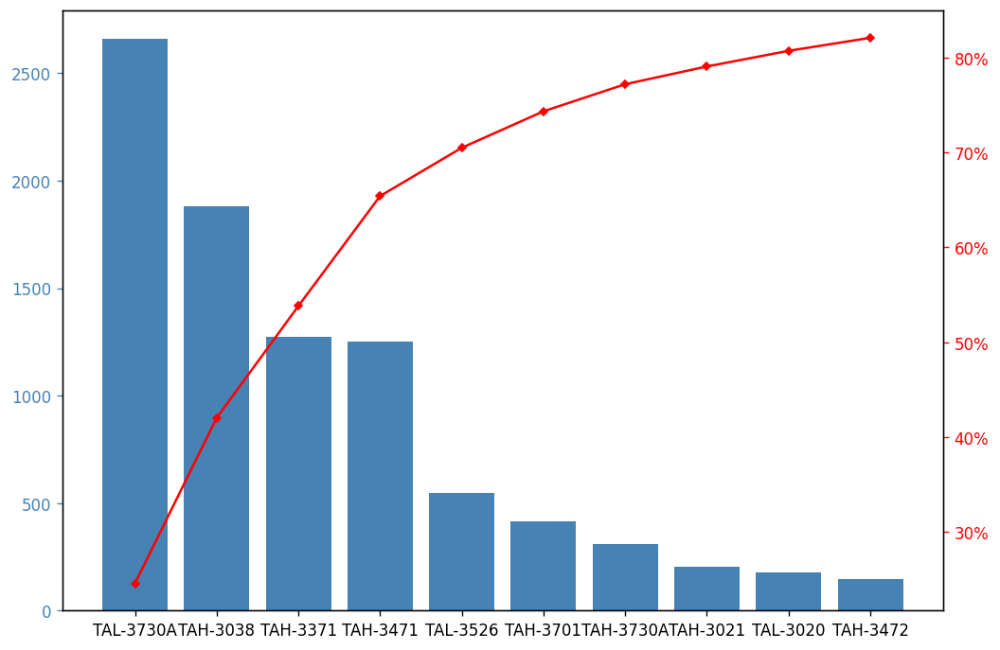

In [211]:
from matplotlib.ticker import PercentFormatter

#define aesthetics for plot
color1 = 'steelblue'
color2 = 'red'
line_size = 3

#create basic bar plot
fig, ax = plt.subplots()
ax.bar(df_pareto_temperature.index, df_pareto_temperature['Count'], color=color1)

#add cumulative percentage line to plot
ax2 = ax.twinx()
ax2.plot(df_pareto_temperature.index, df_pareto_temperature['cumperc'], color=color2, marker="D", ms=line_size)
ax2.yaxis.set_major_formatter(PercentFormatter())

#specify axis colors
ax.tick_params(axis='y', colors=color1)
ax2.tick_params(axis='y', colors=color2)

#display Pareto chart
plt.show()

●	TAL-3730A is Temperature low tag encountered more than 2500 times.
●	TAH-3038 is Distillate pump discharge temperature high for Evap 3 and 4 encountered more than 1500 times
●	TAH-3371 and TAH-3471 is Evap 3 and 4 Shell temperature high encountered more than 1000 times
●	Evap 3-4 distillate outlet temperature high and Evap 3-4 Shell temperature high tag alarms occurrence is more than 75% of alarms.


# Treemap for Temperature Tags

In [309]:
df_Treemap_Temperature = df_final.loc[(df_final['Naming']=='Temperature')]
df_Treemap_Temperature.reset_index(inplace=True,drop=True)
df_Treemap_Temperature.drop(df_Treemap_Temperature.index[df_Treemap_Temperature['TagName'] == 'PLC-3101-R06'], inplace = True)
df_Treemap_Temperature

,TagName,Count,Severity,Naming
0,TAL-3730A,2659,3,Temperature
1,TAH-3038,1883,3,Temperature
2,TAH-3371,1272,3,Temperature
3,TAH-3471,1251,3,Temperature
4,TAL-3526,549,3,Temperature
...,...,...,...,...
107,TAH-3642,1,3,Temperature
108,TAHH-3285B,1,2,Temperature
109,TAH-3285A,1,3,Temperature
110,TAHH-3487,1,2,Temperature


In [219]:
fig = px.treemap(df_Treemap_Temperature,path=['TagName'],values='Count',width=1600,height=800)
fig.show()

# Pressure Alarm Analysis

In [311]:
df_pareto_pressure = df_final.loc[(df_final['Naming']=='Pressure')]
df_pareto_pressure.reset_index(inplace=True,drop=True)
df_pareto_pressure = df_pareto_pressure.sort_values(by='Count', ascending=False)
df_pareto_pressure['cumperc'] = df_pareto_pressure['Count'].cumsum()/df_pareto_pressure['Count'].sum()*100
df_pareto_pressure.set_index(['TagName'],inplace=True)
df_pareto_pressure_final=df_pareto_pressure.head(10)
df_pareto_pressure_final

,Count,Severity,Naming,cumperc
TagName,,,,
PAH-3200,2333,3,Pressure,18.335429
PDAH-3190,1608,3,Pressure,30.972964
PAL-3390,651,3,Pressure,36.089280
PAL-3051,642,3,Pressure,41.134863
PAL-3472,605,3,Pressure,45.889657
PDIT-3091-FLT,517,3,Pressure,49.952845
PDAH-3094,456,3,Pressure,53.536624
PAL-3356,450,3,Pressure,57.073247
PIT-3029-FLT,384,3,Pressure,60.091166


Creating Pareto chart for pressure

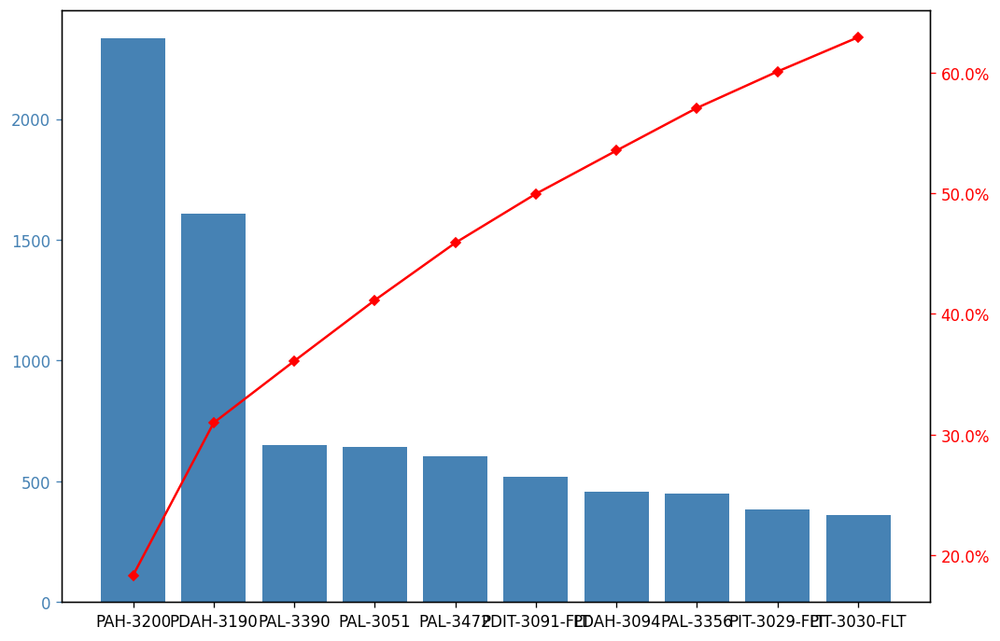

In [231]:
from matplotlib.ticker import PercentFormatter

#define aesthetics for plot
color1 = 'steelblue'
color2 = 'red'
line_size = 4

#create basic bar plot
fig, ax = plt.subplots()
ax.bar(df_pareto_pressure_final.index, df_pareto_pressure_final['Count'], color=color1)

#add cumulative percentage line to plot
ax2 = ax.twinx()
ax2.plot(df_pareto_pressure_final.index, df_pareto_pressure_final['cumperc'], color=color2, marker="D", ms=line_size)
ax2.yaxis.set_major_formatter(PercentFormatter())

#specify axis colors
ax.tick_params(axis='y', colors=color1)
ax2.tick_params(axis='y', colors=color2)

#display Pareto chart
plt.show()

●	PAH-3200 is water heater pressure high tag encountered more than 2000 times
●	PDAH-3190 and PAL-372 encountered more than 1500 times
●	Steam to brackish water heater pressure high high and pressure differential high tag alarm occurrence is 49%.


# Treemap for Pressure Alarms

In [233]:
df_pareto_pressure.reset_index(inplace=True)
df_pareto_pressure = df_pareto_pressure.rename(columns = {'index':'TagName'})

In [234]:
df_pareto_pressure

,TagName,Count,Severity,Naming,cumperc
0,PAH-3200,2333,3,Pressure,18.335429
1,PDAH-3190,1608,3,Pressure,30.972964
2,PAL-3390,651,3,Pressure,36.089280
3,PAL-3051,642,3,Pressure,41.134863
4,PAL-3472,605,3,Pressure,45.889657
...,...,...,...,...,...
164,PM-3451A,1,3,Pressure,99.968563
165,PM-3710-FTS,1,3,Pressure,99.976423
166,PM-3011-FLT,1,3,Pressure,99.984282
167,PAH-3701,1,3,Pressure,99.992141


In [235]:
fig = px.treemap(df_pareto_pressure,path=['TagName'],values='Count',width=1600,height=800)
fig.show()

# Flow Alarm Analysis

In [312]:
df_pareto_flow = df_final.loc[(df_final['Naming']=='Flow')]
df_pareto_flow.reset_index(inplace=True,drop=True)
df_pareto_flow = df_pareto_flow.sort_values(by='Count', ascending=False)
df_pareto_flow['cumperc'] = df_pareto_flow['Count'].cumsum()/df_pareto_flow['Count'].sum()*100
df_pareto_flow.set_index(['TagName'],inplace=True)
df_pareto_flow_final=df_pareto_flow.head(10)
df_pareto_flow_final

,Count,Severity,Naming,cumperc
TagName,,,,
FAL-3452A,1796,3,Flow,13.465287
FALL-3452A,1792,2,Flow,26.900585
FAL-3480,1580,3,Flow,38.746439
FAL-3030,1394,3,Flow,49.197781
FAL-3020,823,3,Flow,55.368121
FAL-3005,757,3,Flow,61.043635
FALL-3009,610,3,Flow,65.617034
FAL-3701,578,3,Flow,69.950517
FAL-3539,430,3,Flow,73.174389


Creating pareto chart for Flow

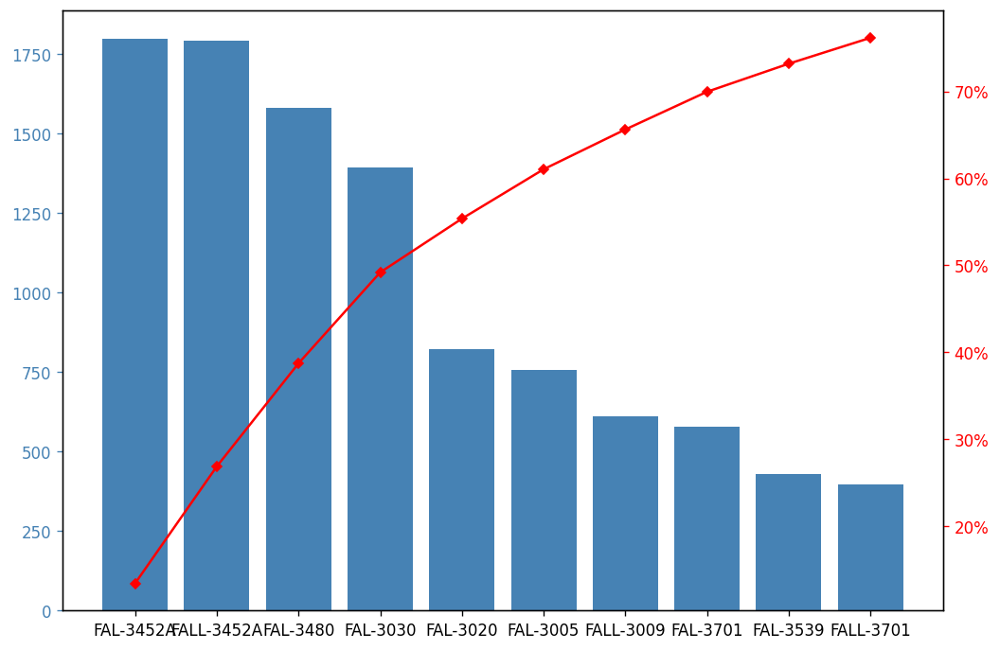

In [248]:
from matplotlib.ticker import PercentFormatter

#define aesthetics for plot
color1 = 'steelblue'
color2 = 'red'
line_size = 4

#create basic bar plot
fig, ax = plt.subplots()
ax.bar(df_pareto_flow_final.index, df_pareto_flow_final['Count'], color=color1)

#add cumulative percentage line to plot
ax2 = ax.twinx()
ax2.plot(df_pareto_flow_final.index, df_pareto_flow_final['cumperc'], color=color2, marker="D", ms=line_size)
ax2.yaxis.set_major_formatter(PercentFormatter())

#specify axis colors
ax.tick_params(axis='y', colors=color1)
ax2.tick_params(axis='y', colors=color2)

#display Pareto chart
plt.show()

●	FAL-3452A and FALL-3452A is Caustic to recirc pump flow low and flow low low tag encountered more than 1750 times.
●	Evap 3-4 caustic to recirc pump flow low and flow low low, Distillate pumps flow low and blowdown flow low tag alarm occurrence is more than 60%.


# Treemap for flow alarms

In [249]:
df_pareto_flow.reset_index(inplace=True)
df_pareto_flow = df_pareto_flow.rename(columns = {'index':'TagName'})

In [250]:
fig = px.treemap(df_pareto_flow,path=['TagName'],values='Count',width=1600,height=800)
fig.show()

# Level Alarm Analysis

In [251]:
df_pareto_level = df_final.loc[(df_final['Naming']=='Level')]
df_pareto_level.reset_index(inplace=True,drop=True)
df_pareto_level = df_pareto_level.sort_values(by='Count', ascending=False)
df_pareto_level['cumperc'] = df_pareto_level['Count'].cumsum()/df_pareto_level['Count'].sum()*100
df_pareto_level.set_index(['TagName'],inplace=True)
df_pareto_level_final = df_pareto_level.head(10)

Creating pareto chart for level Alarm

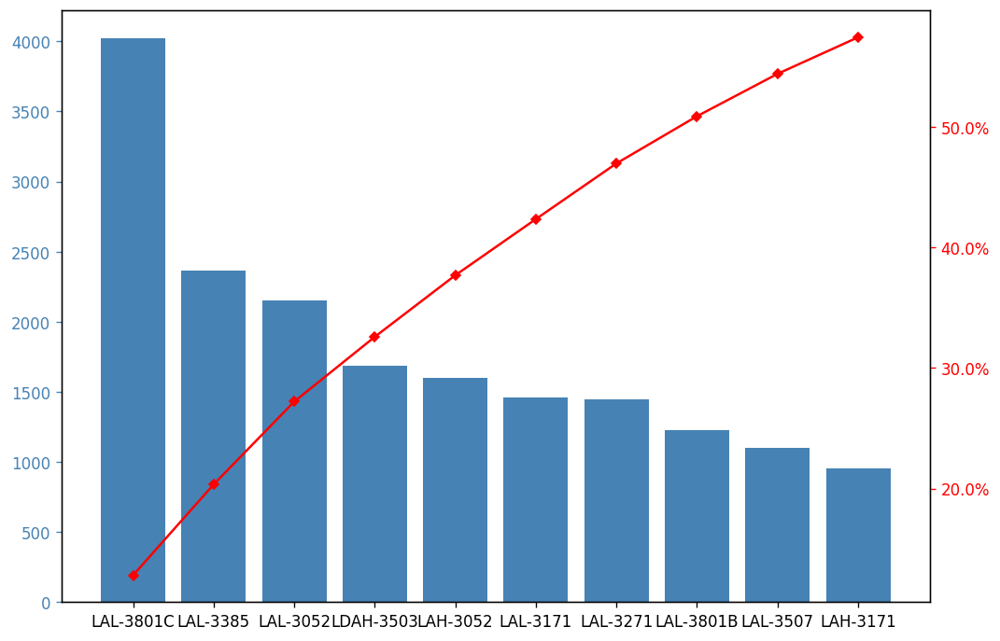

In [252]:
from matplotlib.ticker import PercentFormatter

#define aesthetics for plot
color1 = 'steelblue'
color2 = 'red'
line_size = 4

#create basic bar plot
fig, ax = plt.subplots()
ax.bar(df_pareto_level_final.index, df_pareto_level_final['Count'], color=color1)

#add cumulative percentage line to plot
ax2 = ax.twinx()
ax2.plot(df_pareto_level_final.index, df_pareto_level_final['cumperc'], color=color2, marker="D", ms=line_size)
ax2.yaxis.set_major_formatter(PercentFormatter())

#specify axis colors
ax.tick_params(axis='y', colors=color1)
ax2.tick_params(axis='y', colors=color2)

#display Pareto chart
plt.show()

# Treemap for Level alarms

In [253]:
df_pareto_level.reset_index(inplace=True)
df_pareto_level = df_pareto_level.rename(columns = {'index':'TagName'})

In [254]:
fig = px.treemap(df_pareto_level,path=['TagName'],values='Count',width=1600,height=800)
fig.show()

# Analysis of Alarms by Evaporator/Train

In [255]:
df_evaporator = pd.read_excel('/Users/neharajput/Downloads/Final_Alarm_DatasetV2.xlsx',parse_dates=['Date Timestamp'])

In [256]:
df_evaporator

,Date Timestamp,TagName,Severity,Grouping of Alarms,Naming
0,2018-12-01 01:02:41,HTCP-3196,3,Miscellaneous,Others
1,2018-12-01 01:08:32,HTCP-3196,3,Miscellaneous,Others
2,2018-12-01 01:14:01,HTCP-3196,3,Miscellaneous,Others
3,2018-12-01 01:23:19,HTCP-3196,3,Miscellaneous,Others
4,2018-12-01 01:28:14,HTCP-3196,3,Miscellaneous,Others
...,...,...,...,...,...
85392,2020-10-26 15:12:34,PM-3505,3,Miscellaneous,Pressure
85393,2020-10-26 16:02:56,PM-3505,3,Miscellaneous,Pressure
85394,2020-11-14 05:29:17,MM-3504,1,Miscellaneous,Others
85395,2020-11-14 05:29:17,PM-3505,3,Miscellaneous,Pressure


In [313]:
df_evaporator_1 = df_evaporator.loc[(df_evaporator['Grouping of Alarms']=='Evap 1')]
df_evap1=df_evaporator_1['TagName'].value_counts()
df_final_evap1 = df_evap1.to_frame()
df_final_evap1 = df_final_evap1.rename(columns={'TagName': 'Count'})
df_final_evap1.reset_index(inplace=True)
df_final_evap1 = df_final_evap1.rename(columns = {'index':'TagName'})
df_final_evap1=df_final_evap1.merge(df_evaporator_1,on='TagName',how='left')
df_final_evap1

,TagName,Count,Date Timestamp,Severity,Grouping of Alarms,Naming
0,PAL-3190,182,2019-09-07 12:52:02,3,Evap 1,Pressure
1,PAL-3190,182,2020-01-07 16:37:47,3,Evap 1,Pressure
2,PAL-3190,182,2020-01-07 16:38:13,3,Evap 1,Pressure
3,PAL-3190,182,2020-01-07 17:47:37,3,Evap 1,Pressure
4,PAL-3190,182,2020-01-07 21:32:51,3,Evap 1,Pressure
...,...,...,...,...,...,...
363,LAHH-3171,14,2020-06-19 13:24:23,2,Evap 1,Level
364,LAHH-3171,14,2020-07-14 11:05:01,2,Evap 1,Level
365,LAHH-3171,14,2020-11-14 04:07:41,2,Evap 1,Level
366,VAH-3049B,2,2019-06-16 03:12:25,3,Evap 1,Others


# Bar Chart for Evap 1 Alarm Tags

<AxesSubplot:>

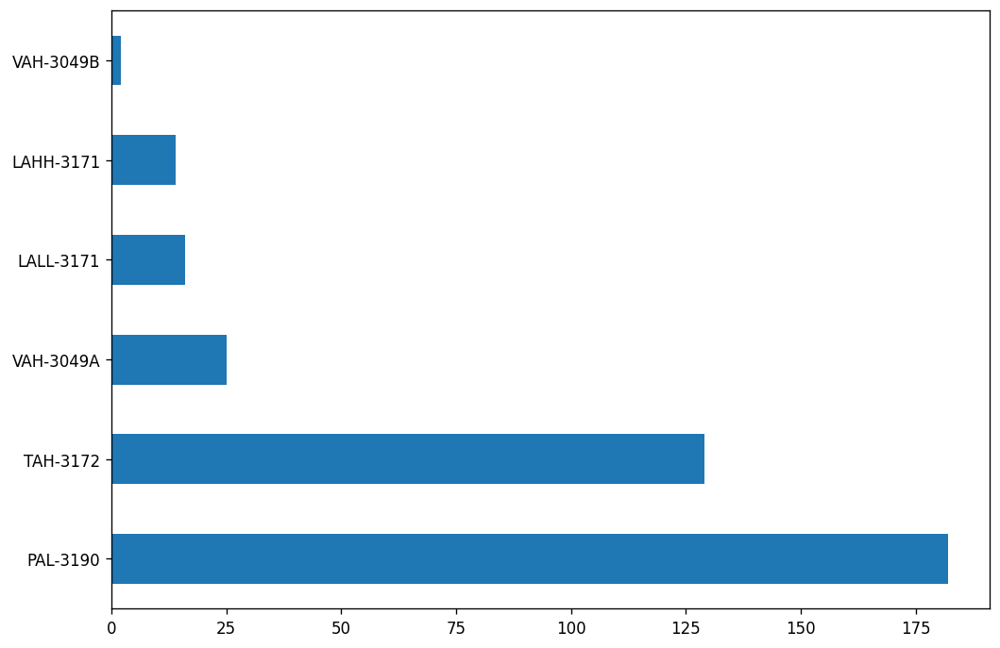

In [268]:
df_final_evap1['TagName'].value_counts().plot(kind='barh')

Evaporator no. 1 low pressure(PAL-3190) and recirculation pump temperature high(TAH-3172) is generating more alarms.

Evaporator 2 analysis

In [314]:
df_evaporator_2 = df_evaporator.loc[(df_evaporator['Grouping of Alarms']=='Evap 2')]
df_evap2=df_evaporator_2['TagName'].value_counts()
df_final_evap2 = df_evap2.to_frame()
df_final_evap2 = df_final_evap2.rename(columns={'TagName': 'Count'})
df_final_evap2.reset_index(inplace=True)
df_final_evap2 = df_final_evap2.rename(columns = {'index':'TagName'})
df_final_evap2=df_final_evap2.merge(df_evaporator_2,on='TagName',how='left')
df_final_evap2

,TagName,Count,Date Timestamp,Severity,Grouping of Alarms,Naming
0,PAL-3290,345,2019-01-09 20:39:38,3,Evap 2,Pressure
1,PAL-3290,345,2019-01-09 22:58:25,3,Evap 2,Pressure
2,PAL-3290,345,2019-01-09 23:05:13,3,Evap 2,Pressure
3,PAL-3290,345,2019-01-09 23:05:34,3,Evap 2,Pressure
4,PAL-3290,345,2019-01-09 23:06:01,3,Evap 2,Pressure
...,...,...,...,...,...,...
768,LAHH-3271,12,2019-12-21 16:23:44,2,Evap 2,Level
769,LAHH-3271,12,2019-12-21 16:24:18,2,Evap 2,Level
770,LAHH-3271,12,2020-07-14 12:54:47,2,Evap 2,Level
771,LAHH-3271,12,2020-11-14 04:07:40,2,Evap 2,Level


# Bar Chart for Evap 2 alarm tags

<AxesSubplot:>

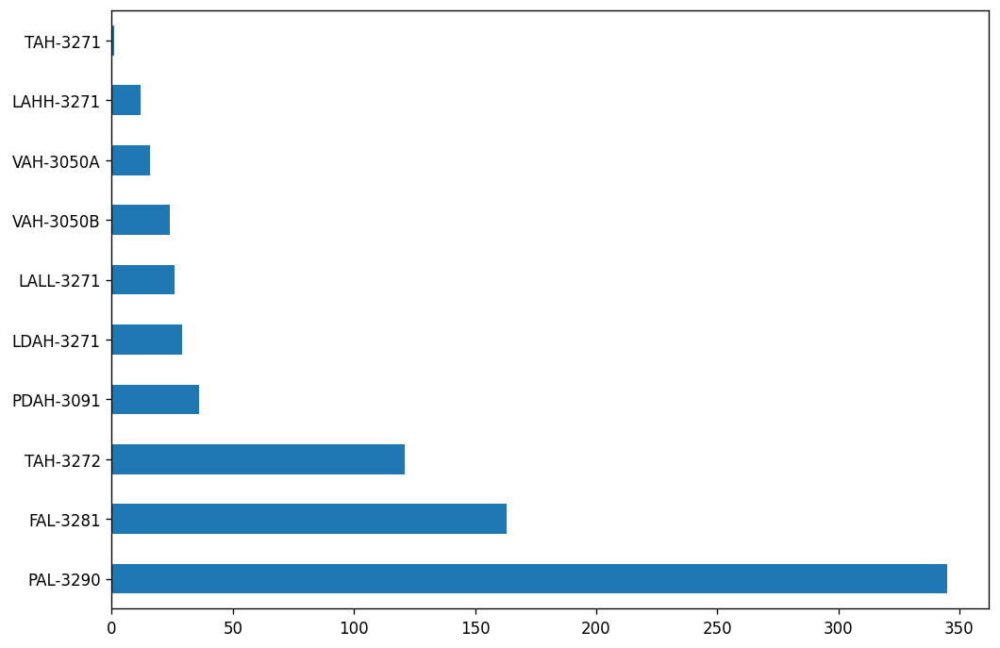

In [278]:
df_final_evap2['TagName'].value_counts().plot(kind='barh')

Evaporator no. 2 sump low pressure and low flow has a large number of alarms.

# Evaporator 3 analysis

In [279]:
df_evaporator_3 = df_evaporator.loc[(df_evaporator['Grouping of Alarms']=='Evap 3')]

<AxesSubplot:>

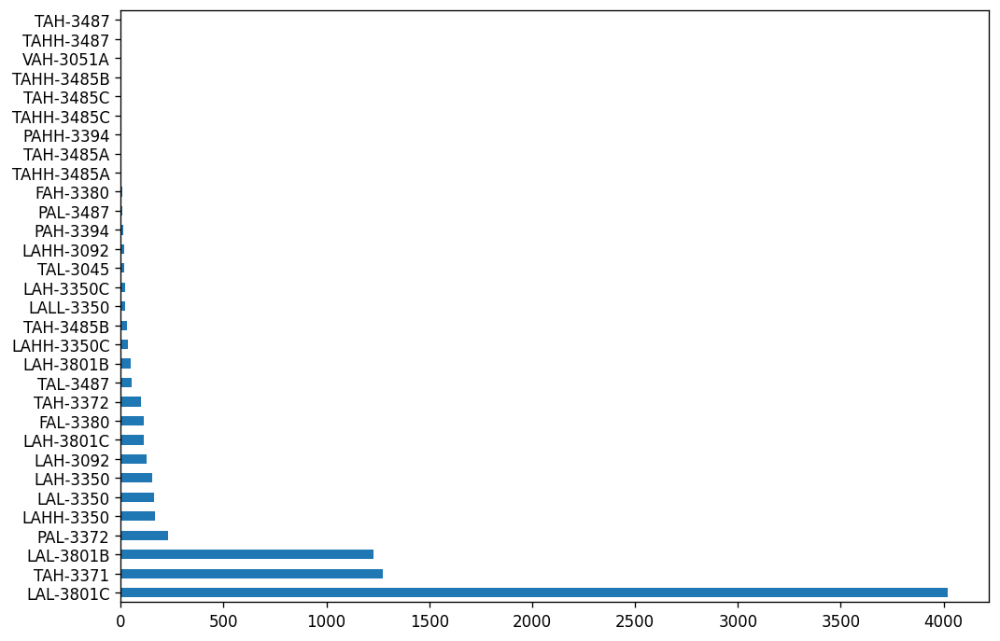

In [280]:
df_evap3=df_evaporator_3['TagName'].value_counts()
df_final_evap3 = df_evap3.to_frame()
df_final_evap3 = df_final_evap3.rename(columns={'TagName': 'Count'})
df_final_evap3.reset_index(inplace=True)
df_final_evap3 = df_final_evap3.rename(columns = {'index':'TagName'})
df_final_evap3=df_final_evap3.merge(df_evaporator_3,on='TagName',how='left')
df_final_evap3['TagName'].value_counts().plot(kind='barh')

Evap 3 building 35 sump level low is generating maximum number of alarms. After that shell temperature high and building 33 sump level low are generating around 1250-1400 alarms each.

# Evaporator 4 Analysis

<AxesSubplot:>

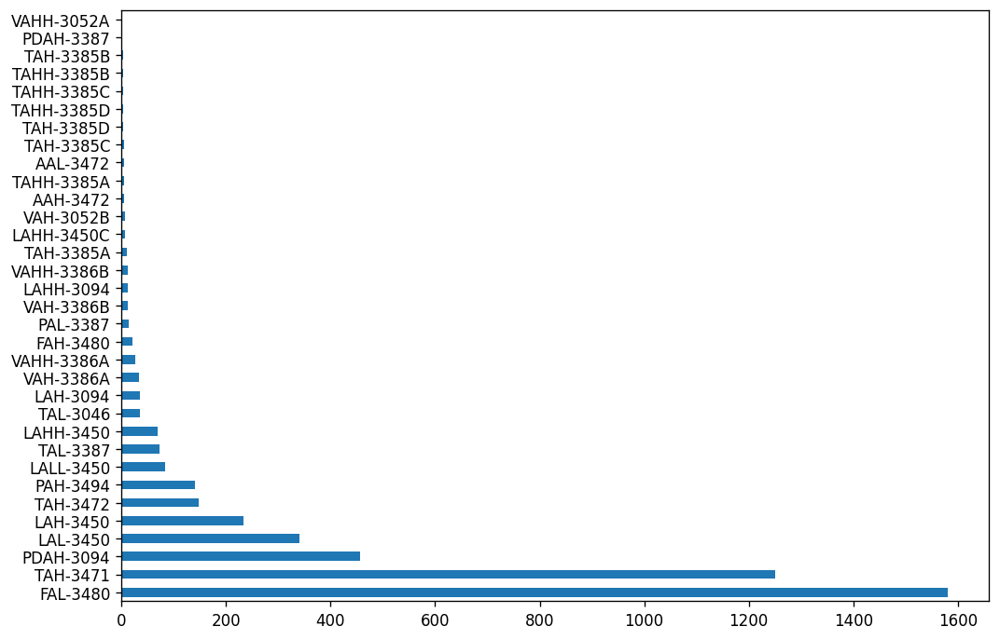

In [281]:
df_evaporator_4 = df_evaporator.loc[(df_evaporator['Grouping of Alarms']=='Evap 4')]
df_evap4=df_evaporator_4['TagName'].value_counts()
df_final_evap4 = df_evap4.to_frame()
df_final_evap4 = df_final_evap4.rename(columns={'TagName': 'Count'})
df_final_evap4.reset_index(inplace=True)
df_final_evap4 = df_final_evap4.rename(columns = {'index':'TagName'})
df_final_evap4=df_final_evap4.merge(df_evaporator_4,on='TagName',how='left')
df_final_evap4['TagName'].value_counts().plot(kind='barh')

In Evap 4, blowdown flow low and shell temperature high are generating maximum number of alarms.

# Train 1 : Evap 1 & 2 Analysis

<AxesSubplot:>

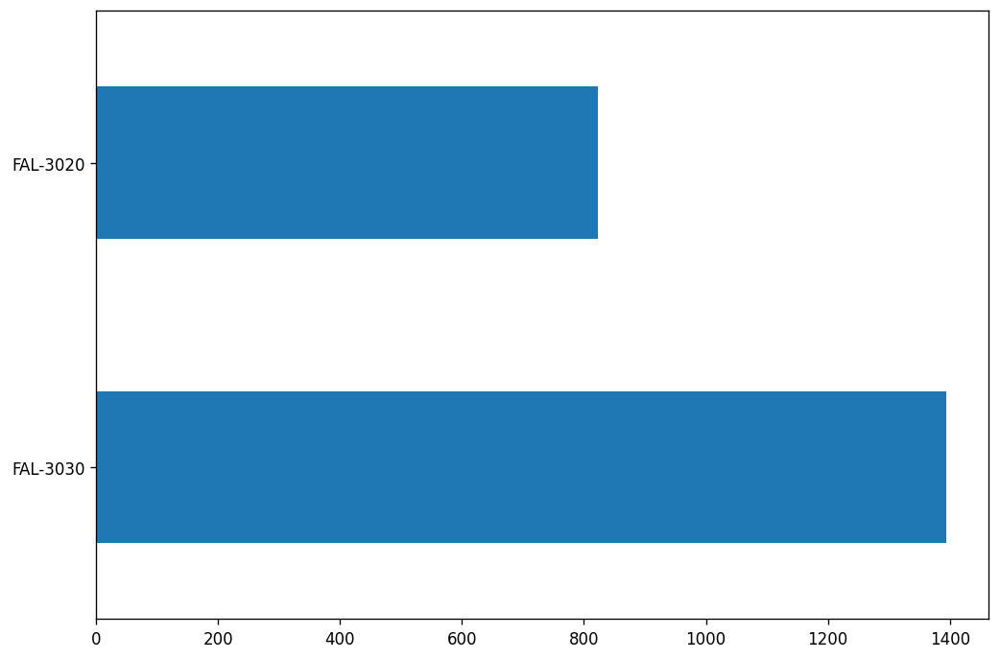

In [282]:
df_train_1 = df_evaporator.loc[(df_evaporator['Grouping of Alarms']=='Evap 1&2')]
df_train1=df_train_1['TagName'].value_counts()
df_final_train1 = df_train1.to_frame()
df_final_train1 = df_final_train1.rename(columns={'TagName': 'Count'})
df_final_train1.reset_index(inplace=True)
df_final_train1 = df_final_train1.rename(columns = {'index':'TagName'})
df_final_train1=df_final_train1.merge(df_train_1,on='TagName',how='left')
df_final_train1['TagName'].value_counts().plot(kind='barh')

Evap 1/2 FAL-3030 and FAL-3020 for flow low are encountering 1400 and 800 alarms.

# Train 2: Evap 3 and 4 Analysis

<AxesSubplot:>

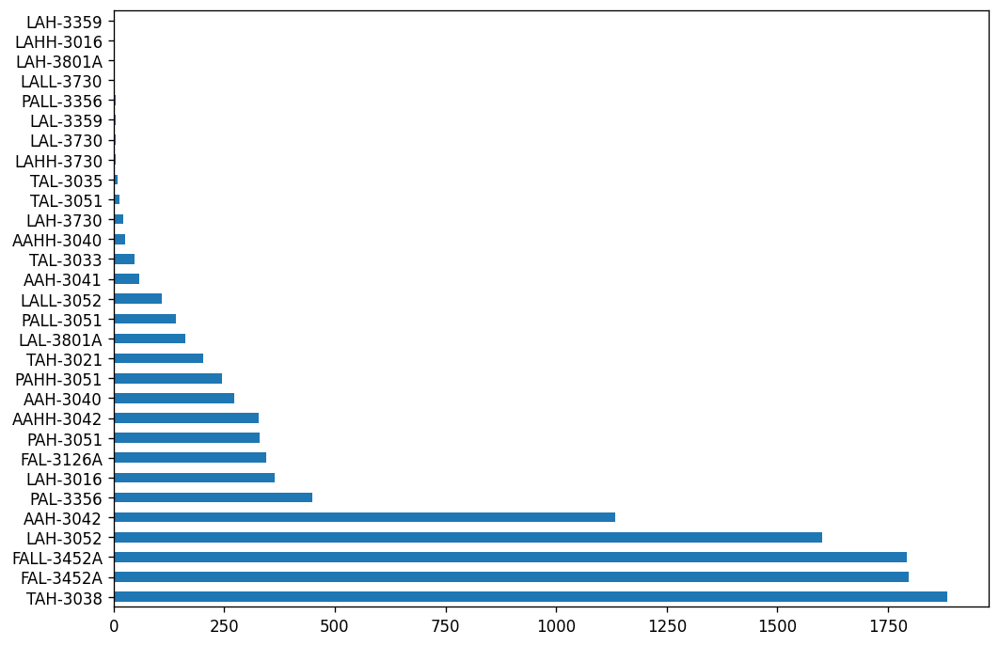

In [283]:
df_train_2 = df_evaporator.loc[(df_evaporator['Grouping of Alarms']=='Evap 3 & 4')]
df_train2=df_train_2['TagName'].value_counts()
df_final_train2 = df_train2.to_frame()
df_final_train2 = df_final_train2.rename(columns={'TagName': 'Count'})
df_final_train2.reset_index(inplace=True)
df_final_train2 = df_final_train2.rename(columns = {'index':'TagName'})
df_final_train2=df_final_train2.merge(df_train_2,on='TagName',how='left')
df_final_train2['TagName'].value_counts().plot(kind='barh')

 In Train 2, TAH-3038 and FAL-3452A are creating more than 1500 alarms each

# Alarms by Month Analysis

In [284]:
df = pd.read_csv('/Users/neharajput/Downloads/Visualization_Dataset_Python_Final.csv', parse_dates=['Date Timestamp'])

In [285]:
df

,Date Timestamp,TagName,Naming,Severity
0,2018-12-01 01:02:00,HTCP-3196,Others,3
1,2018-12-01 01:08:00,HTCP-3196,Others,3
2,2018-12-01 01:14:00,HTCP-3196,Others,3
3,2018-12-01 01:23:00,HTCP-3196,Others,3
4,2018-12-01 01:28:00,HTCP-3196,Others,3
...,...,...,...,...
85392,2020-10-26 15:12:00,PM-3505,Pressure,3
85393,2020-10-26 16:02:00,PM-3505,Pressure,3
85394,2020-11-14 05:29:00,MM-3504,Others,1
85395,2020-11-14 05:29:00,PM-3505,Pressure,3


In [315]:
df = df.rename(columns={'Date Timestamp': 'Date_Timestamp'})
df['Month'] = pd.DatetimeIndex(df['Date_Timestamp']).month
df_month = df[['TagName','Month','Naming']].groupby(['Month','Naming'],axis=0).count()
df_month_final= df[['TagName','Month','Naming']].groupby(['Month','Naming'],axis=0).size().unstack()
df_month_final

Naming,Flow,Level,Others,Pressure,Temperature
Month,,,,,
1,1117,3883,1737,852,765
2,839,1831,1025,519,1089
3,703,1521,849,921,490
4,2445,1839,2468,1490,812
5,1159,2747,1093,554,889
6,1151,2577,1276,1666,613
7,783,2699,1678,841,803
8,1053,2148,1299,1344,604
9,358,1191,849,795,834


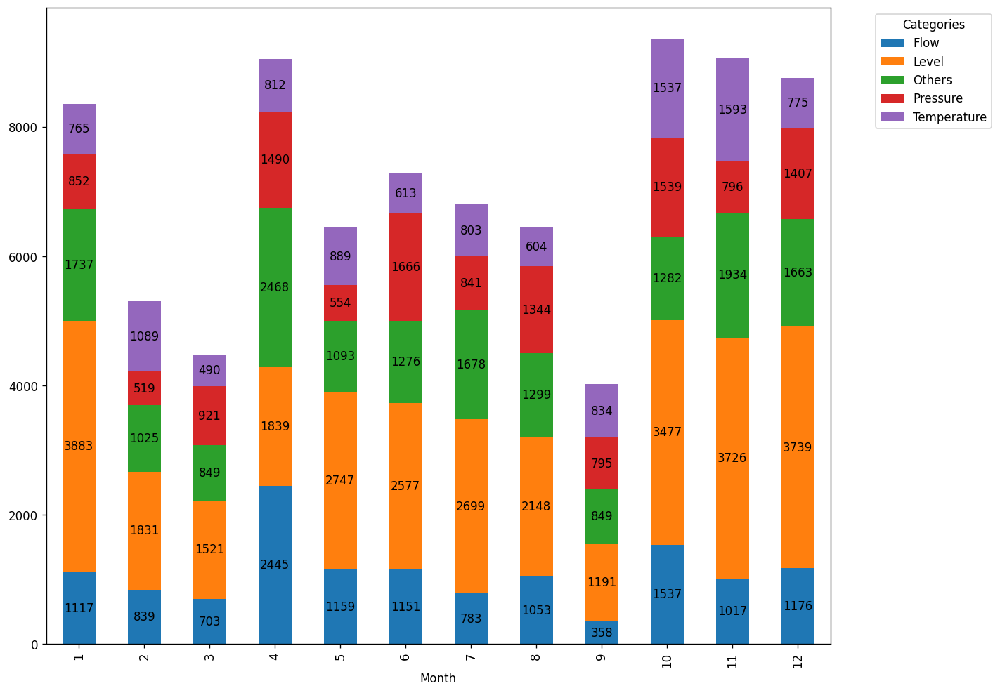

In [316]:
ax = df_month_final.plot.bar(stacked=True, figsize=(12, 10))

for c in ax.containers:
    ax.bar_label(c, label_type='center')

ax.legend(title='Categories', bbox_to_anchor=(1.05, 1), loc='upper left')

From the above stacked bar chart , most number of alarm tags are generated by Level based tags

# Alarm Analysis by Day

In [317]:
df['Day'] = pd.DatetimeIndex(df['Date_Timestamp']).day
df_day = df[['TagName','Day','Naming']].groupby(['Day','Naming'],axis=0).size().unstack()
df_day

Naming,Flow,Level,Others,Pressure,Temperature
Day,,,,,
1,418,879,417,190,247
2,113,589,502,150,242
3,170,761,461,157,415
4,122,780,454,440,1005
5,153,508,425,79,540
6,231,715,610,183,200
7,249,822,634,356,257
8,702,1233,843,959,385
9,299,764,557,466,242


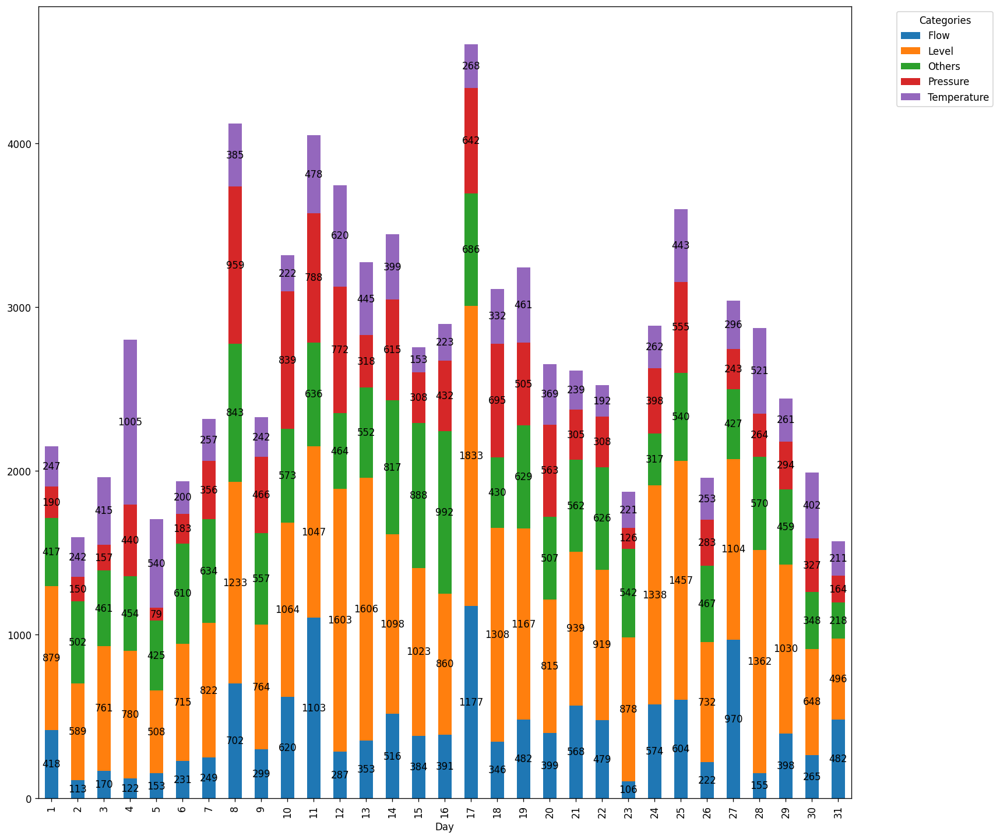

In [298]:
ax = df_day.plot.bar(stacked=True, figsize=(15, 15))

for c in ax.containers:
    ax.bar_label(c, label_type='center')

ax.legend(title='Categories', bbox_to_anchor=(1.05, 1), loc='upper left')

The peak of the alarm count is after the start of the month. Probably after 7th day of the month upto end of the month

# Alarms by hour

In [318]:
df['Hour'] = pd.DatetimeIndex(df['Date_Timestamp']).hour
df_hour = df[['TagName','Hour','Naming']].groupby(['Hour','Naming'],axis=0).size().unstack()
df_hour

Naming,Flow,Level,Others,Pressure,Temperature
Hour,,,,,
0,391,1208,610,674,537
1,325,1038,538,493,422
2,325,1174,514,280,345
3,303,1189,529,449,415
4,281,1052,575,419,384
5,390,1221,499,402,343
6,362,1088,495,668,341
7,319,1123,712,679,440
8,517,1264,850,468,419


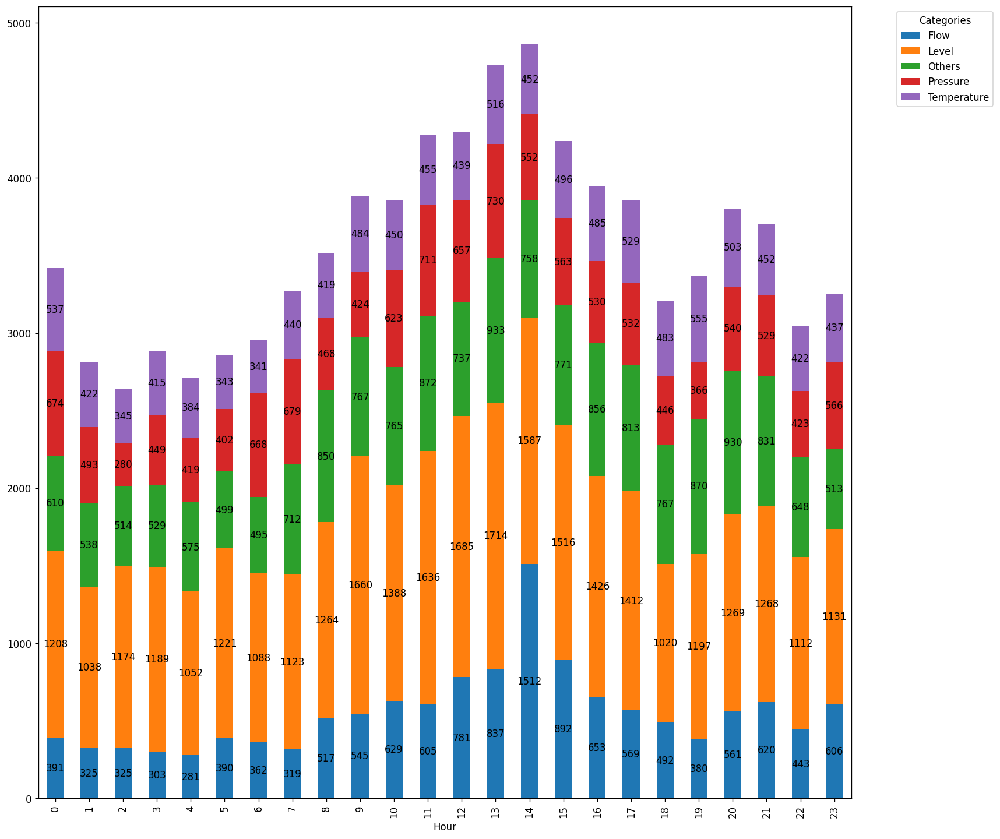

In [302]:
ax = df_hour.plot.bar(stacked=True, figsize=(15, 15))

for c in ax.containers:
    ax.bar_label(c, label_type='center')

ax.legend(title='Categories', bbox_to_anchor=(1.05, 1), loc='upper left')

Maximum number of alarms are getting generated in the middle of the day i.e afternoon from 12pm to 5 pm.

# Analysing alarms by severity

In [303]:
df_final

,TagName,Count,Severity,Naming
0,LAL-3801C,4020,3,Level
1,AAHH-3032,2999,2,Others
2,TAL-3730A,2659,3,Temperature
3,AAH-3032,2570,3,Others
4,LAL-3385,2363,3,Level
...,...,...,...,...
696,PM-3717-FTS,1,3,Pressure
697,PAHH-3294,1,2,Pressure
698,XV-3379-UCOS,1,3,Others
699,LAH-3720,1,3,Level


In [304]:
fig = px.treemap(df_final,path=['Severity','Naming','TagName'],values='Count',width=1600,height=800)
fig.show()

1)	Most alarms are generated with Severity 3: 
2)	Severity 2 based alarms:  Severity 2 based alarms contain distillate turbidity and conductivity high and also Evaporator 3 and 4 recirculation pump flow low low.
3)	Severity 1 based alarms
